In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
from statsmodels.tsa.deterministic import DeterministicProcess, CalendarFourier, Fourier

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

from sklearn.svm import SVR
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler


from torch.utils.data import Dataset, Subset


import ipdb


from torch import nn
from torch.utils.data import DataLoader
import torch

import warnings
warnings.filterwarnings('ignore')

import time


plt.rcParams['figure.figsize'] = (20, 10)

In [87]:
flu_id = pd.read_csv("VIW_FID_EPI.csv")
#flu_net = pd.read_csv("data\\VIW_FNT_6-26-2023.csv")
flu_net = pd.read_csv("VIW_FNT.csv")

flu_dict = pd.read_csv("VIW_FLU_METADATA.csv")
flu_surv= pd.read_csv("Weekly_Data_Counts_by_Virus.csv ")

In [7]:
def create_all_fourier(period):
    fourier = []
    for j in range(int(np.floor(period/2))):
        fourier.append(Fourier(period,j))
    return fourier

In [8]:
def pd_to_weektime(df):
    
    indices_ = list(df.index)
    indices_.sort()
    df = df.loc[indices_]

    indices_new = []
    for i in range(len(indices_)):
        d =  str(indices_[i])[:4]+"-"+str(indices_[i])[4:]
       # d= datetime.datetime.strptime(d + '-1', "%Y-%W-%w")
        indices_new.append(d)
    indices_new
    df.index = indices_new
    return df

In [9]:
def create_lags(df,col,num_lags,start,space):
    df_new = df.copy()
    for i in range(num_lags):
        new_col = col+"_lag_"+str(start+i*space)
        df_new[new_col] = df_new[col].shift(start + i*space).fillna(0.0)
    return df_new.drop([col],axis=1)

In [10]:
class BoostedHybrid:
    def __init__(self,model1,model2):
        self.model1= model1
        self.model2= model2
        self.y_columns = None

    def fit(self,X_1,X_2,y):
        self.model1.fit(X_1,y)
        y_fit=pd.DataFrame(self.model1.predict(X_1),index=X_1.index,columns=y.columns)
        y_resid = y-y_fit
        y_resid = y_resid.stack().squeeze()
        
        self.model2.fit(X_2,y_resid)

        self.y_columns=y.columns
        self.y_fit = y_fit
        self.y_resid = y_resid
    def predict(self,X_1,X_2):
        y_pred = pd.DataFrame(self.model1.predict(X_1),index=X_1.index,columns=self.y_columns)
        y_pred = y_pred.stack().squeeze()
        y_pred +=self.model2.predict(X_2)
        return y_pred.unstack()

In [11]:
def fix_flu_surv(flu_surv):
    columns =["SEASON", "WEEK_NUMBER", "INFLUENZA A", "INFLUENZA B", "INFLUENZA A AND B"]
    data = []
    print(columns)

    for i in range(len(flu_surv)-1):
        data.append(flu_surv.iloc[i+1].name)
    data = np.array(data)
    print(data.shape)
    return pd.DataFrame(data=data,columns = columns)

In [13]:
def pdflusurv_to_weektime(df):
    
    indices_ = list(df.index)
   # indices_.sort()
    df = df.loc[indices_]

    indices_new = []
    for i in range(len(indices_)):
        d =  str(indices_[i])[:5]
        if len(str(indices_[i])[5:]) == 1:
            d+='0'
        d+=str(indices_[i])[5:]
       # d= datetime.datetime.strptime(d + '-1', "%Y-%W-%w")
        indices_new.append(d)
    indices_new
    df.index = indices_new
    return df

# Flu surv data load

In [88]:
flu_surv = fix_flu_surv(flu_surv)
flu_surv

['SEASON', 'WEEK_NUMBER', 'INFLUENZA A', 'INFLUENZA B', 'INFLUENZA A AND B']
(614, 5)


,SEASON,WEEK_NUMBER,INFLUENZA A,INFLUENZA B,INFLUENZA A AND B
0,2003-04,2003-40,0,0,0
1,2003-04,2003-41,1,0,0
2,2003-04,2003-42,0,0,0
3,2003-04,2003-43,0,0,0
4,2003-04,2003-44,3,0,0
...,...,...,...,...,...
609,2022-23,2023-15,29,36,1
610,2022-23,2023-16,31,25,0
611,2022-23,2023-17,22,26,0
612,1. The Influenza Hospitalization Surveillance ...,nan,nan,nan,nan


In [89]:
flu_surv = flu_surv.set_index('WEEK_NUMBER')
flu_surv["INFLUENZA A"] = flu_surv["INFLUENZA A"].astype('float32')
flu_surv["INFLUENZA B"] = flu_surv["INFLUENZA B"].astype('float32')
flu_surv = flu_surv.fillna(0.0)

In [90]:
flu_surv = pdflusurv_to_weektime(flu_surv[:'2023-17'])

In [91]:
flu_surv['INF_ALL'] = flu_surv['INFLUENZA A']+flu_surv['INFLUENZA B']

In [92]:
flu_surv

,SEASON,INFLUENZA A,INFLUENZA B,INFLUENZA A AND B,INF_ALL
2003-40,2003-04,0.0,0.0,0,0.0
2003-41,2003-04,1.0,0.0,0,1.0
2003-42,2003-04,0.0,0.0,0,0.0
2003-43,2003-04,0.0,0.0,0,0.0
2003-44,2003-04,3.0,0.0,0,3.0
...,...,...,...,...,...
2023-13,2022-23,41.0,34.0,0,75.0
2023-14,2022-23,46.0,27.0,0,73.0
2023-15,2022-23,29.0,36.0,1,65.0
2023-16,2022-23,31.0,25.0,0,56.0


# Southern Country Correlations

In [14]:
southern_countries = list(flu_net[flu_net.HEMISPHERE=="SH"]["COUNTRY_CODE"].unique())

In [20]:
def make_corrs(country_list):

    corrs_ = []
    for country in country_list:
        df_infall = flu_net[flu_net.COUNTRY_CODE == country][["MMWRYW","INF_ALL"]].groupby("MMWRYW").sum()
        df_infall = pd_to_weektime(df_infall)
        df_infall = df_infall.fillna(0.0)
        df_infall = create_lags(df_infall,'INF_ALL',40,1,1)
        df_infall = flu_surv.join(df_infall,on=flu_surv.index,lsuffix='_USA').loc['2012-01':]
        print(df_infall.corr())
        
        corrs_.append(abs(df_infall.corr()['INF_ALL']))

    return corrs_

In [21]:
corrs_ = make_corrs(southern_countries)

                INFLUENZA A  INFLUENZA B   INF_ALL  INF_ALL_lag_1  \
INFLUENZA A        1.000000     0.377694  0.979877       0.517167   
INFLUENZA B        0.377694     1.000000  0.554911       0.454224   
INF_ALL            0.979877     0.554911  1.000000       0.562558   
INF_ALL_lag_1      0.517167     0.454224  0.562558       1.000000   
INF_ALL_lag_2      0.472005     0.511752  0.534765       0.799514   
INF_ALL_lag_3      0.406875     0.543600  0.483463       0.695215   
INF_ALL_lag_4      0.326064     0.533211  0.408857       0.567412   
INF_ALL_lag_5      0.249637     0.507121  0.334729       0.389161   
INF_ALL_lag_6      0.168050     0.467486  0.253010       0.276849   
INF_ALL_lag_7      0.102648     0.421827  0.184454       0.169024   
INF_ALL_lag_8      0.043053     0.343093  0.113835       0.106664   
INF_ALL_lag_9     -0.005152     0.271737  0.055031       0.062077   
INF_ALL_lag_10    -0.036266     0.210533  0.013750       0.023628   
INF_ALL_lag_11    -0.069013     0.

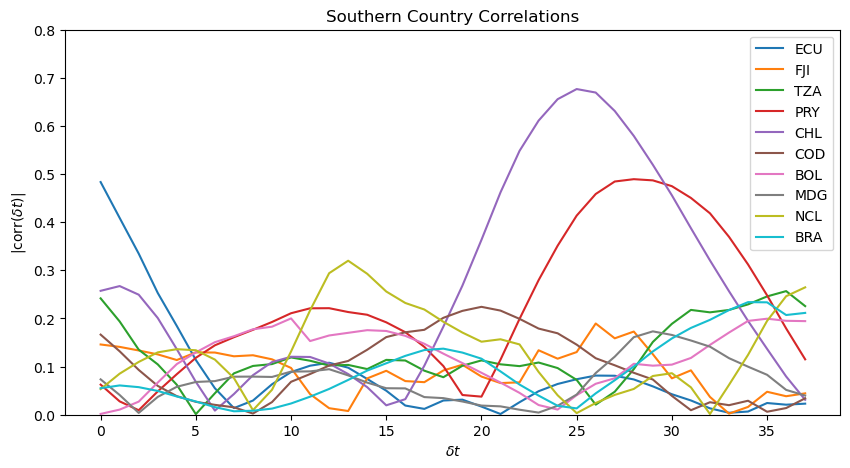

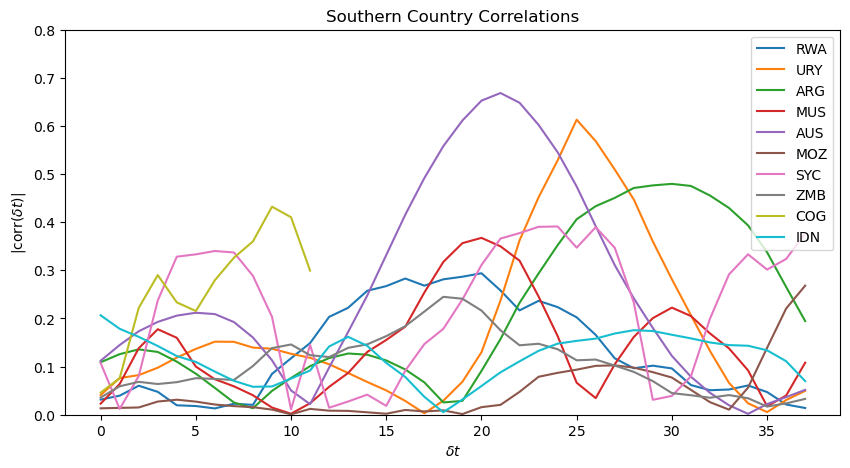

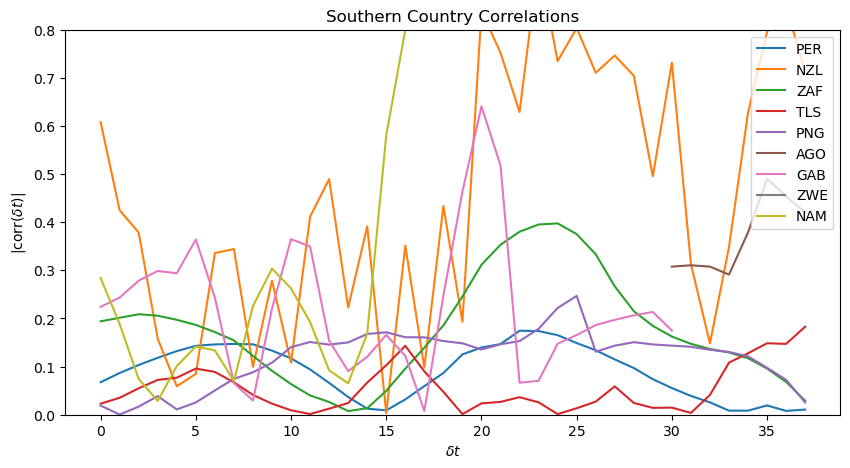

In [28]:
N = len(southern_countries)
batch_num = int(np.floor(N/10))+1
plt.rcParams['figure.figsize'] = (10, 5)

for b in range(batch_num):
    for i in range(b*10,(b+1)*10):
        if i < len(corrs_):

            tmp = corrs_[i]
            tmp = tmp[5:]
            plt.plot(range(0,len(tmp)),tmp,label=southern_countries[i])
            plt.ylim([0,0.8])
    plt.legend(loc='upper right')
    plt.title("Southern Country Correlations")
    plt.ylabel('|corr($\delta t$)|')
    plt.xlabel('$\delta t$')
    plt.show()

In [95]:
# southern countries with reasonable correlations
country_keep = ["AUS","CHL","PRY","ARG","URY"]
corrs_keep = make_corrs(country_keep)

NameError: name 'make_corrs' is not defined

Text(0.5, 0, '$\\delta t$')

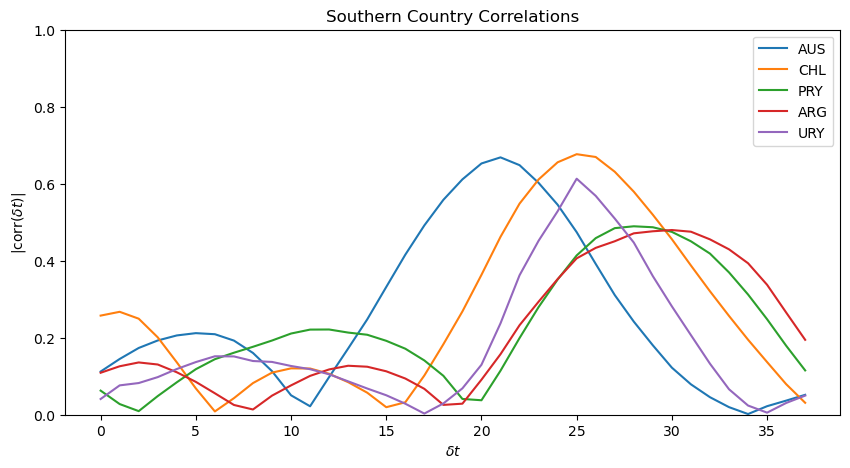

In [27]:
plt.rcParams['figure.figsize'] = (10, 5)
for i in range(len(corrs_keep)):
    tmp = corrs_keep[i]
    tmp = tmp[5:]
    plt.plot(range(0,len(tmp)),tmp,label=country_keep[i])
    plt.ylim([0,1])
plt.legend(loc='upper right')
plt.title("Southern Country Correlations")
plt.ylabel('|corr($\delta t$)|')
plt.xlabel('$\delta t$')

In [93]:
def join_countries(country_list):

    
    c = 0
    country_codes = country_list
    for country in country_codes:
        tmp = flu_net[flu_net.COUNTRY_CODE == country][["MMWRYW","INF_ALL"]]
        tmp = tmp.groupby("MMWRYW").sum() #.set_index("MMWRYW")
        tmp = pd_to_weektime(tmp)
        tmp.columns = ["INF_ALL"+country]
        if c == 0:
            df = tmp
            c+=1
        else:
            df = df.join(tmp,on=df.index)

    return df

In [96]:
df_in = join_countries(country_keep)

In [97]:
# normalizations

df_norm = df_in.copy()
#df_norm[df_norm.columns] = np.log(df_norm.replace(0,1))
df_norm[df_norm.columns] = MinMaxScaler().fit_transform(df_norm)

In [98]:
df_in = df_norm

In [99]:
usa_infall_norm = flu_surv.copy()
norms = MinMaxScaler().fit_transform(pd.DataFrame(data=usa_infall_norm["INF_ALL"].values,columns = ["INF_ALL"]))
#norms[norms == 0] = 1e-6
usa_infall_norm["INF_ALL"] = norms
usa_infall_norm = usa_infall_norm.fillna(0.0)

In [100]:
df = df_in.join(usa_infall_norm,on=df_in.index)
df = df.fillna(0.0)

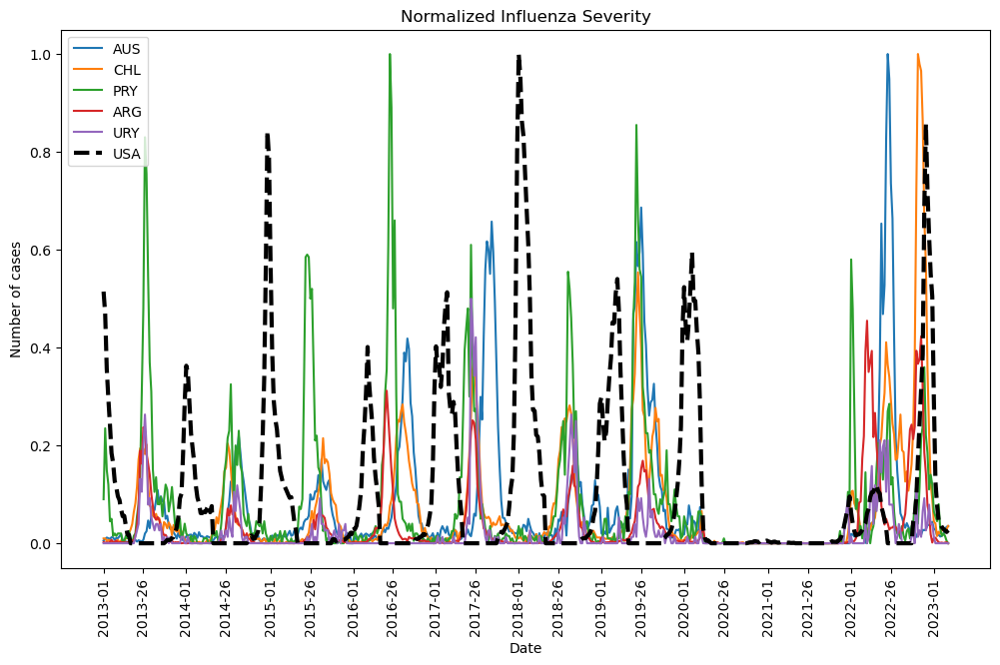

In [101]:
plt.plot(df['INF_ALLAUS'].loc['2013-01':],label='AUS')
plt.plot(df['INF_ALLCHL'].loc['2013-01':],label='CHL')
plt.plot(df['INF_ALLPRY'].loc['2013-01':],label='PRY')
plt.plot(df['INF_ALLARG'].loc['2013-01':],label='ARG')
plt.plot(df['INF_ALLURY'].loc['2013-01':],label='URY')
plt.plot(df['INF_ALL'].loc['2013-01':],label='USA',color='black',linewidth=3,linestyle='dashed')

x_ticks=['2013-01','2013-26','2014-01','2014-26','2015-01','2015-26','2016-01','2016-26','2017-01','2017-26','2018-01','2018-26','2019-01','2019-26','2020-01','2020-26','2021-01','2021-26','2022-01','2022-26','2023-01']
plt.xticks(ticks = x_ticks,rotation=90,size=10)
plt.legend(loc="upper left")
plt.title('Normalized Influenza Severity')
plt.ylabel('Number of cases')
plt.xlabel('Date')
plt.show()

In [102]:
usa_infall_norm = df['INF_ALL']

In [106]:
usa_infall_norm.columns = ['INF_ALL']

# Scikit-learn models

In [72]:
usa_infall = flu_surv["INF_ALL"]

In [27]:
df_tmp = flu_net[flu_net.COUNTRY_CODE == "CHL"][["MMWRYW","INF_ALL"]].groupby("MMWRYW").sum()
df_tmp = pd_to_weektime(df_tmp)
X_lags_CHL = create_lags(df_tmp,"INF_ALL", 10,20,1)
#############
df_tmp = flu_net[flu_net.COUNTRY_CODE == "PRY"][["MMWRYW","INF_ALL"]].groupby("MMWRYW").sum()
df_tmp = pd_to_weektime(df_tmp)
X_lags_PRY = create_lags(df_tmp,"INF_ALL", 10,22,1)
##############
df_tmp = flu_net[flu_net.COUNTRY_CODE == "ARG"][["MMWRYW","INF_ALL"]].groupby("MMWRYW").sum()
df_tmp = pd_to_weektime(df_tmp)
X_lags_ARG = create_lags(df_tmp,"INF_ALL", 10,25,1)
##############
df_tmp = flu_net[flu_net.COUNTRY_CODE == "URY"][["MMWRYW","INF_ALL"]].groupby("MMWRYW").sum()
df_tmp = pd_to_weektime(df_tmp)
X_lags_URY = create_lags(df_tmp,"INF_ALL", 6,21,1)
#############
df_tmp = flu_net[flu_net.COUNTRY_CODE == "AUS"][["MMWRYW","INF_ALL"]].groupby("MMWRYW").sum()
df_tmp = pd_to_weektime(df_tmp)
X_lags_AUS = create_lags(df_tmp,"INF_ALL", 10,20,1)
#############
df_tmp = flu_net[flu_net.COUNTRY_CODE == "GAB"][["MMWRYW","INF_ALL"]].groupby("MMWRYW").sum()
df_tmp = pd_to_weektime(df_tmp)
X_lags_GAB = create_lags(df_tmp,"INF_ALL", 4,17,1)

X_lags = X_lags_AUS
some = ["CHL","PRY","ARG","URY"]#,"GAB"]
some_dfs = [X_lags_CHL,X_lags_PRY,X_lags_ARG,X_lags_URY]#,X_lags_GAB]
for i in range(len(some)):
    X_lags = X_lags.join(some_dfs[i],on=X_lags.index,rsuffix='_'+some[i])
# normalize
X_lags_norm = MinMaxScaler().fit_transform(X_lags)
X_lags[X_lags.columns]=X_lags_norm
X_lags = X_lags.fillna(0.0)

In [28]:
fourier = [Fourier(52,4)]#,Fourier(52,2),Fourier(52,3),Fourier(52,4),Fourier(52,5)]
dp = DeterministicProcess(index = df.index,
                          constant=True,
                          order=0,
                          seasonal=False,
                          
                          additional_terms=fourier,
                          drop=True,
                         )
X = dp.in_sample()

In [29]:
len(X)

1368

In [30]:
cols = X.columns
cols_period = cols[1:]

for col in cols_period:
    X[col].loc['2020-27':'2021-27'].values[:] = np.zeros(shape = (len(X[cols_period].loc['2020-27':'2021-27'])))

In [31]:
X = X.fillna(0.0)

In [32]:
X_lags_ewm = X_lags.ewm(alpha=0.05).mean()
X_lags_all = X_lags.join(X_lags_ewm,on=X_lags.index,rsuffix='-ewm')
X_tot = X.join(X_lags_all,on=X.index)

In [34]:
date_beg, date_end, date_pred = '2013-01','2022-26','2023-10'
len(X_lags_all[date_beg:date_end]),len(X_tot.loc[date_beg:date_end])

(496, 496)

In [35]:

X_train, X_lags_train, y_train = X_tot.loc[date_beg:date_end], X_lags_all[date_beg:date_end], pd.DataFrame(df["INF_ALL"].loc[date_beg:date_end])
X_test, X_lags_test, y_test = X_tot.loc[date_end:date_pred], X_lags_all[date_end:date_pred], pd.DataFrame(df["INF_ALL"].loc[date_end:date_pred])
X_tot_train, X_tot_test = X_tot.loc[date_beg:date_end], X_tot.loc[date_end:date_pred]

KeyError: 'INF_ALL'

In [94]:
bh_rf = BoostedHybrid(LinearRegression(),xgb.XGBRegressor())
bh_lin = BoostedHybrid(LinearRegression(),LinearRegression())

lin_reg = LinearRegression()
rf = RandomForestRegressor()
svr = SVR(C=10)


bh_lin.fit(X_train,X_lags_train,y_train)
bh_rf.fit(X_train,X_lags_train,y_train)



lin_reg.fit(X_tot_train,y_train)
lin_reg_fit_df = pd.DataFrame(data=lin_reg.predict(X_tot_train),columns=['fit'],index=y_train.index)
lin_reg_pred_df = pd.DataFrame(data=lin_reg.predict(X_tot_test),columns = ['fit'],index=y_test.index)

rf.fit(X_tot_train,y_train)
rf_fit_df = pd.DataFrame(data=rf.predict(X_tot_train),columns=['fit'],index=y_train.index)
rf_pred_df = pd.DataFrame(data=rf.predict(X_tot_test),columns = ['fit'],index=y_test.index)

svr.fit(X_tot_train,y_train)
svr_fit_df = pd.DataFrame(data=svr.predict(X_tot_train),columns=['fit'],index=y_train.index)
svr_pred_df = pd.DataFrame(data=svr.predict(X_tot_test),columns = ['fit'],index=y_test.index)

In [70]:
max_ = df['INF_ALL'].max()

KeyError: 'INF_ALL'

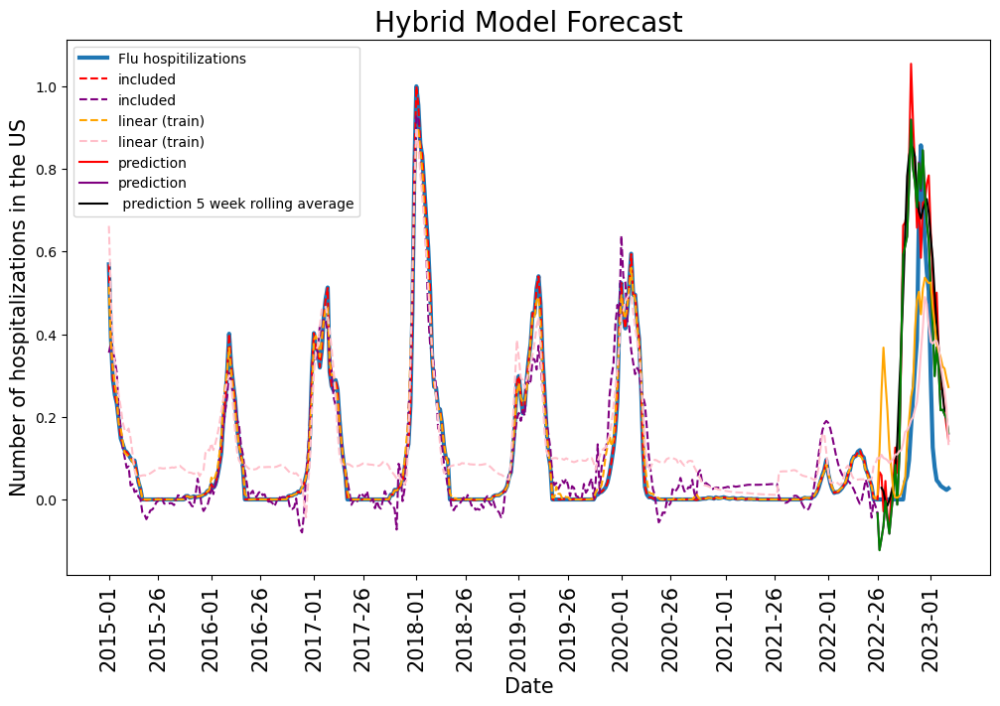

In [97]:
plt.rcParams['figure.figsize'] = (12, 7)
plt.plot(max_*df["INF_ALL"].loc['2015-01':date_pred],label="Flu hospitilizations",linewidth=3)
plt.plot(max_*bh_rf.predict(X_train,X_lags_train).loc['2015-01':date_end],label = "included",linestyle="dashed",color='red')
plt.plot(max_*bh_lin.predict(X_train,X_lags_train).loc['2015-01':date_end],label = "included",linestyle="dashed",color='purple')
#plt.plot(max_*lin_reg_fit_df['fit'].loc['2015-01':date_end],label = "linear (train)",linestyle="dashed",color='green')
plt.plot(max_*rf_fit_df['fit'].loc['2015-01':date_end],label = "linear (train)",linestyle="dashed",color='orange')
plt.plot(max_*svr_fit_df['fit'].loc['2015-01':date_end],label = "linear (train)",linestyle="dashed",color='pink')

plt.plot(max_*bh_rf.predict(X_test,X_lags_test),label="prediction",color='red')
plt.plot(max_*bh_lin.predict(X_test,X_lags_test),label="prediction",color='purple')

plt.plot(max_*bh_rf.predict(X_test,X_lags_test).rolling(5,center=True).mean(),color='black',label=" prediction 5 week rolling average")
plt.plot(max_*lin_reg_pred_df['fit'].loc[date_end:],color='green')
plt.plot(max_*rf_pred_df['fit'].loc[date_end:],color='orange')
plt.plot(max_*svr_pred_df['fit'].loc[date_end:],color='pink')


x_ticks=['2015-01','2015-26','2016-01','2016-26','2017-01','2017-26','2018-01','2018-26','2019-01','2019-26','2020-01','2020-26','2021-01','2021-26','2022-01','2022-26','2023-01']
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.legend(loc="upper left")
plt.title("Hybrid Model Forecast",size = 20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size = 15)
plt.show()

# Neural Net

In [18]:
##################### training executable ########################################
def train(dataloader, model,device, loss_fn, optimizer,noise):
    
    # train function gets called inside function train_model
    # set up to be general but loss_fn and optimizer are hardcoded in train_model

    model.train()
    cnt = 0
    total_loss = 0
    for batches in dataloader:
            x,y = batches
         
            x=x.to_dense().to(device)
            y= y.to(device).float()
            pred=  model(x.float())
            if noise == True:
               randos = []
               for i in range(y.shape[0]):
                   rando = np.random.normal(loc=0.0, scale=.2, size=None)
                   randos.append(rando)
               randos = torch.tensor(randos)
               y = (1+rando)*y
          
            loss = loss_fn(pred,y)
           
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            
            loss,current = loss.item(), cnt * len(x) # can't remember why I wanted "current"
          
            cnt+=1
            total_loss+= loss
    return float(total_loss)


############### test executable ##############################################
def test(dataloader, model, device,loss_fn):
    
    #same thing as train but doesn't run the optimizer or a backward

    num_batches = len(dataloader)
    
    model.eval()
    test_loss, correct = 0,0
    with torch.no_grad():
        for X, y in dataloader:
            X,y = X.to_dense().to(device), y.to(device)
            pred = model(X.float())
            
            test_loss+=loss_fn(pred,y.float()).item()
           
    return test_loss

################ this is the full training executable, uses "train" and "test" ##############################################
################ user be warned I change this almost daily trying to figure out better features ##########################################

def train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast):

# This is the function for minimizing a model for a dataset, saves best val and train model in PATH and outputs two tuples of losses for train/val


# PATH = destination for saving/loading the model
# model, device = model class instance , resources
# loss_fn = loss class instance
# batched_sequence = Dataset instance
# learn_rate = (float) learn_rate 
# num_epochs = (int) number of epochs
# kill = (int) if loss does not decrease for "kill" number of epochs end the routine
# batch_size_ = (int) batch size
# t_beg = (int) index in DATES to start fit
# t_end = (int) index in DATES to end fit
# noise = (bool) true or false to introduce noise in train
# forecast = (int) number of indices to include in validation beyond t_end

    #sparse_tensor = Dataset_(Y_df,dataframe_list) 
    #batched_sequence = SequenceDataset(sparse_tensor) # this is hard coded in but could get rid of this by just feeding batched_sequence as input
    time0 = time.perf_counter()
    
    with open(PATH[:-4]+".log","w") as f:
        f.write("starting log for model: "+PATH+"\n")
        loss_values = []
        pred = []
        train_ = Subset(batched_sequence,range(t_beg,t_end)) 
        train_dataloader = DataLoader(train_, batch_size=batch_size_, shuffle=False)

        test_ = Subset(batched_sequence,range(t_end,t_end+forecast))
        test_dataloader = DataLoader(test_, batch_size=1, shuffle=False)




        #loss_fn = nn.MSELoss()
        #loss_fn = nn.L1Loss()
        #loss_fn = elastic_net_loss()
        optimizer = torch.optim.Adam(model.parameters(), lr=learn_rate)
        losses, losses_test = [],[]
        c, epoch, loss_cut= 0,0, 1e99 # init
        d=c
        g = c
        loss_cut_t = loss_cut
        loss_cut_val = loss_cut

        while epoch < num_epochs:
        #for epoch in range(num_epochs):
            print("epoch",epoch,c,d)
            time1 = time.perf_counter()
            
            d+=1
            g+=1
            if d % 10 == 0 and d!=0:
                learn_rate*=0.1
                model.load_state_dict(torch.load(PATH[:-4]+"_train.pth"))
                optimizer = torch.optim.Adam(model.parameters(), lr=learn_rate)
                
                print("Shrinking learning rate to",str(learn_rate))
                f.write("Shrinking learning rate to "+str(learn_rate)+"\n")
                if learn_rate < 1e-6:
                    print("Learning rate getting small")
                    f.write("Learning rate getting small\n")
                    break
    #         optimizer = torch.optim.Adam(model.parameters(), lr=learn_rate)
            loss = train(train_dataloader,model,device,loss_fn,optimizer,noise)
            losses.append(loss)
        
            loss_test = test(test_dataloader,model,device,loss_fn)
            losses_test.append(loss_test)
            time2 = time.perf_counter()
        
            print("Train loss:",loss,"Val loss:",loss_test,"Time:",time2-time1)
            f.write("Train loss: "+str(loss)+" Val loss: "+str(loss_test)+" Time: "+str(time2-time1)+"\n")

            if epoch == 0:
                loss_cut = loss_test
            if epoch > 0:
                if loss_cut < loss_test:
                    c+=1
                else:
                    c = 0
                    torch.save(model.state_dict(), PATH)
                loss_cut = loss_test
            


            
            if loss < loss_cut_t:
                loss_cut_t = loss
                torch.save(model.state_dict(), PATH[:-4]+"_train.pth")
                d = 0
            if loss_test < loss_cut_val and epoch > 15:
                loss_cut_val = loss_test
                torch.save(model.state_dict(), PATH[:-4]+"_val.pth")
                g = 0
        # test(train_dataloader,model,loss_fn)
        
            if c == kill and epoch > 30:
                print("reached val limit, early stopping now")
                break
            epoch +=1
                
        
        print("Complete")
        print("Total time:",time2-time0)
        f.write("Complete\n Total time: "+str(time2-time0))
    return losses,losses_test 

In [19]:
def create_prediction(PATH,NN,device,batched_sequence,Y_mean,Y_std,norm_bool):
    
    # PATH = location of model
    # NN = model class instance
    # batched_sequence= data class instance
    # Y_mean = mean of target for undoing standard scalar transform
    # Y_std = standard deviation of target for undoing standard scalar transform
    # norm_bool = True/False if you want to return Normalized/Raw transformation
    
    NN.load_state_dict(torch.load(PATH))
    NN.eval()
    #sparse_tensor = Dataset_(Y_df,dataframe_list)
    #batched_sequence = SequenceDataset(sparse_tensor)
    #sub_ = Subset(batched_sequence,range(0,136))
    sub_ = batched_sequence
    datas = DataLoader(sub_, batch_size=1, shuffle=False)
    all_,ys = [],[]
    for x,y in datas:
        x=x.to_dense().to(device)
        pred= NN(x.float())
    
        all_.append(pred[0].cpu().detach().numpy())
        ys.append(y.to_dense().numpy())
    all_ =  np.array(all_)
    
    if norm_bool==False: # undo standard scalar
        tmp = np.ones(shape = all_[:,0].shape,dtype=float)*Y_mean[0]
    
        all_ = all_[:,0] * Y_std[0]+tmp

    return all_

In [20]:
class Dataset_(Dataset):
    
    def __init__(self,Y_df,df,seq,shift):
    
            
        df = df.to_numpy()
        y = Y_df.to_numpy()
        data_tmp = []
        for i in range(df.shape[0]):
            batch = []
            for j in range(seq):

                ind = i+j - shift

                if ind <0:
                    batch.append(np.zeros(shape=df[ind].shape))

                else:
                    batch.append(df[ind])
            data_tmp.append(batch)

        data_tmp = np.array(data_tmp)
        print(data_tmp.shape)

        data = []
        print(y.shape)
        for j in range(df.shape[0]):
            
            x = torch.from_numpy(np.asarray(data_tmp[j]))
            Y = torch.tensor(y[j])
            data.append((x,Y))
        
        self.data = data
        
    def __len__(self):

        return len(self.data)
    def __getitem__(self,i):
            
            #return item at i
            
        return self.data[i]

In [21]:
country_codes = list(flu_net["COUNTRY_CODE"].unique())
ind = country_codes.index("USA")
country_codes[ind] = country_codes[0]
country_codes[0] = "USA"

In [1063]:
flu_net[flu_net.COUNTRY_AREA_TERRITORY == "China"]

,WHOREGION,FLUSEASON,HEMISPHERE,ITZ,COUNTRY_CODE,COUNTRY_AREA_TERRITORY,ISO_WEEKSTARTDATE,ISO_YEAR,ISO_WEEK,MMWR_WEEKSTARTDATE,...,PARAINFLUENZA,RHINO,RSV,OTHERRESPVIRUS,OTHER_RESPVIRUS_DETAILS,LAB_RESULT_COMMENT,WCR_COMMENT,ISO2,ISOYW,MMWRYW
95,WPR,YR,NH,FLU_EST_ASIA,CHN,China,2018-11-12,2018,46,2018-11-11,...,NaN,NaN,NaN,NaN,NaN,NaN,ILI% in south of China in this week：2.75%；ILI%...,CN,201846,201846
99,WPR,YR,NH,FLU_EST_ASIA,CHN,China,2017-10-16,2017,42,2017-10-15,...,NaN,NaN,NaN,NaN,NaN,NaN,ILI% in south of China in this week：2.78%；ILI%...,CN,201742,201742
107,WPR,YR,NH,FLU_EST_ASIA,CHN,China,2012-08-20,2012,34,2012-08-19,...,NaN,NaN,NaN,NaN,NaN,NaN,ILI% in south of China in this week£º3.20% ...,CN,201234,201234
114,WPR,YR,NH,FLU_EST_ASIA,CHN,China,2015-11-23,2015,48,2015-11-22,...,NaN,NaN,NaN,NaN,NaN,NaN,ILI% in south of China in this week：2.56%；ILI%...,CN,201548,201547
119,WPR,YR,NH,FLU_EST_ASIA,CHN,China,2015-03-23,2015,13,2015-03-22,...,NaN,NaN,NaN,NaN,NaN,NaN,ILI% in south of China in this week£º2.80% ...,CN,201513,201512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139209,WPR,YR,NH,FLU_EST_ASIA,CHN,China,2009-08-24,2009,35,2009-08-23,...,NaN,NaN,NaN,NaN,NaN,NaN,ILI% in south of China in this week : 5.48% ...,CN,200935,200935
139442,WPR,YR,NH,FLU_EST_ASIA,CHN,China,2017-05-15,2017,20,2017-05-14,...,NaN,NaN,NaN,NaN,NaN,NaN,ILI% in south of China in this week：3.32%；ILI%...,CN,201720,201720
139462,WPR,YR,NH,FLU_EST_ASIA,CHN,China,2018-12-03,2018,49,2018-12-02,...,NaN,NaN,NaN,NaN,NaN,NaN,ILI% in south of China in this week：3.3%；ILI% ...,CN,201849,201849
139615,WPR,YR,NH,FLU_EST_ASIA,CHN,China,2013-03-04,2013,10,2013-03-03,...,NaN,NaN,NaN,NaN,NaN,NaN,ILI% in south of China in this week£º2.67% ...,CN,201310,201310


In [103]:
c = 0
country_codes = ["AUS","CHL","PRY","ARG","URY"]
for country in country_codes:
    tmp = flu_net[flu_net.COUNTRY_CODE == country][["MMWRYW","INF_ALL"]]
    tmp = tmp.groupby("MMWRYW").sum() #.set_index("MMWRYW")
    tmp = pd_to_weektime(tmp)
    tmp.columns = ["INF_ALL"+country]
    print(tmp)
    if c == 0:
        df = tmp
        c+=1
    else:
        df = df.join(tmp,on=df.index)

         INF_ALLAUS
1996-52         1.0
1997-01         0.0
1997-02         0.0
1997-03         0.0
1997-04         0.0
...             ...
2023-06        22.0
2023-07        28.0
2023-08        42.0
2023-09        49.0
2023-10        51.0

[1353 rows x 1 columns]
         INF_ALLCHL
1997-01         0.0
1997-02         0.0
1997-04         0.0
1997-05         0.0
1997-10         0.0
...             ...
2023-06        27.0
2023-07        27.0
2023-08        27.0
2023-09        29.0
2023-10        36.0

[1314 rows x 1 columns]
         INF_ALLPRY
1998-38         0.0
1998-39         0.0
1998-40         0.0
1998-41         0.0
1998-42         0.0
...             ...
2023-06         3.0
2023-07         4.0
2023-08         3.0
2023-09         1.0
2023-10         0.0

[1055 rows x 1 columns]
         INF_ALLARG
1997-17         0.0
1997-23         0.0
1997-24         0.0
1997-25         0.0
1997-26         0.0
...             ...
2023-06         5.0
2023-07         1.0
2023-08         5.0
2023-

In [301]:
for col in df.columns:
    if df[col].isnull().sum() > 200:
        df = df.drop([col],axis=1)

In [23]:
df_norm = df.copy()
#df_norm[df_norm.columns] = np.log(df_norm.replace(0,1))
df_norm[df_norm.columns] = MinMaxScaler().fit_transform(df_norm)
df_norm_deriv = df.copy()
df_norm_deriv[df_norm_deriv.columns] = MinMaxScaler().fit_transform(df - df.shift(1))
df_norm_exp = df_norm.ewm(alpha=0.1).mean()
df_norm_rolling = df_norm.rolling(4).mean()


In [24]:
df_norm = df_norm.fillna(0.0)
df_norm_exp = df_norm_exp.fillna(0.0)
df_norm_deriv = df_norm_deriv.fillna(0.0)

In [1703]:
np.exp(np.log(3))

3.0000000000000004

In [1470]:
df

,INF_ALLUSA,INF_ALLAUS
1997-01,831.0,0.0
1997-02,457.0,0.0
1997-03,328.0,0.0
1997-04,222.0,0.0
1997-05,218.0,0.0
...,...,...
2023-06,1603.0,22.0
2023-07,1169.0,28.0
2023-08,1009.0,42.0
2023-09,864.0,49.0


In [1988]:
df_log = df.copy()
df_log[df.columns] = np.log(MinMaxScaler().fit_transform(df ))

In [1989]:
log = df.copy()
log[log.columns] = np.log(df.replace(0,1)) 

In [304]:
#df_in = df_norm_deriv.join(df_norm_exp,on=df_norm.index,rsuffix='_exp')
#df_in = df_in.join(df_log,on=df_in.index,rsuffix ='_log')
#df_in = df_in.join(df_norm_rolling,on=df_in.index,rsuffix ='_rol')
#df_in = df_in.join(df_norm_deriv,on=df_in.index,rsuffix ='_deriv')

In [110]:
usa_infall_norm = pd.DataFrame(data=usa_infall_norm.to_numpy(),columns=['INF_ALL'],index=usa_infall_norm.index)

In [111]:
df_in = df_norm

tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index).join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(1353, 26, 6)
(1353,)


In [39]:


data_in = Dataset_(tmp["all"],tmp,26,26+20)

(612, 26, 6)
(612,)


## RNN

In [45]:
class rnn(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(rnn, self).__init__()
        
        
        self.rnn = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
            nn.Dropout(0.01),
            nn.Linear(seq_len*country_len,1)
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.rnn(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.rnn(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [319]:
df_in =

,INF_ALLECU,INF_ALLFJI,INF_ALLTZA,INF_ALLPRY,INF_ALLCHL,INF_ALLCOD,INF_ALLBOL,INF_ALLMDG,INF_ALLNCL,INF_ALLBRA,...,INF_ALLMDG_exp,INF_ALLNCL_exp,INF_ALLBRA_exp,INF_ALLURY_exp,INF_ALLARG_exp,INF_ALLAUS_exp,INF_ALLZMB_exp,INF_ALLIDN_exp,INF_ALLPER_exp,INF_ALLZAF_exp
2007-19,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.003228,0.026316,0.008726,0.000000,0.000000,0.000000,0.005917,0.008850
2007-36,0.316981,0.0,0.000000,0.000000,0.338053,0.000000,0.000000,0.472727,0.557143,0.300426,...,0.000000,0.000000,0.001529,0.012465,0.004133,0.019827,0.000000,0.000000,0.002803,0.078714
2009-02,0.252830,0.0,0.000000,0.000000,0.392920,0.000000,0.000000,0.472727,0.557143,0.303977,...,0.000000,0.000000,0.001263,0.012465,0.002608,0.012763,0.000000,0.000000,0.002860,0.049669
2009-03,0.328302,0.0,0.000000,0.453039,0.403540,0.000000,0.000000,0.472727,0.000000,0.303267,...,0.000000,0.000000,0.001130,0.012465,0.001850,0.009251,0.000000,0.000000,0.007190,0.035226
2009-04,0.301887,0.0,0.000000,0.453039,0.392920,0.000000,0.000000,0.472727,0.000000,0.302557,...,0.000000,0.000000,0.000854,0.012465,0.001398,0.007494,0.000000,0.000000,0.012659,0.026624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06,0.335849,0.0,0.681818,0.436464,0.410619,0.486486,0.544743,0.545455,0.000000,0.298295,...,0.191235,0.000247,0.028249,0.024108,0.084727,0.045290,0.235645,0.023872,0.050205,0.040712
2023-07,0.324528,0.0,0.818182,0.458564,0.398230,0.513514,0.513423,0.354545,0.000000,0.289062,...,0.174072,0.000247,0.028411,0.021697,0.076284,0.042679,0.244081,0.021485,0.051101,0.037083
2023-08,0.298113,0.0,0.068182,0.447514,0.398230,0.459459,0.427293,0.500000,0.000000,0.304688,...,0.161567,0.000247,0.028717,0.019527,0.068801,0.041288,0.235673,0.019336,0.050725,0.035145
2023-09,0.249057,0.0,0.000000,0.441989,0.401770,0.486486,0.489933,0.445455,0.000000,0.321023,...,0.147371,0.000247,0.031011,0.017575,0.062124,0.040515,0.224105,0.019336,0.053641,0.032958


In [742]:
index = list(tmp.index)

In [1584]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn.pth
epoch 0 0 0
Train loss: 11.088683674357576 Val loss: 1.3307229657366406 Time: 0.6309861000627279
epoch 1 0 0
Train loss: 5.844689567982597 Val loss: 0.7356679215445183 Time: 0.5466235999483615
epoch 2 0 0
Train loss: 7.452758515610739 Val loss: 0.6024607145227492 Time: 0.4910164000466466
epoch 3 0 1
Train loss: 7.771874360216771 Val loss: 0.7972507723688977 Time: 0.5239942998159677
epoch 4 1 2
Train loss: 5.847506713809929 Val loss: 0.3677220300305635 Time: 0.519903999986127
epoch 5 0 3
Train loss: 5.932032563954877 Val loss: 0.6707844342217868 Time: 0.506370099959895
epoch 6 1 4
Train loss: 5.229626294733431 Val loss: 0.32988973168176017 Time: 0.5211795000359416
epoch 7 0 0
Train loss: 4.667452624398113 Val loss: 0.4965606031164498 Time: 0.6542903000954539
epoch 8 1 0
Train loss: 3.8376914561698108 Val loss: 0.7102345552448242 Time: 0.5620238000992686
epoch 9 2 0
Train loss: 3.9963915087252904 Val loss: 0.7838882587966509 Time:

Text(0.5, 0, 'epochs')

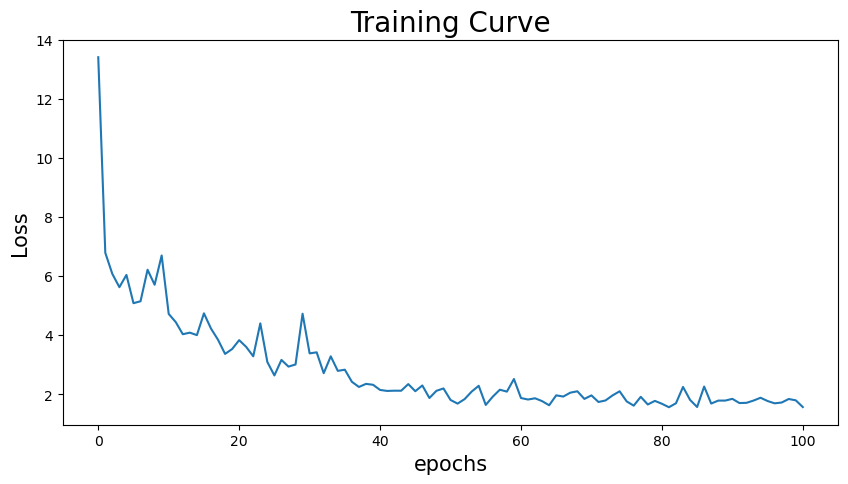

In [1415]:
plt.rcParams['figure.figsize'] = (10, 5)
plt.plot(loss_t)
plt.title("Training Curve",size=20)
plt.ylabel('Loss',size=15)
plt.xlabel('epochs',size=15)


In [1585]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

Text(0.5, 0, 'Date')

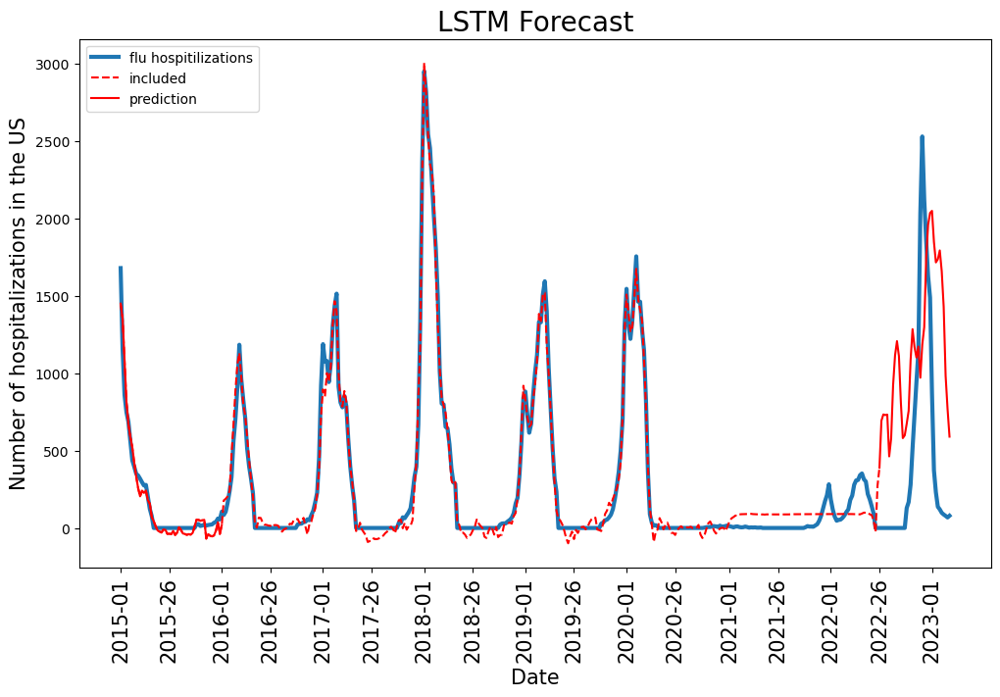

In [1586]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred
plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2015-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2015-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.plot(max_*plot_df["pred"].loc['2015-01':'2016-01'],color='red')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)



### 2019

In [1546]:
df_in = df_norm
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index).join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(1227, 26, 6)
(1227,)


In [1471]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn_2019.pth
epoch 0 0 0
Train loss: 10.179389757111473 Val loss: 2.9074322013475467 Time: 0.3873252000194043
epoch 1 0 0
Train loss: 6.150211856634375 Val loss: 1.2281328393146396 Time: 0.4456062999088317
epoch 2 0 0
Train loss: 5.497641758380901 Val loss: 0.3485698059666902 Time: 0.43454059993382543
epoch 3 0 0
Train loss: 4.677090821261681 Val loss: 0.10273851076362917 Time: 0.4236674999119714
epoch 4 0 0
Train loss: 5.914017237271636 Val loss: 0.5838807587892916 Time: 0.37955369998235255
epoch 5 1 1
Train loss: 4.660824184850737 Val loss: 0.41065539406736207 Time: 0.38386130006983876
epoch 6 0 0
Train loss: 3.973431112191747 Val loss: 1.3296519575796992 Time: 0.4027506000129506
epoch 7 1 0
Train loss: 3.281646778632748 Val loss: 1.2497668640571646 Time: 0.3742296000709757
epoch 8 0 0
Train loss: 2.6748576702022113 Val loss: 1.4662814514510103 Time: 0.36439800006337464
epoch 9 1 0
Train loss: 2.549630333909562 Val loss: 1.98925374071

Text(0.5, 0, 'Date')

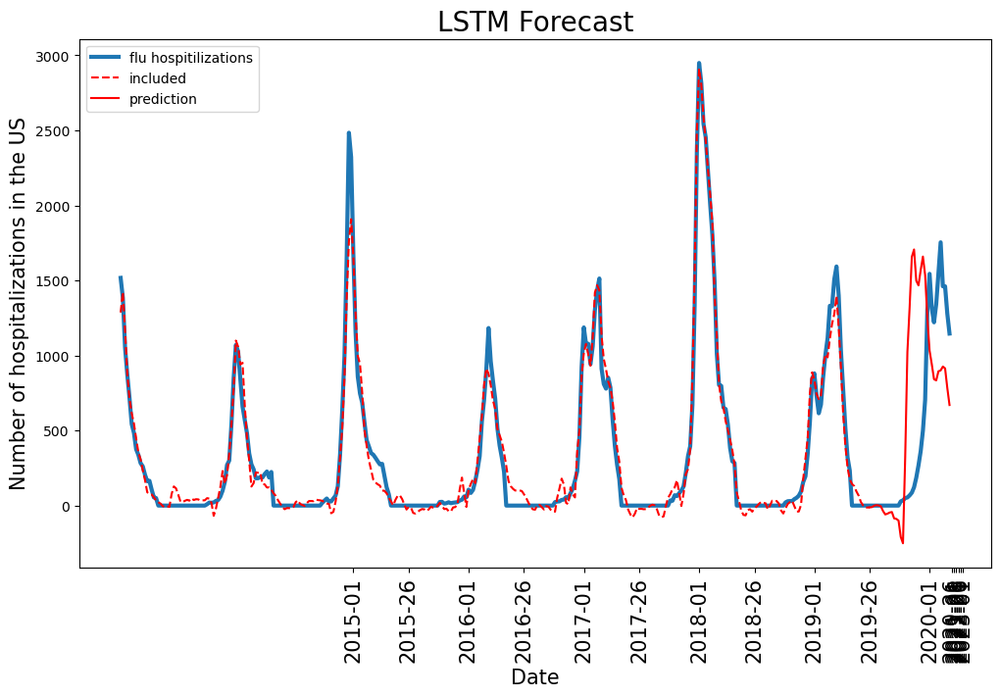

In [1472]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019 w usa

In [1609]:
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index)
tmp['1_year'] = tmp['all'].shift(52-20)
tmp['2_year'] = tmp['all'].shift(2*52-20)
tmp['3_year'] = tmp['all'].shift(3*52-20)
tmp = tmp.join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(1227, 26, 9)
(1227,)


In [1611]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn(26,9).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn_2019_usa.pth
epoch 0 0 0
Train loss: 10.206427809902664 Val loss: 2.430030609772075 Time: 0.4706016001291573
epoch 1 0 0
Train loss: 6.264224710601557 Val loss: 1.7185234925782424 Time: 0.3800526999402791
epoch 2 0 0
Train loss: 5.876919771066661 Val loss: 1.2233470581195434 Time: 0.4193425001576543
epoch 3 0 0
Train loss: 4.856068214910692 Val loss: 1.4859141588294733 Time: 0.40240389993414283
epoch 4 1 0
Train loss: 4.146002263403063 Val loss: 1.7182075723449088 Time: 0.36333129997365177
epoch 5 2 0
Train loss: 3.556877113340681 Val loss: 2.4063062349814572 Time: 0.3636747000273317
epoch 6 3 0
Train loss: 4.106475775007254 Val loss: 1.7101589115172828 Time: 0.3680853000842035
epoch 7 0 1
Train loss: 2.9202325214482983 Val loss: 2.039494428467833 Time: 0.4015975999645889
epoch 8 1 0
Train loss: 2.8112269365792724 Val loss: 1.5615957604009054 Time: 0.3625205000862479
epoch 9 0 0
Train loss: 3.326490034694339 Val loss: 0.443256356769

Text(0.5, 0, 'Date')

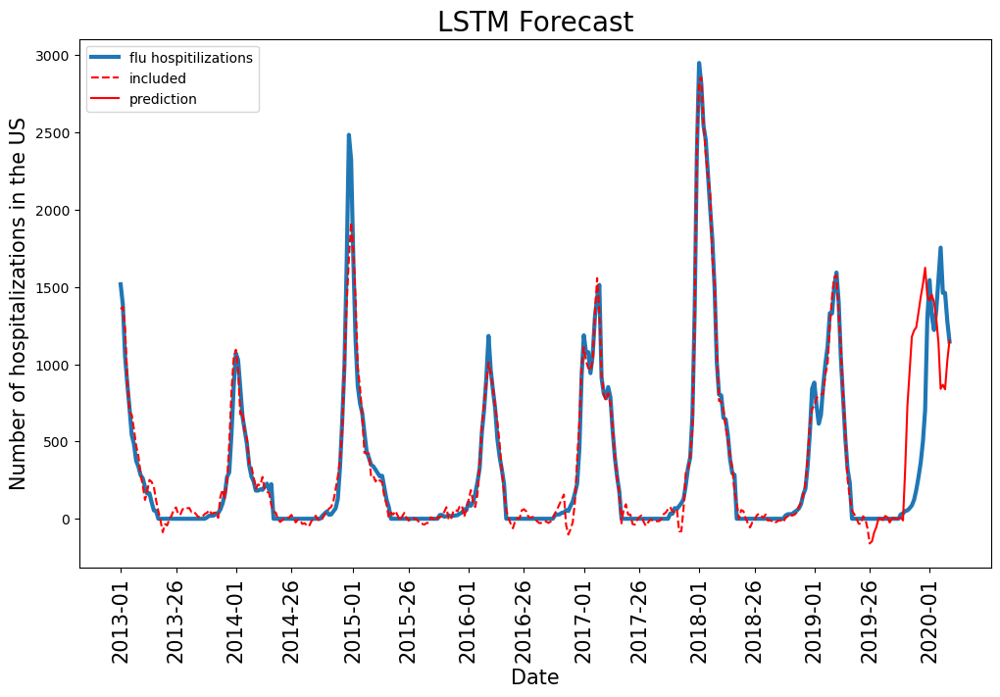

In [1612]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### Standard Scaler

In [43]:
df_norm_ss = df.copy()
#df_norm[df_norm.columns] = np.log(df_norm.replace(0,1))
df_norm_ss[df_norm_ss.columns] = StandardScaler().fit_transform(df_norm_ss)
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index)
tmp = tmp.join(df_norm_ss,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(612, 26, 6)
(612,)


In [1531]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_ss.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn_ss.pth
epoch 0 0 0
Train loss: 8.643676824949054 Val loss: 0.5690431931288913 Time: 0.5857224999926984
epoch 1 0 0
Train loss: 5.727590646081427 Val loss: 0.5953993097958801 Time: 0.5900616999715567
epoch 2 1 0
Train loss: 5.605766853252323 Val loss: 0.7675077169296856 Time: 0.5439235998783261
epoch 3 2 0
Train loss: 4.067990472354294 Val loss: 1.0301560448842793 Time: 0.5613987999968231
epoch 4 3 0
Train loss: 4.09323771756713 Val loss: 0.8054240366618615 Time: 0.515164399985224
epoch 5 0 1
Train loss: 3.835954754610838 Val loss: 1.0804642936054734 Time: 0.5233885999768972
epoch 6 1 0
Train loss: 3.9316989493187746 Val loss: 1.7425858235073974 Time: 0.535037900088355
epoch 7 2 1
Train loss: 3.924410840748856 Val loss: 2.1869009930524044 Time: 0.5172218000516295
epoch 8 3 2
Train loss: 3.6351368303662 Val loss: 1.526570124498221 Time: 0.5175385000184178
epoch 9 0 0
Train loss: 2.5083254907991845 Val loss: 1.8721301888581365 Time: 0.

Text(0.5, 0, 'Date')

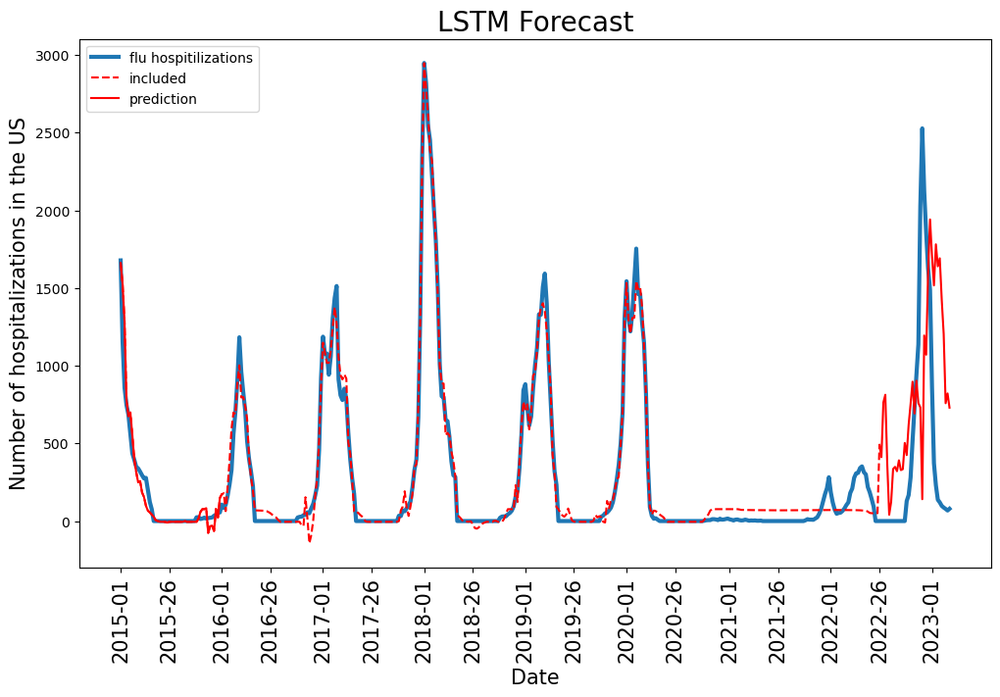

In [1532]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred
plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2015-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2015-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.plot(max_*plot_df["pred"].loc['2015-01':'2016-01'],color='red')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### Different dataset

In [1097]:
df_norm_exp = df_norm.ewm(alpha=0.05).mean()


#df_in = df_norm.join(df_norm_exp,on=df_norm.index,rsuffix='_exp')
#df_in = df_in.join(df_log,on=df_in.index,rsuffix ='_log')
#df_in = df_in.join(df_norm_rolling,on=df_in.index,rsuffix ='_rol')
df_in = df_norm.join(df_norm_deriv,on=df_in.index,rsuffix ='_deriv')

tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index).join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(1227, 26, 11)
(1227,)


In [1100]:
class lstm_diffdata(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(lstm_diffdata, self).__init__()
        
       
        self.lstm = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(286,1)
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1101]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_diffdata(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2016-01')
t_end = index.index('2022-26')
noise = False
forecast = 26
torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_diffdata.pth
epoch 0 0 0
Train loss: 10.459894616000062 Val loss: 1.5704651129199192 Time: 0.4096063000615686
epoch 1 0 0
Train loss: 4.689259952635581 Val loss: 1.586546714126598 Time: 0.41026599996257573
epoch 2 1 0
Train loss: 3.281092675110328 Val loss: 1.6774158605840057 Time: 0.4019592000404373
epoch 3 2 0
Train loss: 2.8606763411128284 Val loss: 1.451349533861503 Time: 0.33534240000881255
epoch 4 0 0
Train loss: 2.807093532108527 Val loss: 1.4914865562459454 Time: 0.319167000008747
epoch 5 1 0
Train loss: 2.196735846890432 Val loss: 1.1297143481497187 Time: 0.32080819993279874
epoch 6 0 0
Train loss: 2.277920018772624 Val loss: 1.2606821915251203 Time: 0.3254889000672847
epoch 7 1 1
Train loss: 3.758332422332192 Val loss: 1.590938626197385 Time: 0.32571320002898574
epoch 8 2 2
Train loss: 3.793356966852812 Val loss: 1.4679485075175762 Time: 0.32060860004276037
epoch 9 0 3
Train loss: 2.9865619730620505 Val loss: 1.2376136115

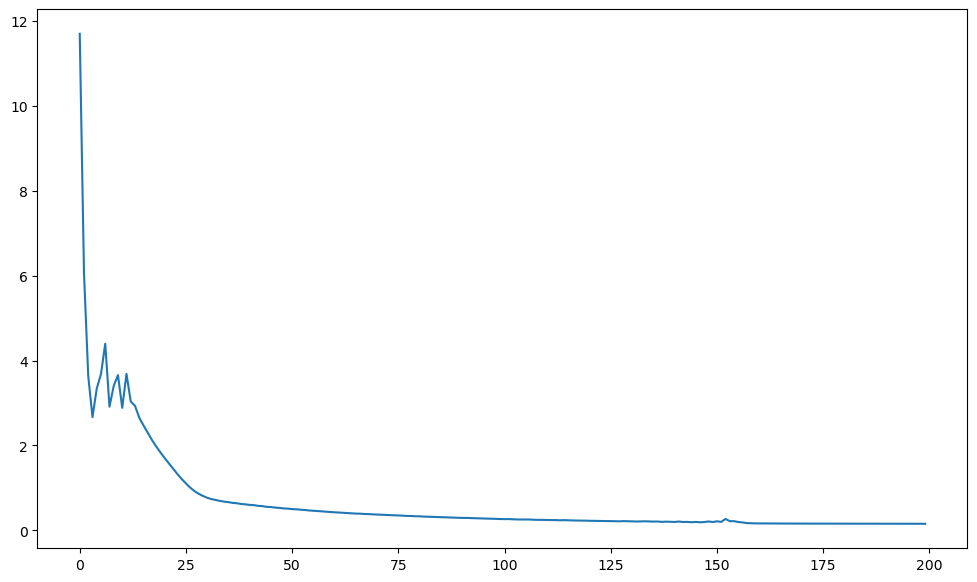

In [1077]:
plt.plot(loss_t)

In [1102]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

Text(0.5, 0, 'Date')

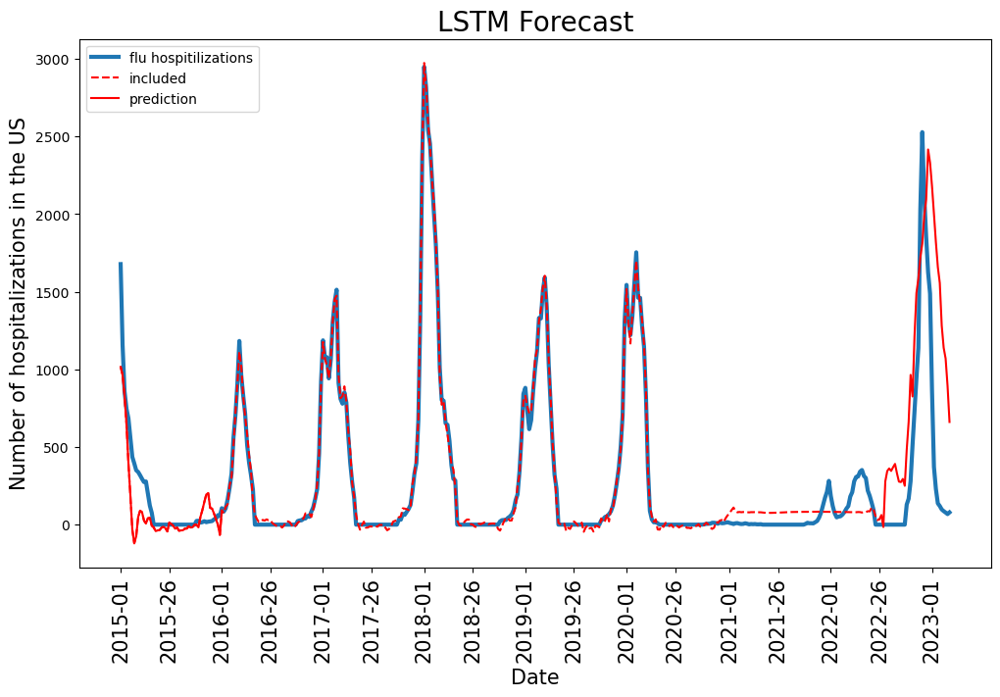

In [1103]:
plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2015-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2015-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.plot(max_*plot_df["pred"].loc['2015-01':'2016-01'],color='red')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)


### More diff data

In [ ]:
class lstm_diffdata1(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(lstm_diffdata1, self).__init__()
        
       
        self.lstm = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(546,1)
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [ ]:
df_norm_log = df_norm.ewm(alpha=0.05).mean()


#df_in = df_norm.join(df_norm_exp,on=df_norm.index,rsuffix='_exp')
#df_in = df_in.join(df_log,on=df_in.index,rsuffix ='_log')
#df_in = df_in.join(df_norm_rolling,on=df_in.index,rsuffix ='_rol')
df_in = df_norm.join(df_norm_deriv,on=df_in.index,rsuffix ='_deriv')

tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index).join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

### Longer range

In [1137]:
df_in = df_norm
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index).join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26*6,26*6+20)

(1227, 156, 6)
(1227,)


In [1140]:
class lstm_long(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(lstm_long, self).__init__()
        
       
        self.lstm = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(936,1)
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1141]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_long(26*6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 100
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2016-01')
t_end = index.index('2022-26')
noise = False
forecast = 26
torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_long.pth
epoch 0 0 0
Train loss: 24.053428799114553 Val loss: 396.4474548017606 Time: 1.036988400039263
epoch 1 0 0
Train loss: 296.9710972415205 Val loss: 883.0752758661401 Time: 1.0569649999961257
epoch 2 1 1
Train loss: 3271.0107182558922 Val loss: 2378.3233562111855 Time: 0.8814658999908715
epoch 3 2 2
Train loss: 9895.440557614202 Val loss: 232.7214979203418 Time: 0.8906132000265643
epoch 4 0 3
Train loss: 397.75937117878163 Val loss: 144.6533232172951 Time: 0.9101354000158608
epoch 5 0 4
Train loss: 648.768445981917 Val loss: 92.87329439073801 Time: 1.021581600070931
epoch 6 0 5
Train loss: 571.3769725205493 Val loss: 96.11966763564851 Time: 2.125620699953288
epoch 7 1 6
Train loss: 349.9778376865561 Val loss: 35.5275376457721 Time: 0.9225623001111671
epoch 8 0 7
Train loss: 216.2542018746194 Val loss: 8.228803238715045 Time: 0.9279139999998733
epoch 9 0 8
Train loss: 410.1358587731884 Val loss: 121.44504755735397 Time: 0.886

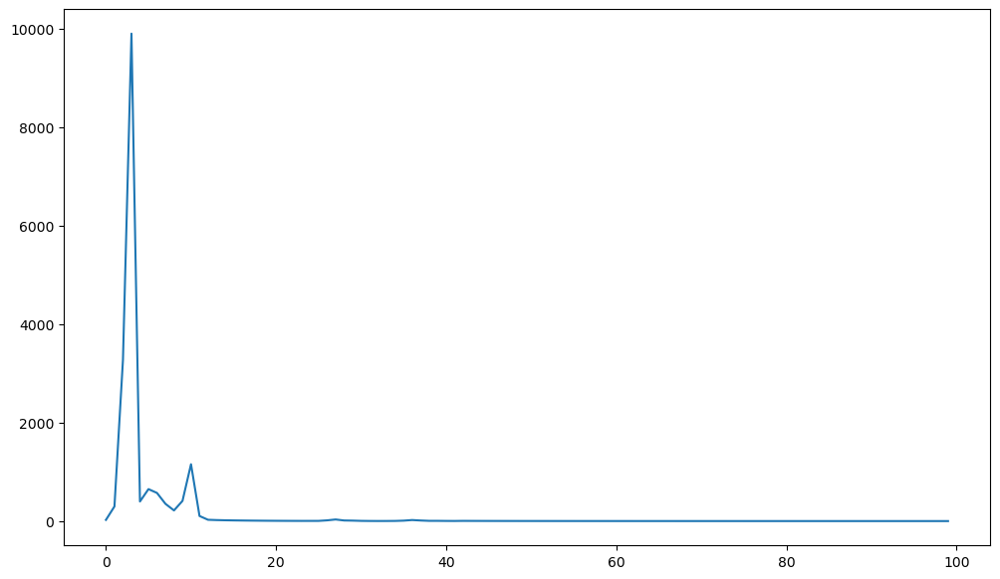

In [1142]:
plt.plot(loss_t)

Text(0.5, 0, 'Date')

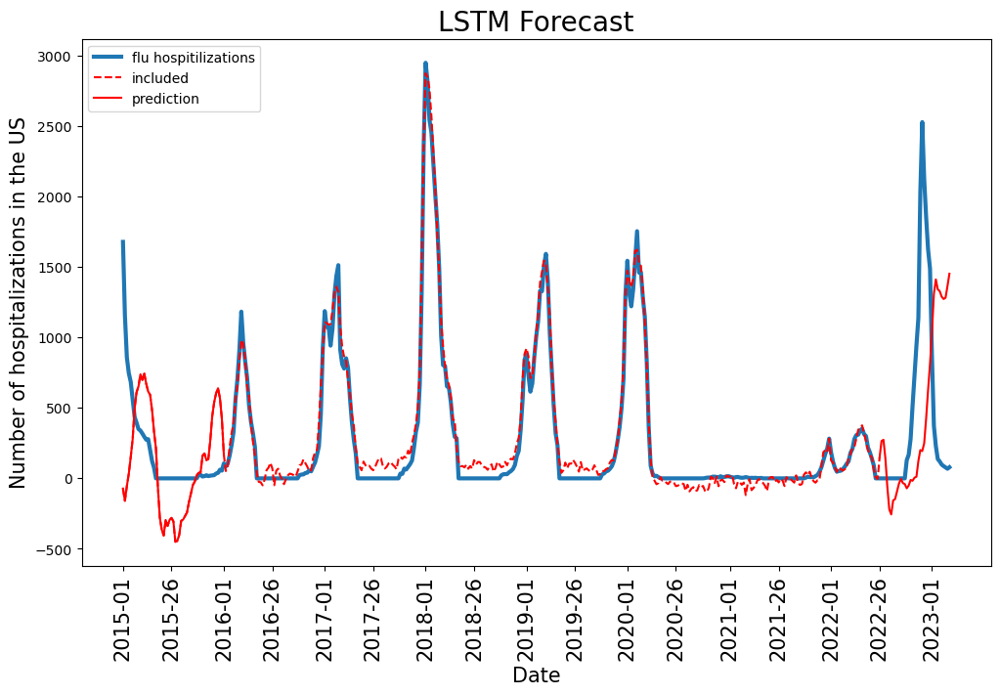

In [1143]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2015-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2015-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.plot(max_*plot_df["pred"].loc['2015-01':'2016-01'],color='red')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)


### Include US previous years

In [1149]:
class lstm_diff(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(lstm_diff, self).__init__()
        
        
        self.convo = nn.Sequential(
           # nn.Flatten(start_dim =2, end_dim = -1),
            nn.ConstantPad1d(1,0),
            nn.Conv1d(seq_len,seq_len,kernel_size=5),
            nn.ReLU()
        )
        self.lstm = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(234,1)
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1144]:
df_in = df_norm #.join(df_norm_deriv,on=df_in.index,rsuffix ='_deriv')

tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index).join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

,INF_ALLAUS,INF_ALLCHL,INF_ALLPRY,INF_ALLARG,INF_ALLURY
1996-52,0.000685,0.000000,0.000,0.000000,0.0
1997-01,0.000000,0.000000,0.000,0.000000,0.0
1997-02,0.000000,0.000000,0.000,0.000000,0.0
1997-03,0.000000,0.000000,0.000,0.000000,0.0
1997-04,0.000000,0.000000,0.000,0.000000,0.0
...,...,...,...,...,...
2023-06,0.015068,0.026601,0.015,0.001454,0.0
2023-07,0.019178,0.026601,0.020,0.000291,0.0
2023-08,0.028767,0.026601,0.015,0.001454,0.0
2023-09,0.033562,0.028571,0.005,0.002036,0.0


In [1146]:
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index)
tmp['1_year'] = tmp['all'].shift(52-20)
tmp['2_year'] = tmp['all'].shift(2*52-20)
tmp['3_year'] = tmp['all'].shift(3*52-20)
tmp = tmp.join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(1227, 26, 9)
(1227,)


In [1498]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn(26,9).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn_usa.pth
epoch 0 0 0
Train loss: 12.447900067253556 Val loss: 1.8822484578291778 Time: 0.535361299989745
epoch 1 0 0
Train loss: 8.022528904293747 Val loss: 2.3763154407206457 Time: 0.5103935999795794
epoch 2 1 0
Train loss: 6.368953658806998 Val loss: 0.9468350452516461 Time: 0.5345402000239119
epoch 3 0 0
Train loss: 5.23946884071664 Val loss: 0.9335815418162383 Time: 0.47627310000825673
epoch 4 0 0
Train loss: 5.235113123436605 Val loss: 0.5042459042175693 Time: 0.47617799998261034
epoch 5 0 0
Train loss: 5.755302455084559 Val loss: 0.8340946737551693 Time: 0.4779309000587091
epoch 6 1 1
Train loss: 5.349115666538935 Val loss: 1.0225083365439787 Time: 0.46751340001355857
epoch 7 2 2
Train loss: 4.810072568526841 Val loss: 0.5254283985705115 Time: 0.4791638000169769
epoch 8 0 0
Train loss: 3.7581805907893973 Val loss: 0.5689583090133965 Time: 0.48322550009470433
epoch 9 1 0
Train loss: 3.9086948562155666 Val loss: 0.802839509444311

In [1154]:
np.sqrt(0.136/(52*8))

0.018081014266989475

Text(0.5, 0, 'Date')

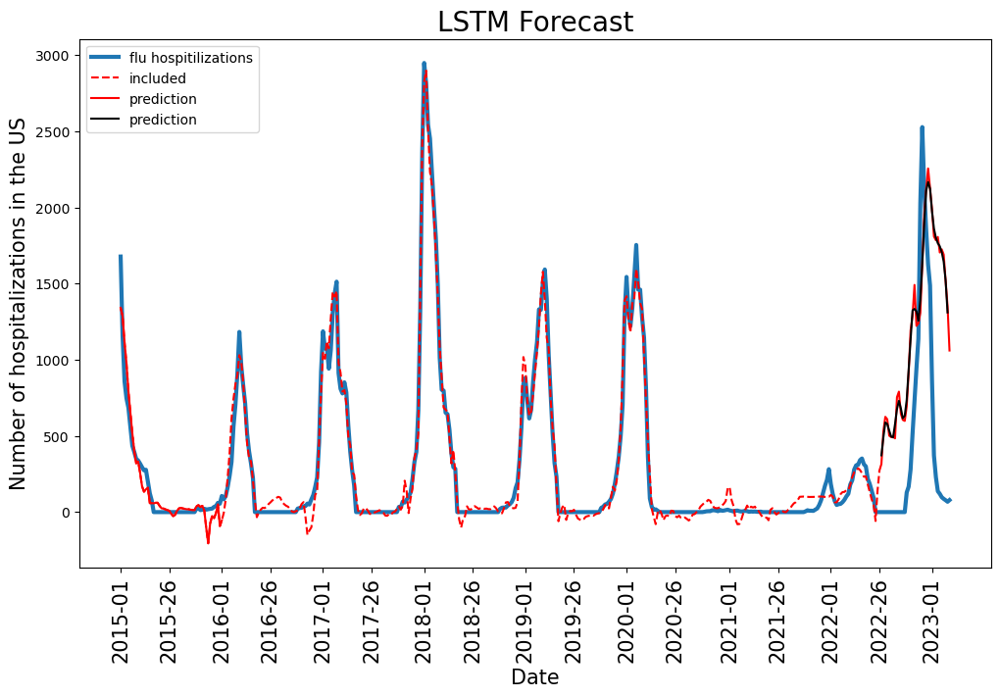

In [1499]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2015-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2015-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'].rolling(3,center=True).mean(),color='black',label='prediction')
plt.plot(max_*plot_df["pred"].loc['2015-01':'2016-01'],color='red')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### Different shift

In [1213]:
c = 0
country_codes = ["AUS","CHL","PRY","ARG","URY"] #+ ["NPL","CYP","BTN"]
for country in country_codes:
    tmp = flu_net[flu_net.COUNTRY_CODE == country][["MMWRYW","INF_ALL"]]
    tmp = tmp.groupby("MMWRYW").sum() #.set_index("MMWRYW")
    tmp = pd_to_weektime(tmp)
    tmp.columns = ["INF_ALL"+country]
    print(tmp)
    if c == 0:
        df = tmp
        c+=1
    else:
        df = df.join(tmp,on=df.index)

df_norm = df.copy()
df_norm[df_norm.columns] = MinMaxScaler().fit_transform(df_norm)
df_norm = df_norm.fillna(0)

         INF_ALLAUS
1996-52         1.0
1997-01         0.0
1997-02         0.0
1997-03         0.0
1997-04         0.0
...             ...
2023-06        22.0
2023-07        28.0
2023-08        42.0
2023-09        49.0
2023-10        51.0

[1353 rows x 1 columns]
         INF_ALLCHL
1997-01         0.0
1997-02         0.0
1997-04         0.0
1997-05         0.0
1997-10         0.0
...             ...
2023-06        27.0
2023-07        27.0
2023-08        27.0
2023-09        29.0
2023-10        36.0

[1314 rows x 1 columns]
         INF_ALLPRY
1998-38         0.0
1998-39         0.0
1998-40         0.0
1998-41         0.0
1998-42         0.0
...             ...
2023-06         3.0
2023-07         4.0
2023-08         3.0
2023-09         1.0
2023-10         0.0

[1055 rows x 1 columns]
         INF_ALLARG
1997-17         0.0
1997-23         0.0
1997-24         0.0
1997-25         0.0
1997-26         0.0
...             ...
2023-06         5.0
2023-07         1.0
2023-08         5.0
2023-

In [1216]:
df_in = df_norm

In [1220]:
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index)
#tmp['1_year'] = tmp['all'].shift(52-20)
#tmp['2_year'] = tmp['all'].shift(2*52-20)
#tmp['3_year'] = tmp['all'].shift(3*52-20)
tmp = tmp.join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+23)

(1227, 26, 6)
(1227,)


In [1221]:
class lstm_new(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(lstm_new, self).__init__()
        
        
        self.convo = nn.Sequential(
           # nn.Flatten(start_dim =2, end_dim = -1),
            nn.ConstantPad1d(1,0),
            nn.Conv1d(seq_len,seq_len,kernel_size=5),
            nn.ReLU()
        )
        self.lstm = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(seq_len*country_len,1)
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1222]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_new(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2015-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_new.pth
epoch 0 0 0
Train loss: 10.70702238237893 Val loss: 1.8224024650990032 Time: 0.4161643000552431
epoch 1 0 0
Train loss: 5.199743247781337 Val loss: 1.4931371541460976 Time: 0.4754079000558704
epoch 2 0 0
Train loss: 4.265284754901861 Val loss: 1.0485253901897522 Time: 0.6483814000384882
epoch 3 0 0
Train loss: 4.683994347825177 Val loss: 1.0204929012106732 Time: 0.3998654999304563
epoch 4 0 1
Train loss: 5.971820695598595 Val loss: 0.9380837645148858 Time: 0.4082910999422893
epoch 5 0 2
Train loss: 4.904368864282403 Val loss: 0.8285149381845258 Time: 0.41903170000296086
epoch 6 0 3
Train loss: 3.7229454899839167 Val loss: 0.9932611176773207 Time: 0.41301210003439337
epoch 7 1 0
Train loss: 3.879286985096762 Val loss: 0.6319817407884329 Time: 0.408734800061211
epoch 8 0 1
Train loss: 4.4802089178027185 Val loss: 0.5829566462990101 Time: 0.39286110003013164
epoch 9 0 2
Train loss: 3.6817056230690013 Val loss: 0.57083309540757

Text(0.5, 0, 'Date')

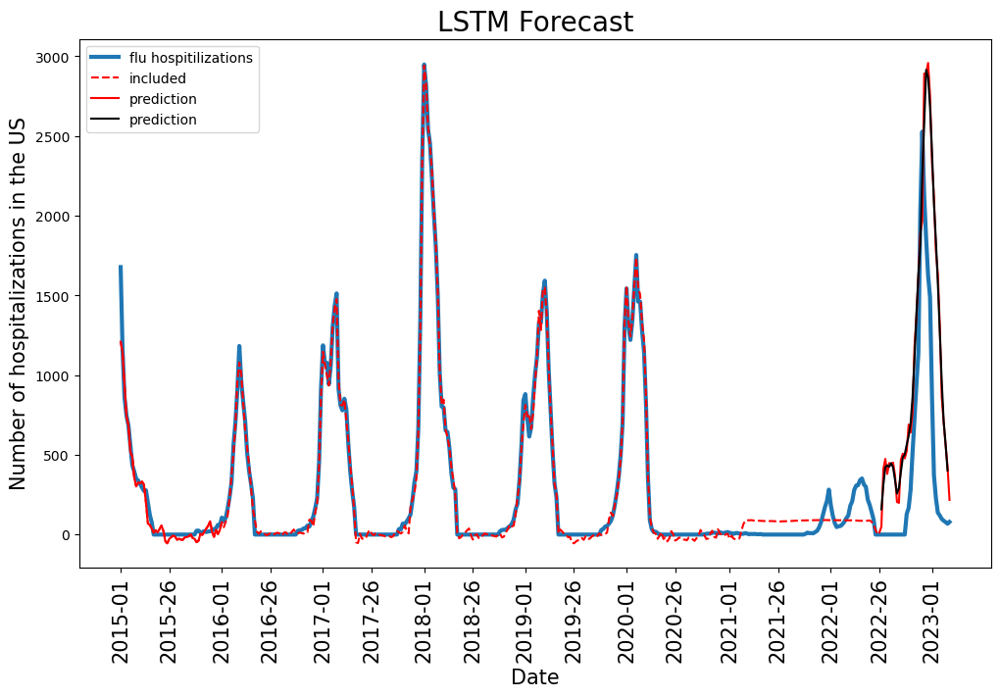

In [1223]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2015-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2015-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'].rolling(3,center=True).mean(),color='black',label='prediction')
plt.plot(max_*plot_df["pred"].loc['2015-01':'2016-01'],color='red')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## rnn single

In [46]:
class rnn_single(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(lstm_single, self).__init__()
        
        
        
        self.rnn = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(156,1)
        )        
        
    def forward(self, x):

        logits, _ = self.rnn(x.permute(0,2,1))
        
        logits = self.seq(logits)
        
        
        return logits

In [1323]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_single(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_single.pth
epoch 0 0 0
Train loss: 8.912091270849007 Val loss: 0.8010991646442562 Time: 0.46626300003845245
epoch 1 0 0
Train loss: 5.574912117819238 Val loss: 0.6256494765548268 Time: 0.598731099977158
epoch 2 0 0
Train loss: 4.517627659034854 Val loss: 0.7970846819225699 Time: 0.5892789999488741
epoch 3 1 0
Train loss: 4.452893751872912 Val loss: 0.5245631978576881 Time: 0.45335990004241467
epoch 4 0 0
Train loss: 4.2148606545738065 Val loss: 0.43082819385745097 Time: 0.5347970000002533
epoch 5 0 0
Train loss: 3.877231310207515 Val loss: 0.5849028288944282 Time: 0.45346699992660433
epoch 6 1 0
Train loss: 3.50413041814088 Val loss: 0.7375668486442919 Time: 0.4781413999153301
epoch 7 2 0
Train loss: 3.086472205734726 Val loss: 1.0488827341544038 Time: 0.38941970001906157
epoch 8 3 0
Train loss: 2.916262322996907 Val loss: 1.474998273930396 Time: 0.5354821999790147
epoch 9 4 0
Train loss: 2.949768612301952 Val loss: 1.7290933747572

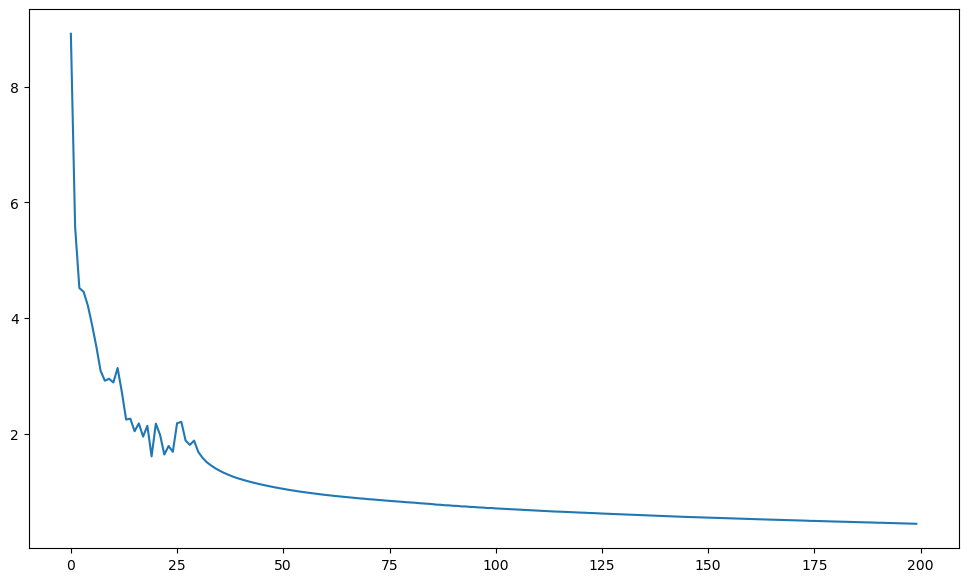

In [1324]:
plt.plot(loss_t)

In [1325]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

Text(0.5, 0, 'Date')

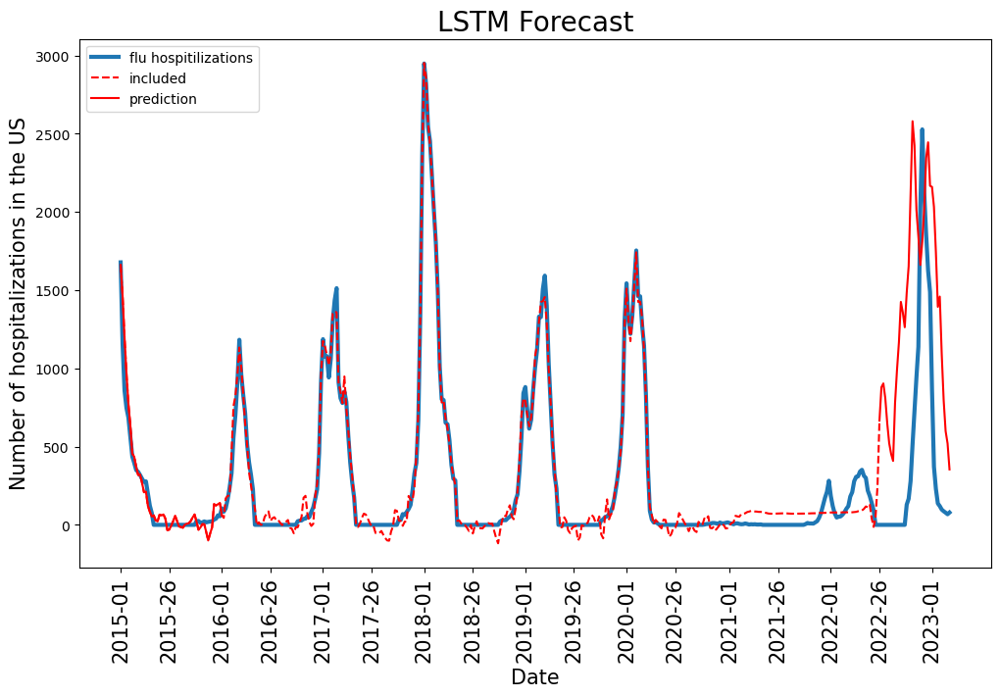

In [1326]:
plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2015-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2015-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.plot(max_*plot_df["pred"].loc['2015-01':'2016-01'],color='red')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### Different dataset

In [1106]:
class lstm_single_diffdata(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(lstm_single_diffdata, self).__init__()
        
        
        
        self.lstm = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(286,1)
        )        
        
    def forward(self, x):

        logits, _ = self.lstm(x.permute(0,2,1))
        
        logits = self.seq(logits)
        
        
        return logits

In [1107]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_single_diffdata(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2016-01')
t_end = index.index('2022-26')
noise = False
forecast = 26
torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_single_diffdata.pth
epoch 0 0 0
Train loss: 10.810290663999073 Val loss: 1.453286367264809 Time: 0.2778579000150785
epoch 1 0 0
Train loss: 4.569879931025423 Val loss: 1.568616192380432 Time: 0.2391206999309361
epoch 2 1 0
Train loss: 3.3869919016497647 Val loss: 1.4394129706188323 Time: 0.2660066999960691
epoch 3 0 0
Train loss: 3.090801888018234 Val loss: 1.5295920959906653 Time: 0.25036110007204115
epoch 4 1 0
Train loss: 3.011442488391282 Val loss: 1.6047608359949663 Time: 0.2829900999786332
epoch 5 2 0
Train loss: 2.115330809769354 Val loss: 1.9331714232685044 Time: 0.22119260008912534
epoch 6 3 0
Train loss: 1.874630219902695 Val loss: 1.932849700562656 Time: 0.2242193000856787
epoch 7 0 0
Train loss: 2.174365423576603 Val loss: 1.7095966858323663 Time: 0.22435409994795918
epoch 8 0 1
Train loss: 2.2822630518864404 Val loss: 1.9920583633938804 Time: 0.22769670002162457
epoch 9 1 2
Train loss: 2.601516095972822 Val loss: 1.453

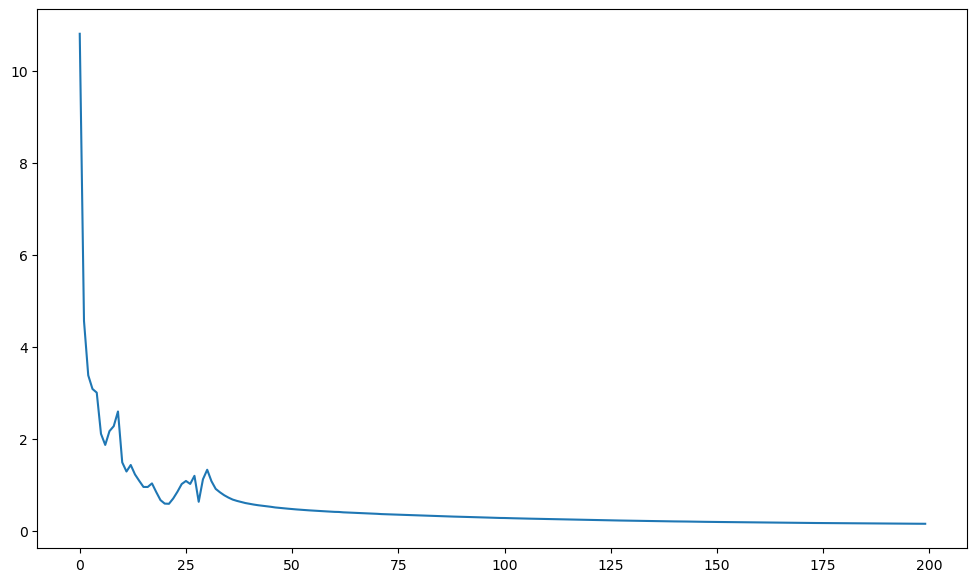

In [1108]:
plt.plot(loss_t)

In [1109]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

Text(0.5, 0, 'Date')

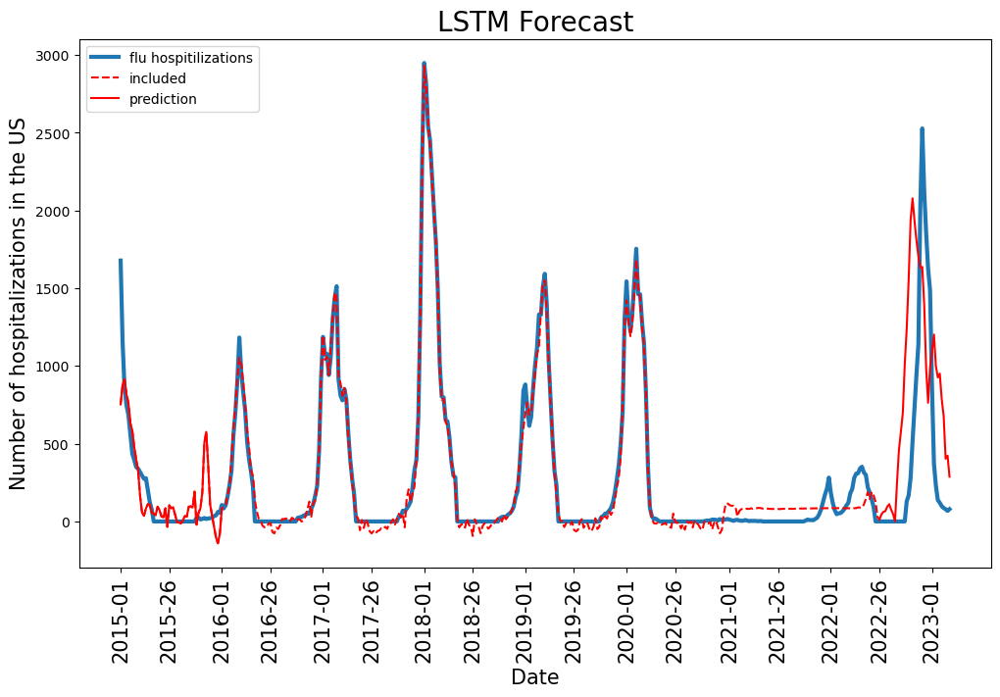

In [1111]:
plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2015-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2015-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.plot(max_*plot_df["pred"].loc['2015-01':'2016-01'],color='red')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

LSTM single B

In [1010]:
class lstm_single_B(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(lstm_single_B, self).__init__()
        
        
        
        self.lstm = nn.LSTM(seq_len,seq_len,num_layers = 1)

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(156,25),
            
            nn.ReLU(),
            nn.Linear(25,1)
        )        
        
    def forward(self, x):

        logits, _ = self.lstm(x.permute(0,2,1))
        
        logits = self.seq(logits)
        
        
        return logits

In [1011]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_single_B(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2016-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_single_B.pth
epoch 0 0 0
Train loss: 16.462217031717167 Val loss: 2.4161321517603938 Time: 0.5022997000487521
epoch 1 0 0
Train loss: 10.581452783317786 Val loss: 1.9367096472342382 Time: 0.4977198999840766
epoch 2 0 0
Train loss: 8.85916551162427 Val loss: 1.6913587532180827 Time: 0.43780660000629723
epoch 3 0 0
Train loss: 6.963918488931325 Val loss: 1.438378868449945 Time: 0.39545559999533
epoch 4 0 0
Train loss: 5.456597129844852 Val loss: 1.2580697350604169 Time: 0.4734074000152759
epoch 5 0 0
Train loss: 4.44415763250592 Val loss: 1.1148687284439802 Time: 0.4190136000397615
epoch 6 0 0
Train loss: 3.786140202532323 Val loss: 1.037902765256149 Time: 0.40096650004852563
epoch 7 0 0
Train loss: 3.2665018805866453 Val loss: 1.0116415877251939 Time: 0.4085554000339471
epoch 8 0 0
Train loss: 2.9283779544226114 Val loss: 0.9874002669675974 Time: 0.39669329999014735
epoch 9 0 0
Train loss: 2.7522136352379754 Val loss: 0.965590086998

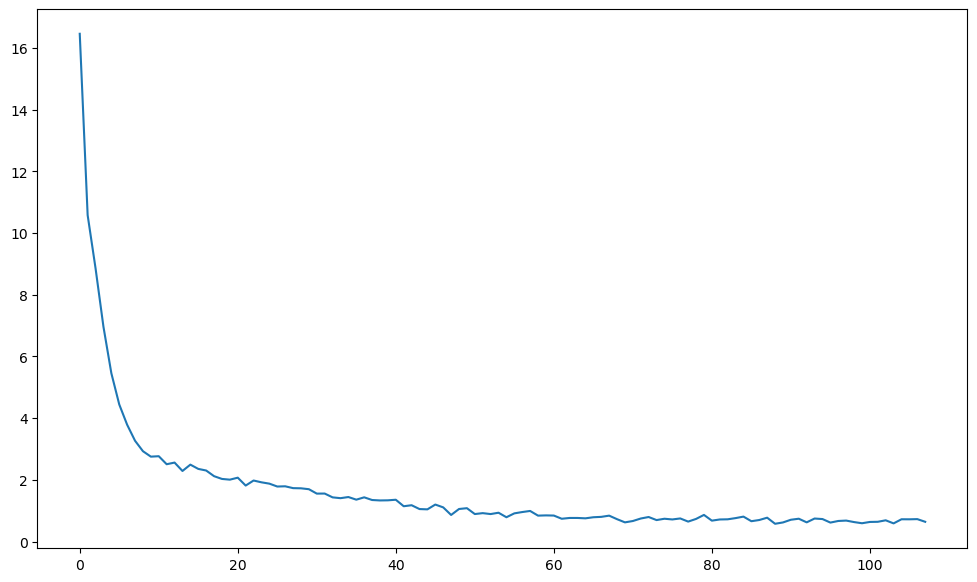

In [1012]:
plt.plot(loss_t)

In [1013]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

Text(0.5, 0, 'Date')

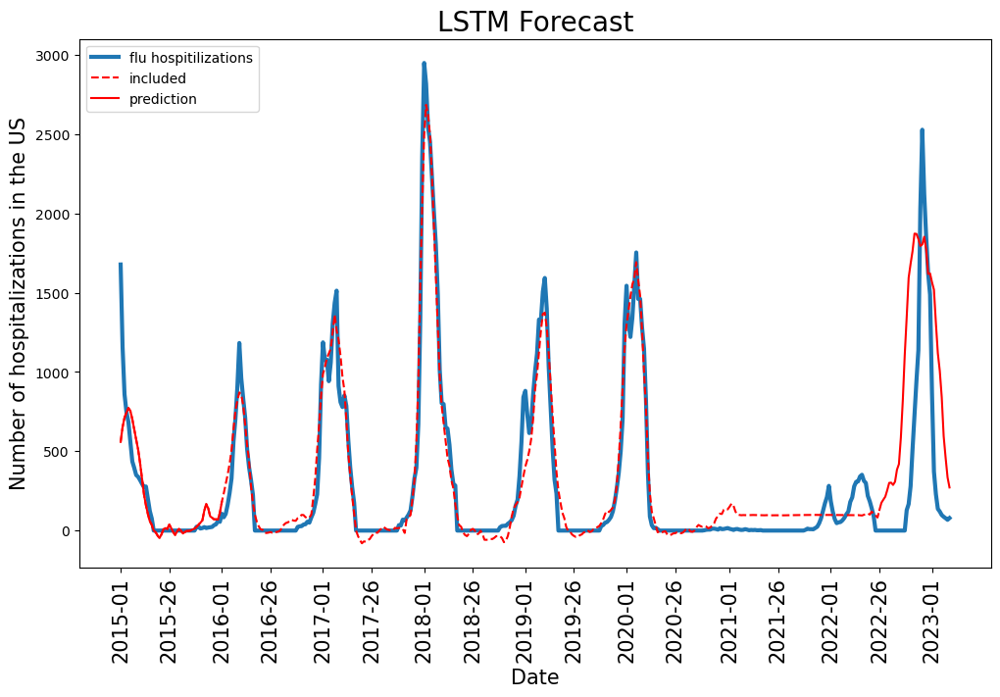

In [1014]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2015-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2015-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.plot(max_*plot_df["pred"].loc['2015-01':'2016-01'],color='red')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## rnn single drop

In [47]:
class rnn_single_drop(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(rnn_single_drop, self).__init__()
        
        
        
        self.rnn = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(156,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.rnn(x.permute(0,2,1))
        
        
        logits = self.seq(logits)
        
        
        return logits

In [1332]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn_single_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn_single_drop.pth
epoch 0 0 0
Train loss: 9.058159622748367 Val loss: 0.7873381256358698 Time: 0.6085881000617519
epoch 1 0 0
Train loss: 5.146856986125412 Val loss: 0.5048326815012842 Time: 0.8089008000679314
epoch 2 0 0
Train loss: 5.3611829906857515 Val loss: 0.5379138849693845 Time: 0.6435223000589758
epoch 3 1 1
Train loss: 6.158244089196041 Val loss: 0.574920678336639 Time: 0.6579270999645814
epoch 4 2 2
Train loss: 3.8741324860379045 Val loss: 0.7964666686020792 Time: 0.6303765999618918
epoch 5 3 0
Train loss: 3.9433832721068174 Val loss: 0.8979218158056028 Time: 0.6371810999698937
epoch 6 4 1
Train loss: 3.024319147682217 Val loss: 0.5619068844243884 Time: 0.6239087999565527
epoch 7 0 0
Train loss: 3.013275375442186 Val loss: 0.7191615272313356 Time: 0.6325043000979349
epoch 8 1 0
Train loss: 2.3736283623179038 Val loss: 0.7780116081703454 Time: 0.6311308000003919
epoch 9 2 0
Train loss: 2.700969871383407 Val loss: 0.652698776

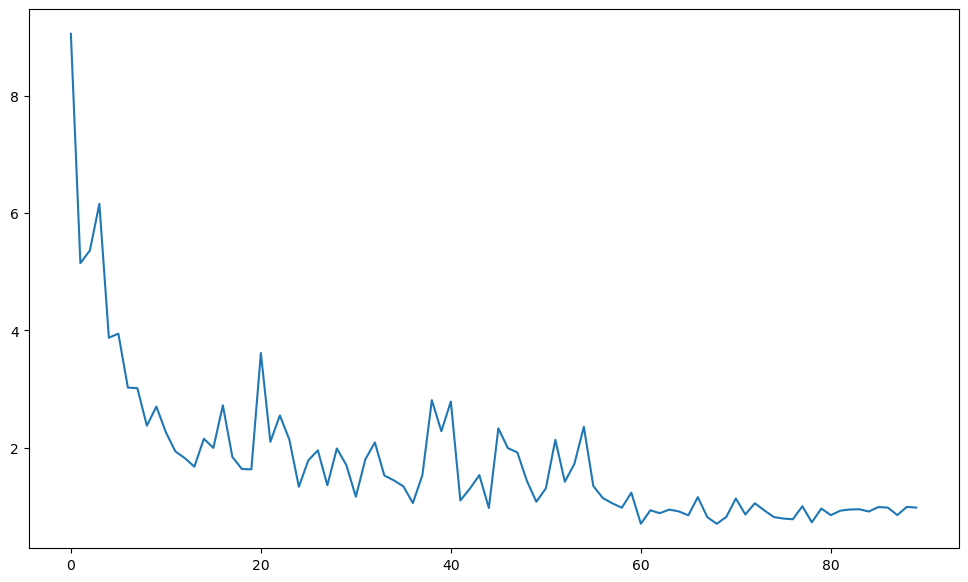

In [1333]:
plt.plot(loss_t)

Text(0.5, 0, 'Date')

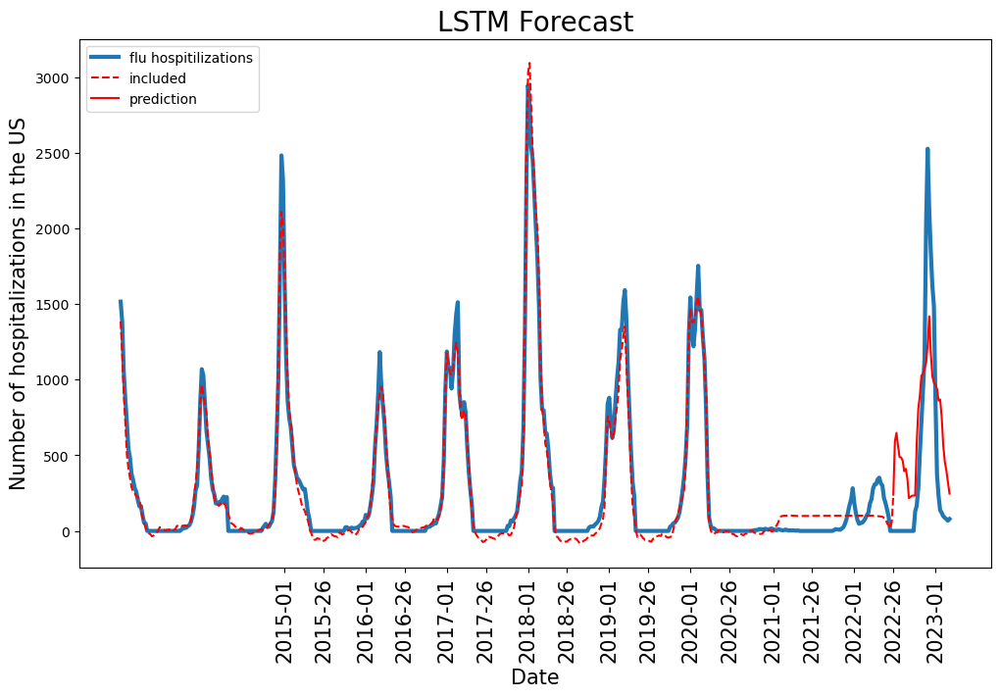

In [1334]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## rnn drop

In [48]:
class rnn_drop(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(rnn_drop, self).__init__()
        
        
        
        self.rnn = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(seq_len*country_len,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.rnn(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.rnn(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1336]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn_drop.pth
epoch 0 0 0
Train loss: 17.400355630142002 Val loss: 2.415767035461613 Time: 0.9720051999902353
epoch 1 0 0
Train loss: 14.89921304381204 Val loss: 2.216473434059708 Time: 0.8404650000156835
epoch 2 0 0
Train loss: 13.150300700752865 Val loss: 1.9860756950806184 Time: 0.820486200042069
epoch 3 0 0
Train loss: 10.208992170710488 Val loss: 1.2393044015188934 Time: 0.7829510999144986
epoch 4 0 0
Train loss: 7.364540751831307 Val loss: 0.9678347793087596 Time: 0.7642782999901101
epoch 5 0 0
Train loss: 6.5595577854892415 Val loss: 0.9487080499966396 Time: 0.7718125999672338
epoch 6 0 0
Train loss: 6.507101843477085 Val loss: 0.8528060939010516 Time: 0.7906813999870792
epoch 7 0 0
Train loss: 6.436105809887005 Val loss: 0.8147435072060034 Time: 0.7952889000298455
epoch 8 0 0
Train loss: 6.060276042577545 Val loss: 0.7392077338445233 Time: 0.8465341000119224
epoch 9 0 0
Train loss: 5.552451334424376 Val loss: 0.6909454522028682 T

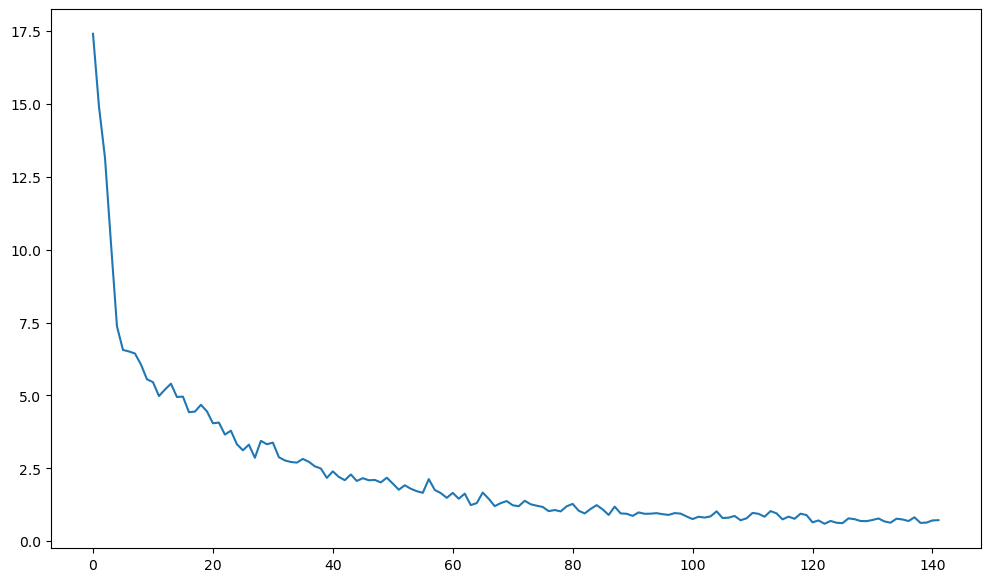

In [1337]:
plt.plot(loss_t)

In [1340]:

MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

Text(0.5, 0, 'Date')

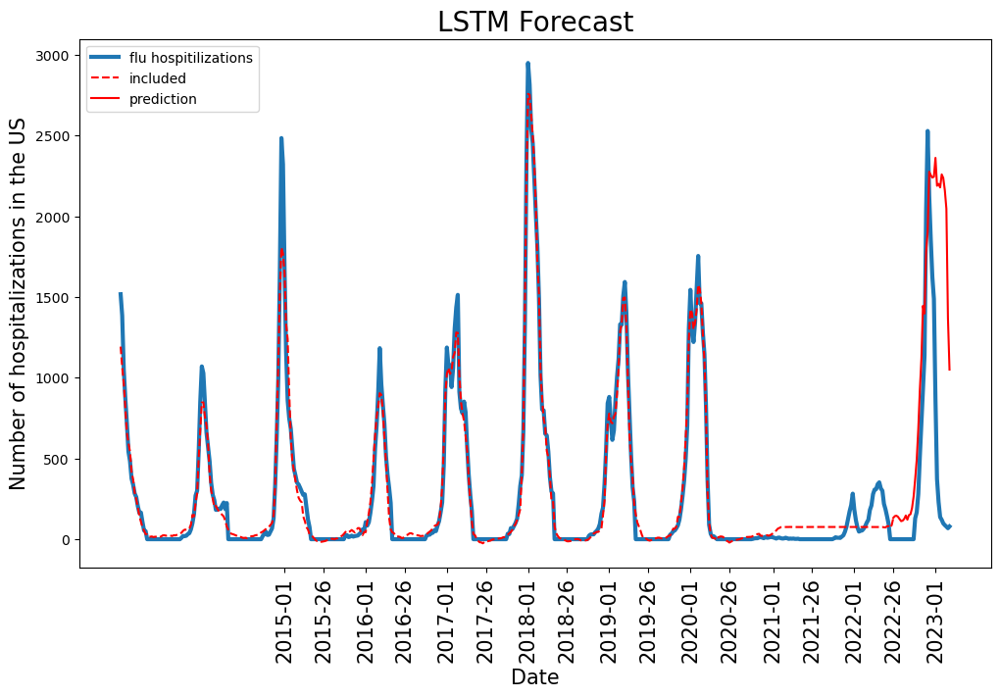

In [1341]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### Include USA lags

In [1494]:
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index)
tmp['1_year'] = tmp['all'].shift(52-20)
tmp['2_year'] = tmp['all'].shift(2*52-20)
tmp['3_year'] = tmp['all'].shift(3*52-20)
tmp = tmp.join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(1227, 26, 9)
(1227,)


In [1495]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn_drop(26,9).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_wusa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn_drop_wusa.pth
epoch 0 0 0
Train loss: 15.219197715236987 Val loss: 2.2914466772881497 Time: 0.8424637999851257
epoch 1 0 0
Train loss: 14.510039164748882 Val loss: 2.3180276766497627 Time: 0.7483014001045376
epoch 2 1 0
Train loss: 13.601234888919883 Val loss: 2.2311884639748314 Time: 0.7245905000017956
epoch 3 0 0
Train loss: 10.494733838925427 Val loss: 1.5817405486595817 Time: 0.7554228999651968
epoch 4 0 0
Train loss: 7.46676618280695 Val loss: 1.3592314299894497 Time: 0.7483401999343187
epoch 5 0 0
Train loss: 6.410889981510281 Val loss: 1.252417045798211 Time: 0.7640585999470204
epoch 6 0 0
Train loss: 5.905759317745982 Val loss: 1.141683994737832 Time: 0.740024899947457
epoch 7 0 0
Train loss: 5.791875123408007 Val loss: 1.1049538745573955 Time: 0.7407274000579491
epoch 8 0 0
Train loss: 5.291780929288879 Val loss: 1.0809773824876174 Time: 0.7733425999758765
epoch 9 0 0
Train loss: 5.283232456108012 Val loss: 1.05278203627676

Text(0.5, 0, 'Date')

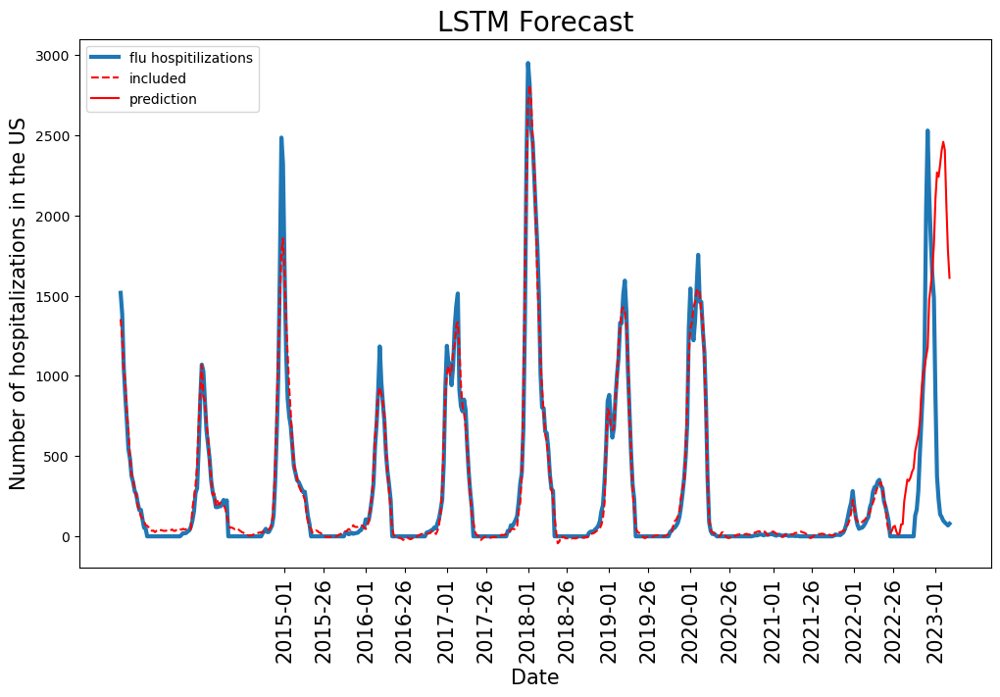

In [1496]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019

In [1468]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn_drop_2019.pth
epoch 0 0 0
Train loss: 12.290370331489726 Val loss: 0.41845395670907237 Time: 0.5169772999361157
epoch 1 0 0
Train loss: 11.15421690378082 Val loss: 0.35366842383518815 Time: 0.5545686999103054
epoch 2 0 0
Train loss: 8.975318886208242 Val loss: 0.2914801553124562 Time: 0.5888149000238627
epoch 3 0 0
Train loss: 6.927197376629664 Val loss: 0.37157971190663375 Time: 0.6165296999970451
epoch 4 1 0
Train loss: 6.0772889534989645 Val loss: 0.385431995546746 Time: 0.5158222999889404
epoch 5 2 0
Train loss: 5.469345830843643 Val loss: 0.49950718035324826 Time: 0.6182647000532597
epoch 6 3 0
Train loss: 4.9381650115664355 Val loss: 0.5115067270371583 Time: 0.5120472999988124
epoch 7 4 0
Train loss: 4.928500353331424 Val loss: 0.6070579359570729 Time: 0.47107989992946386
epoch 8 5 0
Train loss: 4.323475135185319 Val loss: 0.6920139150533942 Time: 0.48921200004406273
epoch 9 6 0
Train loss: 4.222289037469068 Val loss: 0.830547

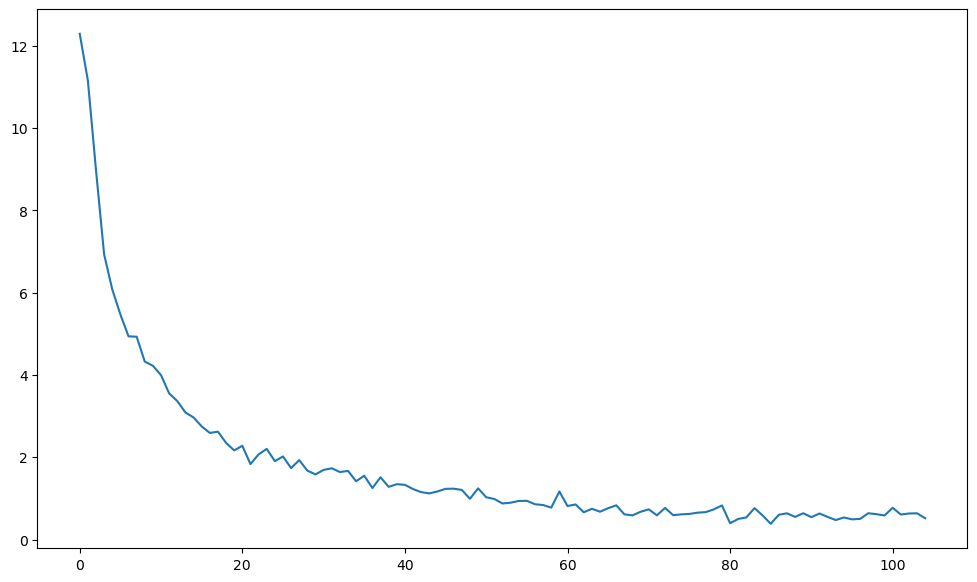

In [1469]:
plt.plot(loss_t)

Text(0.5, 0, 'Date')

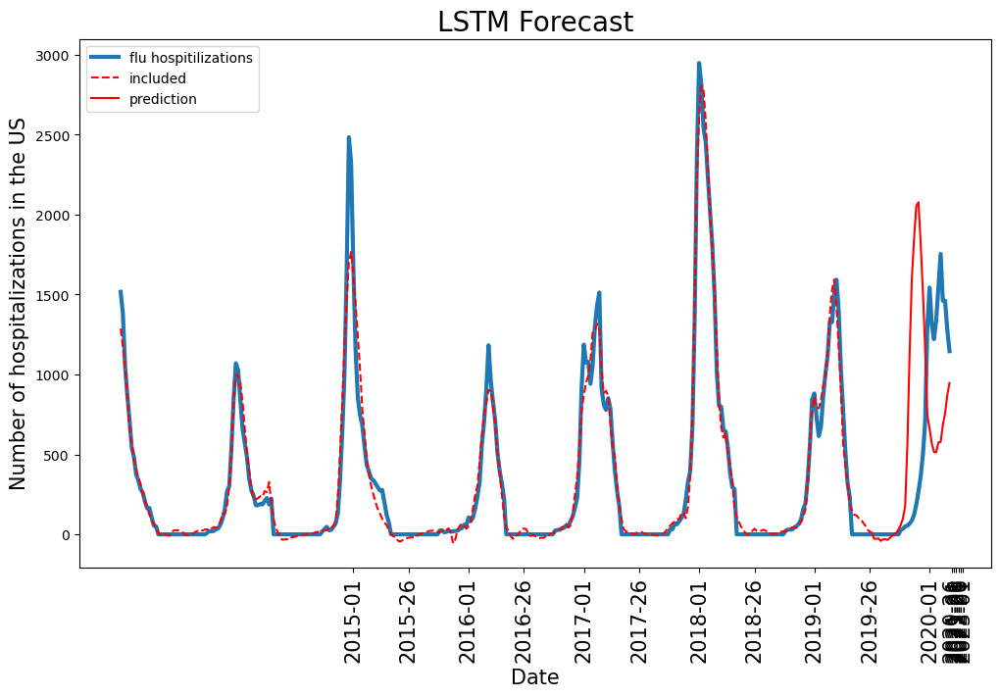

In [1470]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019 w usa

In [1613]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn_drop(26,9).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn_drop_2019_usa.pth
epoch 0 0 0
Train loss: 11.98965594731385 Val loss: 0.3836778143886477 Time: 0.7448054000269622
epoch 1 0 0
Train loss: 11.393109414550963 Val loss: 0.332661507789453 Time: 0.5456081999000162
epoch 2 0 0
Train loss: 10.381026230298104 Val loss: 0.23529485415201634 Time: 0.5720422000158578
epoch 3 0 0
Train loss: 8.22987816649993 Val loss: 0.18544214299854075 Time: 0.5484973001293838
epoch 4 0 0
Train loss: 6.432763977327829 Val loss: 0.28002599331776423 Time: 0.5391923999413848
epoch 5 1 0
Train loss: 5.984537809239297 Val loss: 0.32968881125270855 Time: 0.5318408000748605
epoch 6 2 0
Train loss: 5.633120245216126 Val loss: 0.36840221347847546 Time: 0.529694999800995
epoch 7 3 0
Train loss: 5.1411511329944855 Val loss: 0.4377626411496749 Time: 0.5197678999975324
epoch 8 4 0
Train loss: 4.91062545686745 Val loss: 0.5381928050756706 Time: 0.5246026001404971
epoch 9 5 0
Train loss: 4.34051432551783 Val loss: 0.6709073

Text(0.5, 0, 'Date')

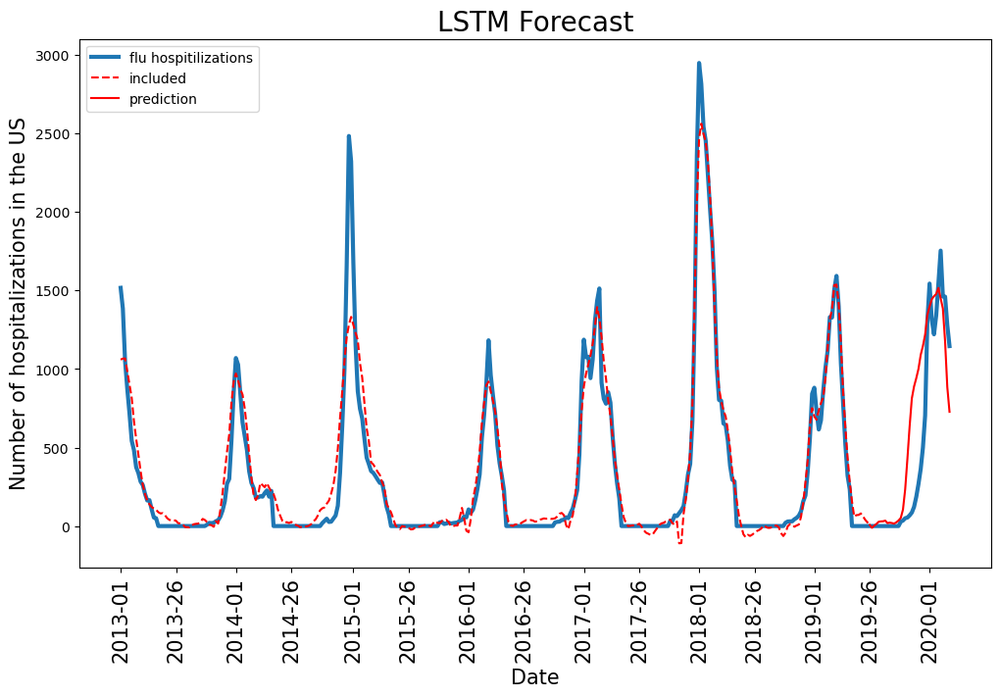

In [1614]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## GRU

In [49]:
class gru(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(gru, self).__init__()
        
        
        
        self.gru = nn.GRU(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
            nn.Dropout(0.01),
            nn.Linear(seq_len*country_len,1)
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.gru(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.gru(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1113]:
df_in = df_norm
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index).join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(1227, 26, 6)
(1227,)


In [1434]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru.pth
epoch 0 0 0
Train loss: 14.303111189953256 Val loss: 2.1654149584210245 Time: 0.9295877999393269
epoch 1 0 0
Train loss: 13.955486456860319 Val loss: 2.1323846344530466 Time: 0.9190649999072775
epoch 2 0 0
Train loss: 13.22935132231055 Val loss: 2.047891724049933 Time: 0.8946753999916837
epoch 3 0 0
Train loss: 11.241963898550495 Val loss: 1.7730386111070402 Time: 0.8453624000540003
epoch 4 0 0
Train loss: 8.210857375810633 Val loss: 1.414436504128389 Time: 0.8800205999286845
epoch 5 0 0
Train loss: 7.017144070939189 Val loss: 1.234070729744417 Time: 0.8712758000474423
epoch 6 0 0
Train loss: 6.467081938400408 Val loss: 1.1185920411953703 Time: 0.8809045000234619
epoch 7 0 0
Train loss: 6.102840091920047 Val loss: 1.0320460665388964 Time: 0.831189600052312
epoch 8 0 0
Train loss: 5.7463556699484695 Val loss: 0.9573095521482173 Time: 0.8436825999524444
epoch 9 0 0
Train loss: 5.461361879902089 Val loss: 0.898635799792828 Time: 0.

In [1435]:

MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

Text(0.5, 0, 'Date')

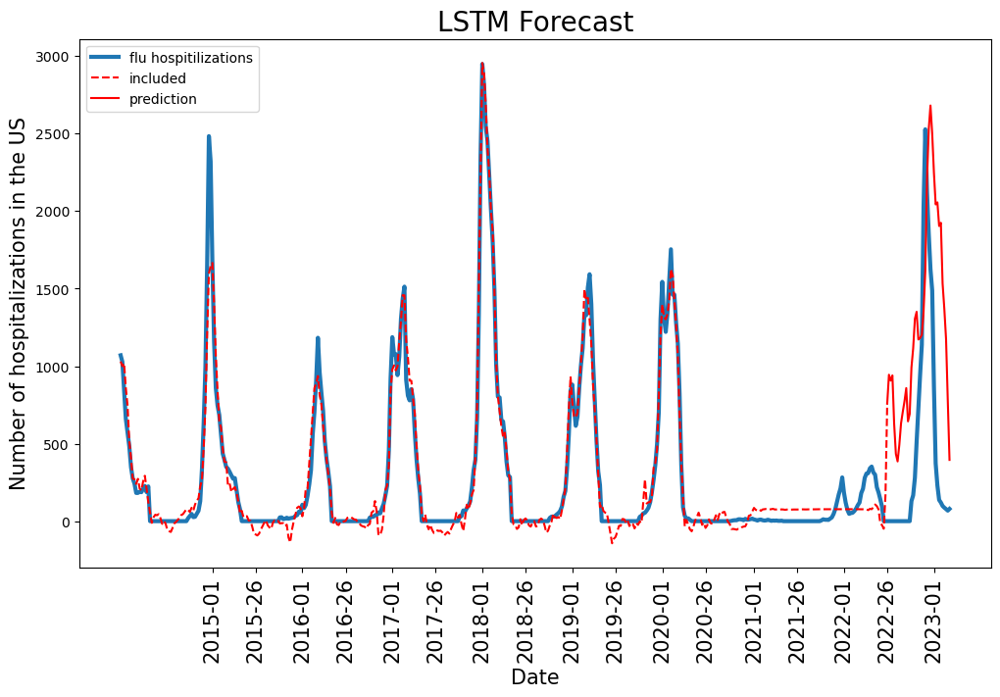

In [1436]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2014-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2014-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019

In [1477]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru_2019.pth
epoch 0 0 0
Train loss: 12.129932316481927 Val loss: 0.24980580250849016 Time: 0.5326759000308812
epoch 1 0 0
Train loss: 11.19224514297457 Val loss: 0.28872565980418585 Time: 0.5361658000620082
epoch 2 1 0
Train loss: 10.75633468764704 Val loss: 0.2681204240943771 Time: 0.49040629994124174
epoch 3 0 0
Train loss: 9.36794486174756 Val loss: 0.18057456868700683 Time: 0.46762779995333403
epoch 4 0 0
Train loss: 7.033777605546665 Val loss: 0.1842717748368159 Time: 0.46806850004941225
epoch 5 1 0
Train loss: 5.642164715395034 Val loss: 0.2914926886402327 Time: 0.462870099931024
epoch 6 2 0
Train loss: 5.284906271351531 Val loss: 0.37450328739338107 Time: 0.468997799907811
epoch 7 3 0
Train loss: 5.047097187997892 Val loss: 0.42690002606809685 Time: 0.49658689997158945
epoch 8 4 0
Train loss: 4.711015077314254 Val loss: 0.49664743350413953 Time: 0.5071371000958607
epoch 9 5 0
Train loss: 4.349478186360136 Val loss: 0.55983956320

Text(0.5, 0, 'Date')

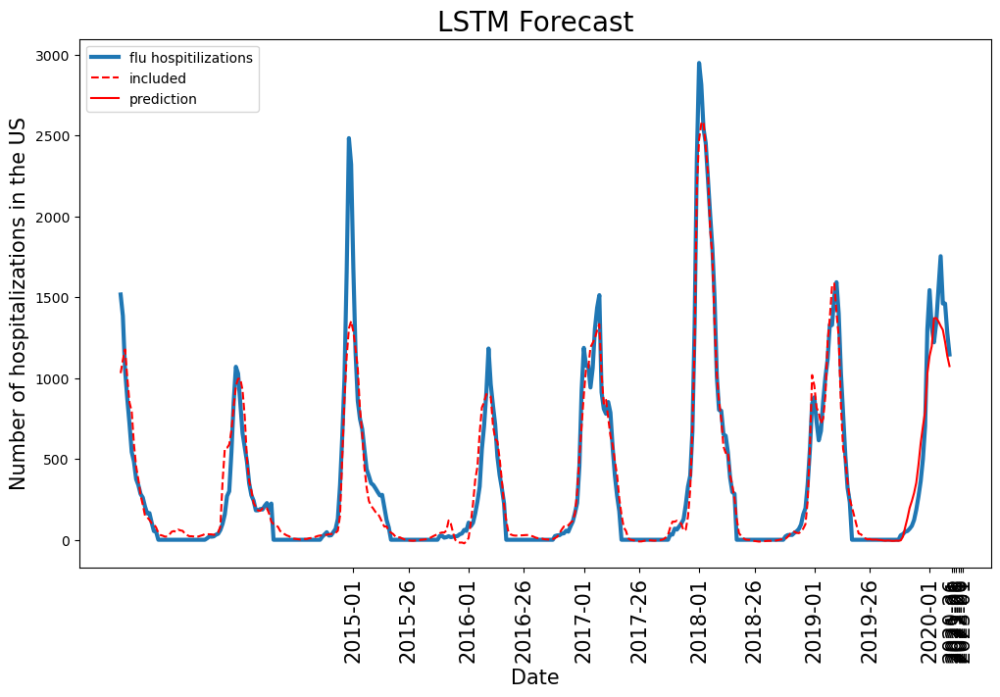

In [1479]:
plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019 w usa

In [1615]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru(26,9).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru_2019_usa.pth
epoch 0 0 0
Train loss: 11.66003859676556 Val loss: 0.2641284261699184 Time: 0.8541117000859231
epoch 1 0 0
Train loss: 11.464572997825403 Val loss: 0.282018041165486 Time: 0.5548249001149088
epoch 2 1 0
Train loss: 11.239236716166912 Val loss: 0.26946597230198677 Time: 0.4848455002065748
epoch 3 0 0
Train loss: 10.762840265459658 Val loss: 0.23425426770700142 Time: 0.5221472000703216
epoch 4 0 0
Train loss: 9.51892966556261 Val loss: 0.15503739909036085 Time: 0.5123962999787182
epoch 5 0 0
Train loss: 7.6542780129121155 Val loss: 0.1451083823285444 Time: 0.5069424998946488
epoch 6 0 0
Train loss: 6.424821788060626 Val loss: 0.2058943920675631 Time: 0.5110703001264483
epoch 7 1 0
Train loss: 6.005572939339086 Val loss: 0.2604375483117052 Time: 0.4820694997906685
epoch 8 2 0
Train loss: 5.682935993601291 Val loss: 0.2976110176718123 Time: 0.49182130000554025
epoch 9 3 0
Train loss: 5.508375332706237 Val loss: 0.340710030

Text(0.5, 0, 'Date')

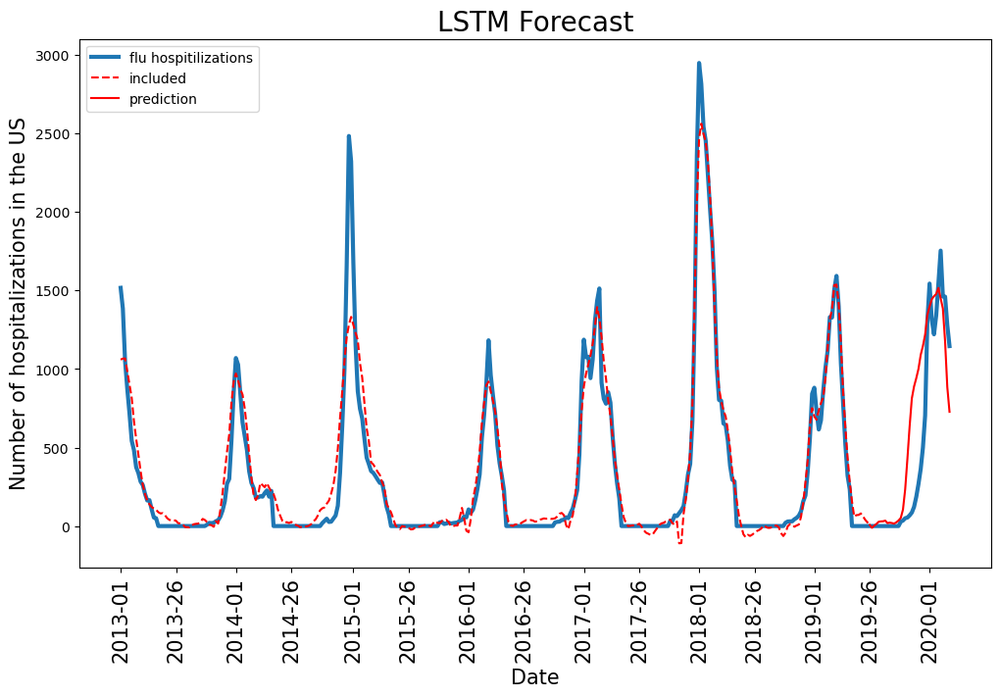

In [1616]:
plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### include USA lags

In [1524]:
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index)
tmp['1_year'] = tmp['all'].shift(52-20)
tmp['2_year'] = tmp['all'].shift(2*52-20)
#tmp['3_year'] = tmp['all'].shift(3*52-20)
#tmp['4_year'] = tmp['all'].shift(4*52-20)
tmp = tmp.join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(1227, 26, 8)
(1227,)


In [1526]:
 device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru(26,8).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru_usa.pth
epoch 0 0 0
Train loss: 15.758757280621246 Val loss: 2.236231456612586 Time: 0.8606273999903351
epoch 1 0 0
Train loss: 13.456851283320596 Val loss: 2.1461014451633673 Time: 0.8934593999292701
epoch 2 0 0
Train loss: 11.588007182325242 Val loss: 1.9179054005580838 Time: 0.7437646999023855
epoch 3 0 0
Train loss: 8.713598759571596 Val loss: 1.5178611518349499 Time: 0.6745625000912696
epoch 4 0 0
Train loss: 7.311361069282629 Val loss: 1.2934272201964632 Time: 0.6649521999061108
epoch 5 0 0
Train loss: 6.704172491957546 Val loss: 1.1592516564414836 Time: 0.6818856000900269
epoch 6 0 0
Train loss: 6.285319221383588 Val loss: 1.0823219289941335 Time: 0.6508629999589175
epoch 7 0 0
Train loss: 5.971938454708905 Val loss: 1.0424526888855326 Time: 0.6893833999056369
epoch 8 0 0
Train loss: 5.742338891778175 Val loss: 1.0220344696863322 Time: 0.692979299928993
epoch 9 0 0
Train loss: 5.484899078406428 Val loss: 1.007048890722217 Tim

Text(0.5, 0, 'Date')

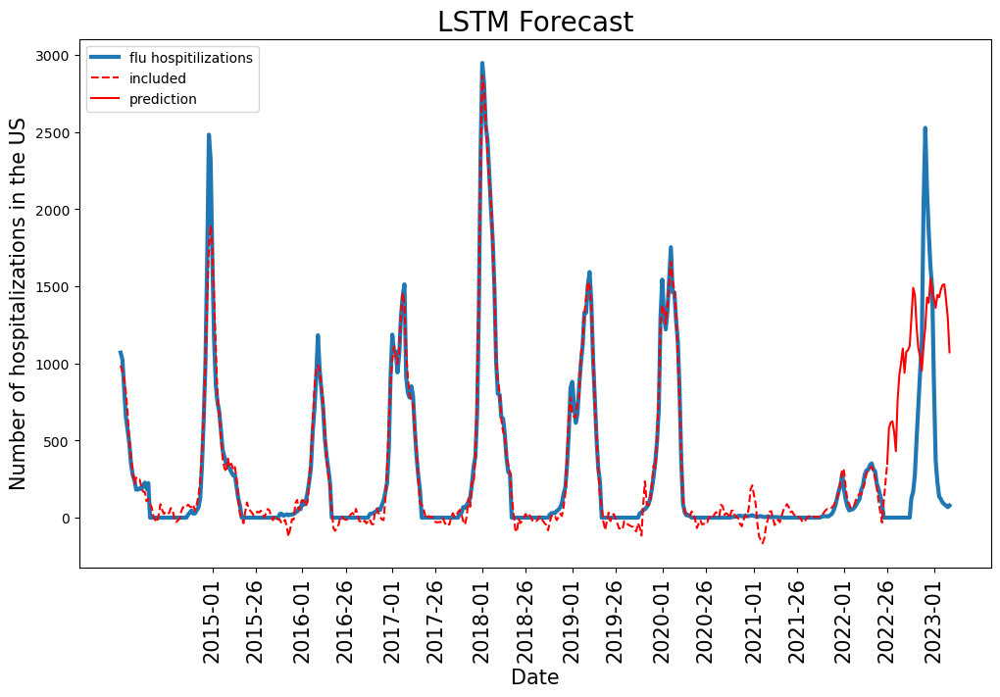

In [1527]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2014-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2014-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## RNN 3 layers drop

In [50]:
class rnn_3lay_drop(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(rnn_3lay_drop, self).__init__()
        
    
        self.rnn = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(156,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )       
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.rnn(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.rnn(logits)

        logits = self.enc(logits)
        logits, _ = self.rnn(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1118]:
df_in = df_norm
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index).join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(1227, 26, 6)
(1227,)


In [1350]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn_3lay_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn_3lay_drop.pth
epoch 0 0 0
Train loss: 15.394810721849908 Val loss: 2.3305733765810146 Time: 1.0240323999896646
epoch 1 0 0
Train loss: 14.720253035630321 Val loss: 2.2929206288933983 Time: 1.1353935000952333
epoch 2 0 0
Train loss: 13.872792072381344 Val loss: 2.1772420711107543 Time: 1.0874916000757366
epoch 3 0 0
Train loss: 10.92877173754316 Val loss: 1.4013403177959844 Time: 1.1981284999055788
epoch 4 0 0
Train loss: 7.426219974279093 Val loss: 1.0933235877018888 Time: 1.114311799989082
epoch 5 0 0
Train loss: 6.413972569786527 Val loss: 0.9379645361259463 Time: 1.796983000007458
epoch 6 0 0
Train loss: 6.054282191692401 Val loss: 0.7933041682117619 Time: 1.3872651000274345
epoch 7 0 0
Train loss: 5.613048928336868 Val loss: 0.6966230027440616 Time: 1.2706220999825746
epoch 8 0 0
Train loss: 4.6520936914044695 Val loss: 0.6292118640994886 Time: 1.061302899965085
epoch 9 0 0
Train loss: 4.694018426733251 Val loss: 0.6197649329733

In [1351]:

MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

Text(0.5, 0, 'Date')

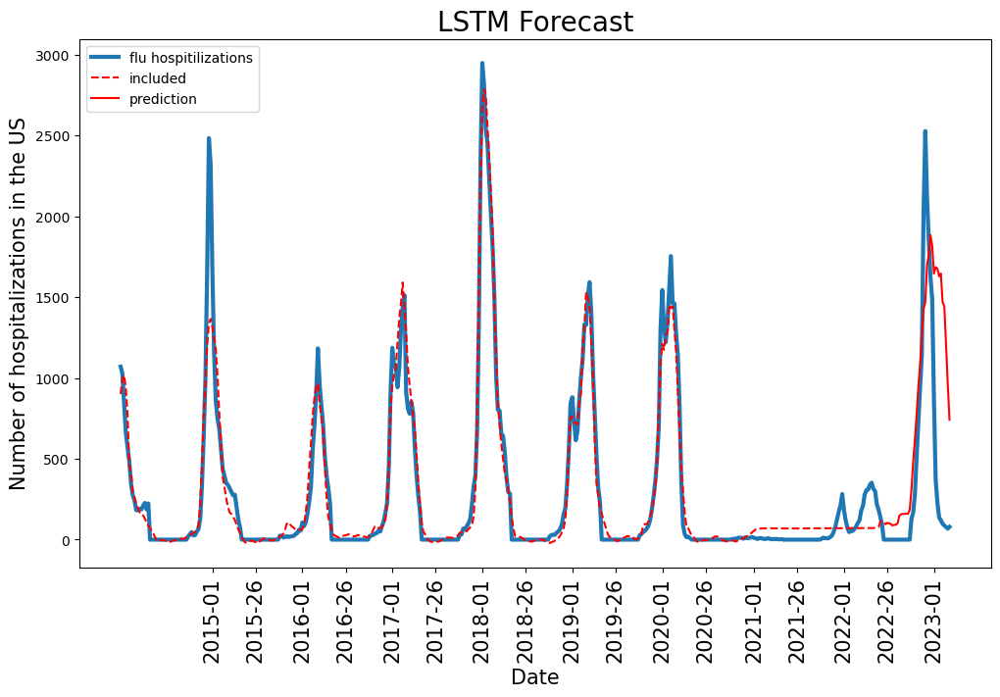

In [1352]:
plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2014-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2014-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### Different Data

In [1125]:
class lstm_3lay_diffdata(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(lstm_3lay_diffdata, self).__init__()
        
        self.lstm = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(286,1)
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)

        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1126]:
df_in = df_norm.join(df_norm_deriv,on=df_in.index,rsuffix ='_deriv')

tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index).join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(1227, 26, 11)
(1227,)


In [1127]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_3lay_diffdata(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2016-01')
t_end = index.index('2022-26')
noise = False
forecast = 26
torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_3lay_diffdata.pth
epoch 0 0 0
Train loss: 11.794382665015291 Val loss: 1.5684011283665313 Time: 0.44555629999376833
epoch 1 0 0
Train loss: 5.690913849500515 Val loss: 1.2619217119449786 Time: 0.397900800104253
epoch 2 0 0
Train loss: 3.676942938254416 Val loss: 2.000542732805968 Time: 0.44995749997906387
epoch 3 1 0
Train loss: 3.792208674563687 Val loss: 1.6121679365415957 Time: 0.5224385000765324
epoch 4 0 1
Train loss: 3.1761466546832935 Val loss: 1.7034228025877383 Time: 0.40280379995238036
epoch 5 1 0
Train loss: 2.3161225366294005 Val loss: 1.3846008538457681 Time: 0.403047600062564
epoch 6 0 0
Train loss: 2.8971014774296577 Val loss: 1.269069764035521 Time: 0.4117501999717206
epoch 7 0 1
Train loss: 2.824910454932052 Val loss: 1.632681694929488 Time: 0.39408380002714694
epoch 8 1 2
Train loss: 2.2400948683209165 Val loss: 1.666377027053386 Time: 0.41213229997083545
epoch 9 2 0
Train loss: 3.780047425990272 Val loss: 1.42258

Text(0.5, 0, 'Date')

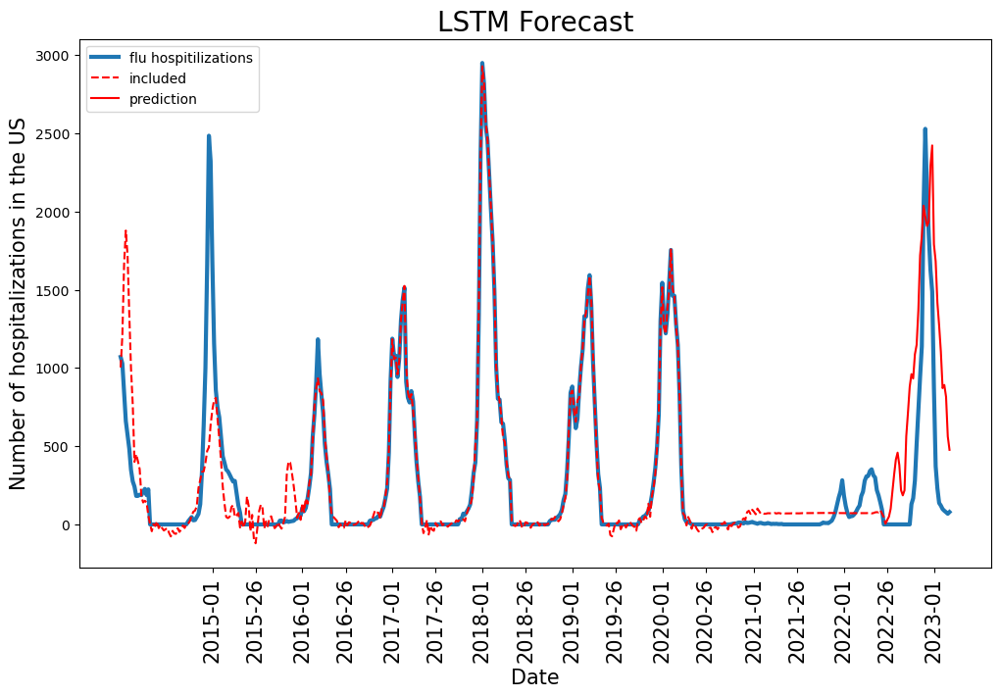

In [1128]:

MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2014-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2014-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## RNN -CNN stack

In [51]:
class lstm_cnn_drop(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(lstm_cnn_drop, self).__init__()
        
        
        self.convo = nn.Sequential(
           # nn.Flatten(start_dim =2, end_dim = -1),
            nn.ConstantPad1d(1,0),
            nn.Conv1d(seq_len,seq_len,kernel_size=3),
            nn.ReLU()
        )
        self.lstm = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(seq_len*country_len,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )      
        
    def forward(self, x):

        
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.convo(logits.permute(0,2,1))
        #logits = self.enc(logits.permute(0,2,1))
        logits, _ = self.lstm(logits.permute(0,2,1))
        
        logits = self.seq(logits)
        
        
        return logits

In [1229]:
df_in = df_norm
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index).join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(1227, 26, 6)
(1227,)


In [1371]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_cnn_drop(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_cnn_drop.pth
epoch 0 0 0
Train loss: 14.084781775156387 Val loss: 2.228297259705986 Time: 0.973969699931331
epoch 1 0 0
Train loss: 11.039730309268247 Val loss: 1.5205261349328794 Time: 0.8770991000346839
epoch 2 0 0
Train loss: 7.234914460180326 Val loss: 1.0871109425352188 Time: 0.8198207999812439
epoch 3 0 0
Train loss: 6.565564453237046 Val loss: 0.9781480469973758 Time: 0.8626174000091851
epoch 4 0 0
Train loss: 5.9523358541797275 Val loss: 0.9616454899660312 Time: 0.8744005999760702
epoch 5 0 0
Train loss: 5.601512786723449 Val loss: 0.9476823087607045 Time: 0.8698912999825552
epoch 6 0 0
Train loss: 5.753036214498503 Val loss: 0.77367361378856 Time: 0.814617200056091
epoch 7 0 1
Train loss: 5.517960063004791 Val loss: 0.8743966741021723 Time: 0.8222166000632569
epoch 8 1 0
Train loss: 4.885622382158633 Val loss: 0.8187407891382463 Time: 0.8231129000196233
epoch 9 0 0
Train loss: 5.161251276483659 Val loss: 0.8917387115070596

Text(0.5, 0, 'Date')

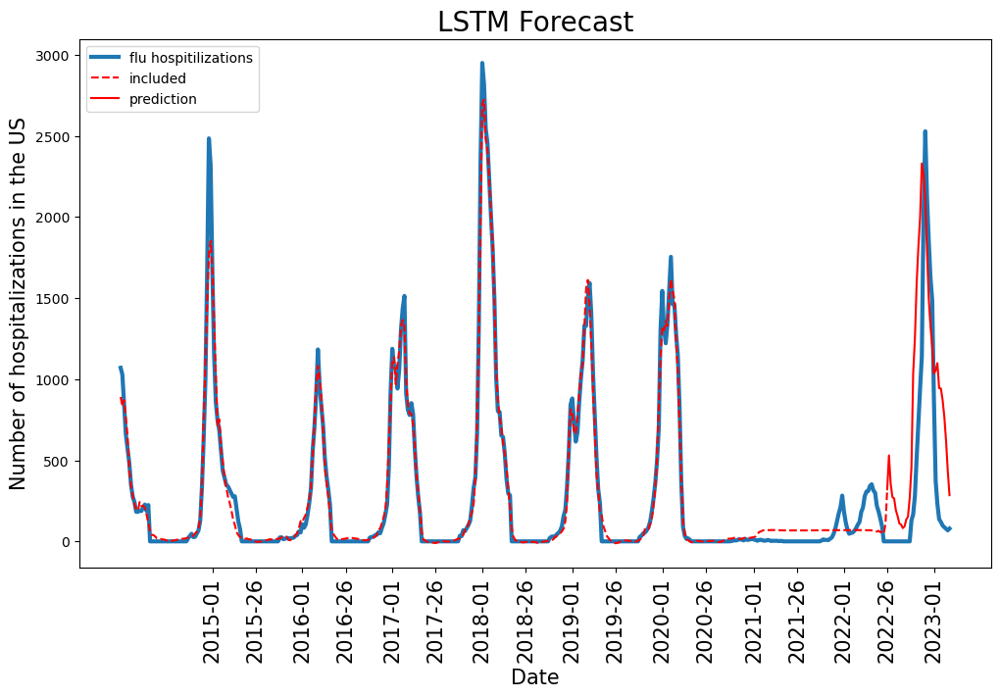

In [1372]:
image.png

### 2019

Text(0, 0.5, 'Number of hospitalizations (FluSurv-Net)')

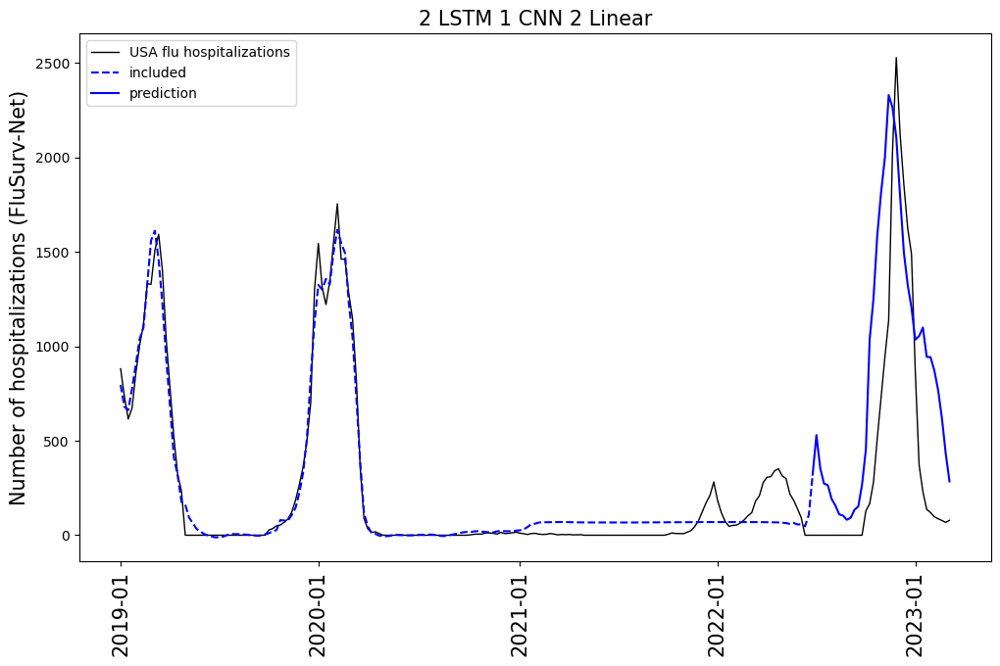

In [1736]:
model = lstm_cnn_drop(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2019-01':'2023-10'],linewidth=1,label='USA flu hospitalizations',color='black')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2019-01':'2022-26'],linestyle="dashed",color='blue',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='blue',label='prediction')
plt.legend(loc='upper left')
x_ticks=['2019-01','2020-01','2021-01','2022-01','2023-01']

plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('2 LSTM 1 CNN 2 Linear',size =15)
plt.ylabel('Number of hospitalizations (FluSurv-Net)',size =15)

Text(0.5, 0, 'Date')

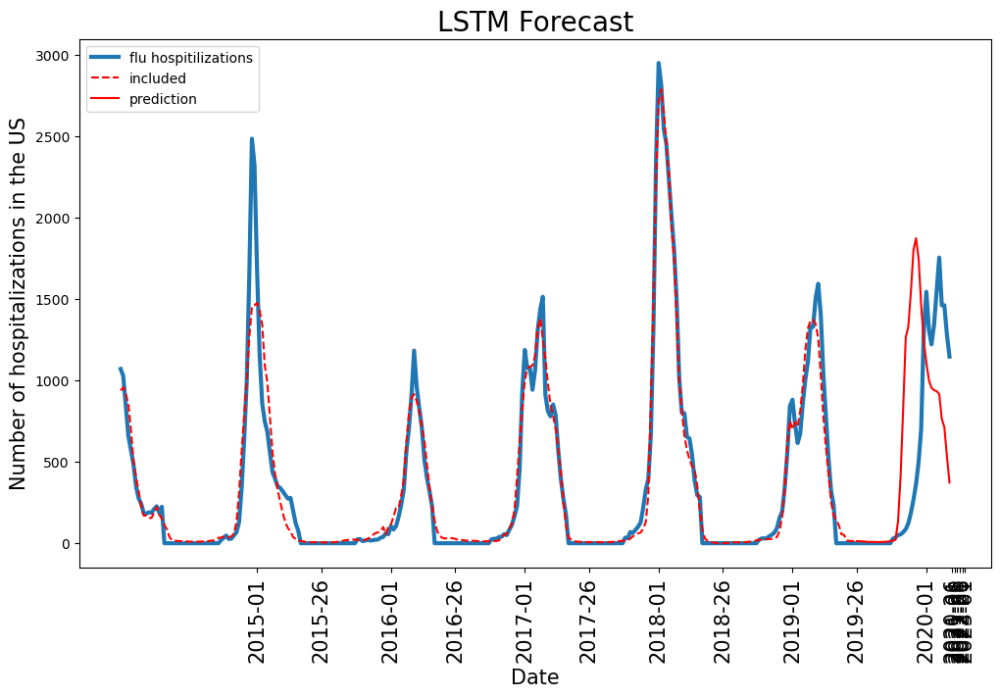

In [1487]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2014-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2014-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019 w usa

In [1617]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_cnn_drop(26,9).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_cnn_drop_2019_usa.pth
epoch 0 0 0
Train loss: 11.765327263730654 Val loss: 0.2862035023572389 Time: 0.585084400139749
epoch 1 0 0
Train loss: 10.31982884900026 Val loss: 0.1465256328228861 Time: 0.5990112000145018
epoch 2 0 0
Train loss: 7.499191845085392 Val loss: 0.17418687045028491 Time: 0.6380489999428391
epoch 3 1 0
Train loss: 6.174028260381178 Val loss: 0.24593417640699045 Time: 0.5579715999774635
epoch 4 2 0
Train loss: 5.790576833884934 Val loss: 0.296100223146631 Time: 0.598212799988687
epoch 5 3 0
Train loss: 5.709091936230724 Val loss: 0.36167851321694666 Time: 0.5871325999032706
epoch 6 4 0
Train loss: 5.1865977003905 Val loss: 0.4446718225103723 Time: 0.5892366000916809
epoch 7 5 0
Train loss: 5.0963107756093216 Val loss: 0.5153225587785073 Time: 0.6288205001037568
epoch 8 6 0
Train loss: 5.260498035213999 Val loss: 0.6000742238068142 Time: 0.5959574000444263
epoch 9 7 1
Train loss: 4.811359220493294 Val loss: 0.68109

Text(0.5, 0, 'Date')

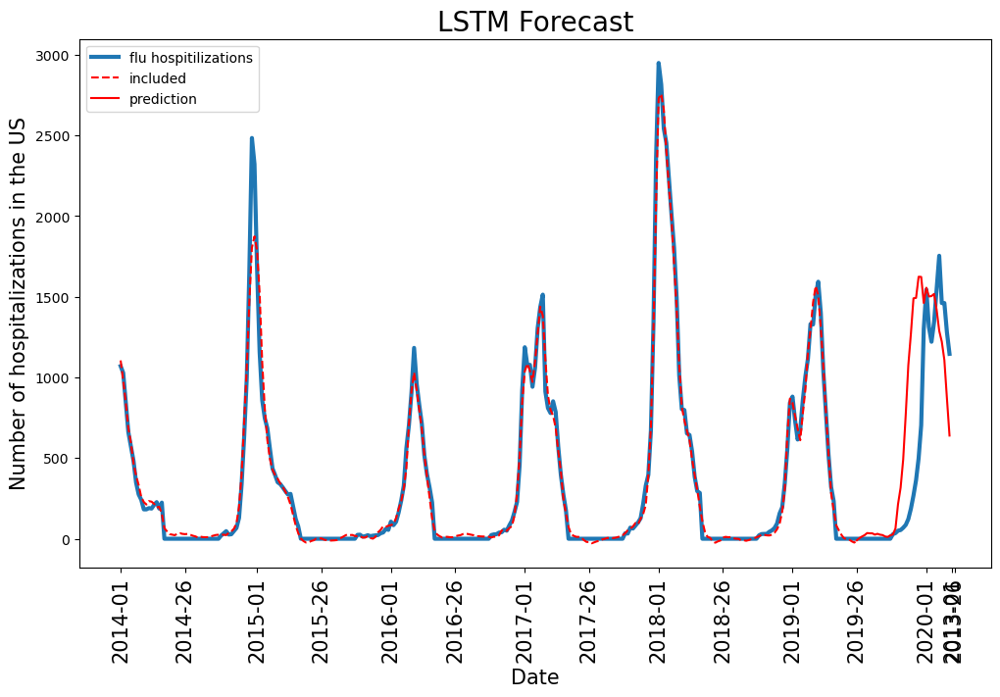

In [1618]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2014-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2014-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### USA

In [1518]:
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index)
tmp['1_year'] = tmp['all'].shift(5*52-20)
#tmp['2_year'] = tmp['all'].shift(2*52-20)
#tmp['3_year'] = tmp['all'].shift(3*52-20)
#tmp['4_year'] = tmp['all'].shift(4*52-20)
tmp = tmp.join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(1227, 26, 7)
(1227,)


In [1519]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_cnn_drop(26,7).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 200
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_cnn_drop_usa.pth
epoch 0 0 0
Train loss: 16.7305262438842 Val loss: 2.1724167283215365 Time: 0.8476671997923404
epoch 1 0 0
Train loss: 11.183986126374144 Val loss: 1.2879591951495968 Time: 0.9053899999707937
epoch 2 0 0
Train loss: 7.227859280812945 Val loss: 0.9462842196808197 Time: 0.8676027001347393
epoch 3 0 0
Train loss: 6.2048394421192725 Val loss: 0.9225936844595708 Time: 0.8504744998645037
epoch 4 0 0
Train loss: 5.9438619599681575 Val loss: 0.8912535740237217 Time: 0.8125373998191208
epoch 5 0 0
Train loss: 5.487293559879384 Val loss: 0.903454176732339 Time: 0.9065251001156867
epoch 6 1 0
Train loss: 5.217047510384058 Val loss: 0.8993713230302092 Time: 0.7972013999242336
epoch 7 0 0
Train loss: 5.028071464059743 Val loss: 0.8744893054536078 Time: 0.8502761998679489
epoch 8 0 0
Train loss: 4.960007563099772 Val loss: 0.9368172422691714 Time: 0.8454248998314142
epoch 9 1 0
Train loss: 5.126803737723721 Val loss: 1.005730749

Text(0.5, 0, 'Date')

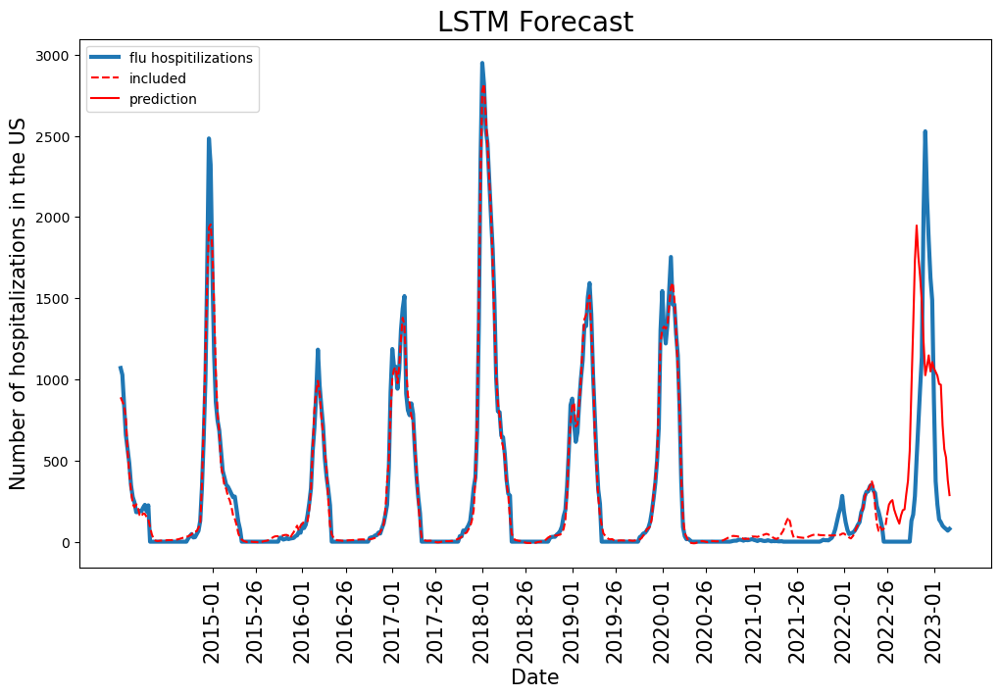

In [1520]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2014-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2014-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## GRU 3 layers drop

In [52]:
class gru_3lay_drop(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(gru_3lay_drop, self).__init__()
        
    
        self.lstm = nn.GRU(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(seq_len*country_len,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )     
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)

        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1355]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru_3lay_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru_3lay_drop.pth
epoch 0 0 0
Train loss: 18.368064131063747 Val loss: 2.3160450488286415 Time: 1.1973059000447392
epoch 1 0 0
Train loss: 14.760583692591169 Val loss: 2.248343335435493 Time: 1.3606516999425367
epoch 2 0 0
Train loss: 14.914402887962344 Val loss: 2.244213414567639 Time: 1.2365619000047445
epoch 3 0 1
Train loss: 14.754046702193179 Val loss: 2.2250932911993004 Time: 1.232370899990201
epoch 4 0 0
Train loss: 14.754015550244986 Val loss: 2.2204136379878037 Time: 1.1840875999769196
epoch 5 0 0
Train loss: 14.185623676359317 Val loss: 2.1676927906810306 Time: 1.1716332000214607
epoch 6 0 0
Train loss: 14.016082912274697 Val loss: 2.204811024312221 Time: 1.2295042999321595
epoch 7 1 0
Train loss: 10.347380436762265 Val loss: 1.1654815085639711 Time: 1.1330303999129683
epoch 8 0 0
Train loss: 6.444711538940426 Val loss: 0.9675691936231487 Time: 1.170917799929157
epoch 9 0 0
Train loss: 6.726765554163023 Val loss: 0.90482893941

Text(0.5, 0, 'Date')

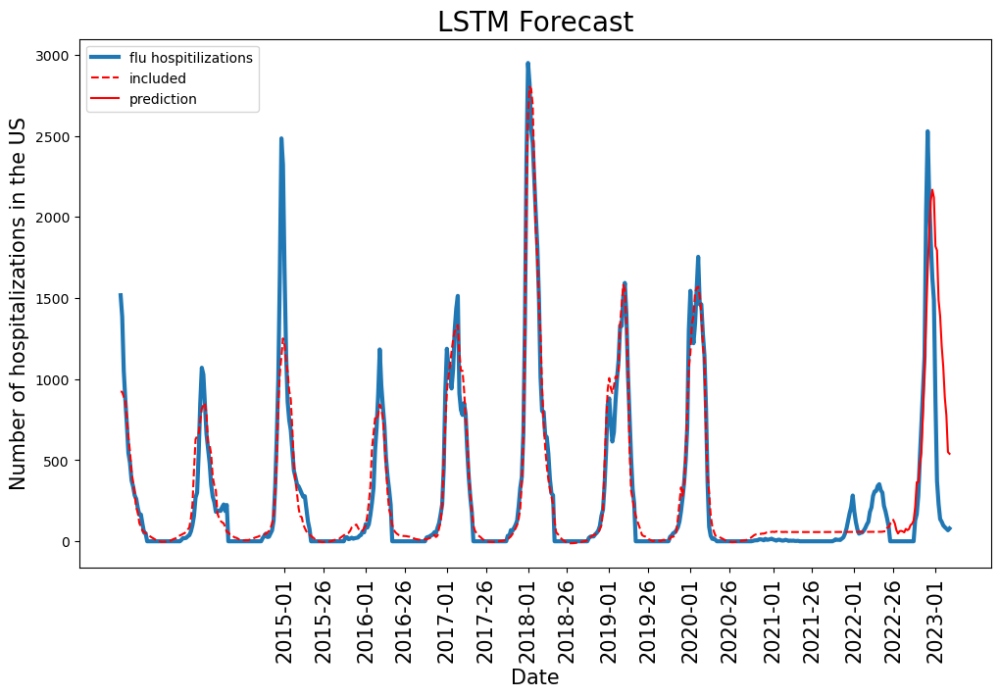

In [1356]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019

In [1483]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru_3lay_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru_3lay_drop_2019.pth
epoch 0 0 0
Train loss: 12.698234024589937 Val loss: 0.2758670583461935 Time: 0.7785373999504372
epoch 1 0 0
Train loss: 11.895654884785927 Val loss: 0.313651795740725 Time: 0.7678171000443399
epoch 2 1 0
Train loss: 11.775604025717946 Val loss: 0.32615770425218216 Time: 0.7476592999882996
epoch 3 2 0
Train loss: 11.67787511530787 Val loss: 0.3289250444086065 Time: 0.7336171999340877
epoch 4 3 0
Train loss: 11.88465718606442 Val loss: 0.3064829240848326 Time: 0.7475022999569774
epoch 5 0 1
Train loss: 11.755095019432503 Val loss: 0.30709539215274617 Time: 0.7354237000690773
epoch 6 1 2
Train loss: 11.701637361004146 Val loss: 0.30356628754790904 Time: 0.731476999935694
epoch 7 0 3
Train loss: 11.7911757211765 Val loss: 0.29042999415935356 Time: 0.7241740000899881
epoch 8 0 4
Train loss: 11.657956849631717 Val loss: 0.2936238115571541 Time: 0.727521299966611
epoch 9 1 0
Train loss: 11.615828840217318 Val loss: 0.27

Text(0.5, 0, 'Date')

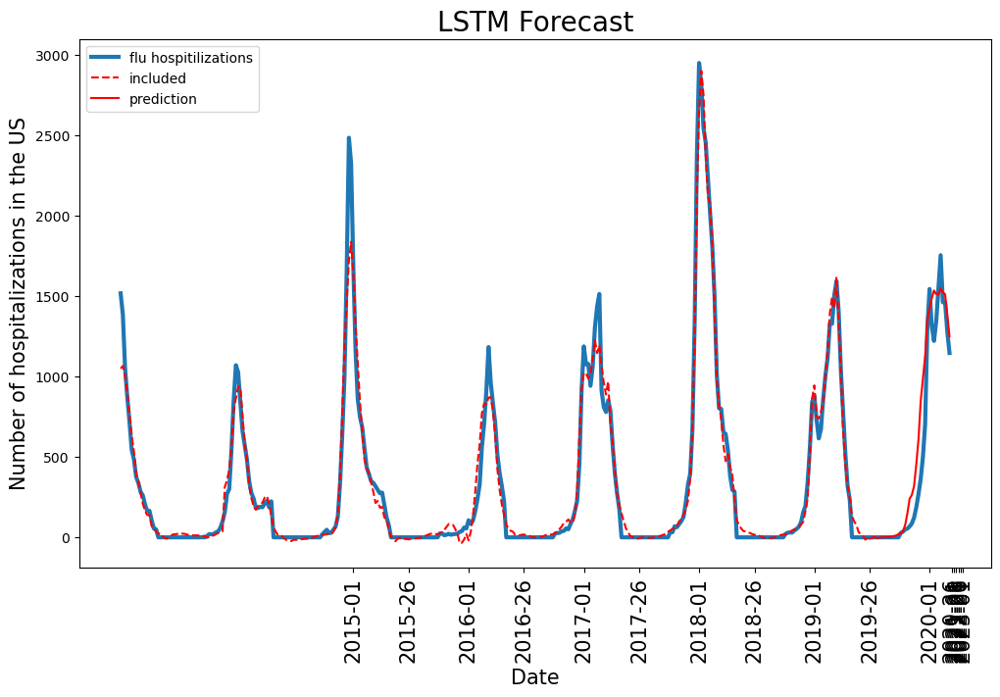

In [1484]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019 w usa

In [1621]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru_3lay_drop(26,9).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru_3lay_drop_2019_usa.pth
epoch 0 0 0
Train loss: 12.668515499993703 Val loss: 0.2941607734974241 Time: 0.9043097998946905
epoch 1 0 0
Train loss: 11.91224451293357 Val loss: 0.3155845478295305 Time: 0.804919800022617
epoch 2 1 0
Train loss: 11.821415583673277 Val loss: 0.3203383872287304 Time: 0.76282519986853
epoch 3 2 0
Train loss: 12.101519418162809 Val loss: 0.3078412015510139 Time: 0.759867100045085
epoch 4 0 1
Train loss: 11.809406293215957 Val loss: 0.3173688229881009 Time: 0.784601500025019
epoch 5 1 0
Train loss: 11.900073989162138 Val loss: 0.3108571179905084 Time: 0.7700119998771697
epoch 6 0 1
Train loss: 11.773802393871165 Val loss: 0.31056710556094913 Time: 0.7622616000007838
epoch 7 0 0
Train loss: 11.843430446508137 Val loss: 0.2859492329753266 Time: 0.8453655000776052
epoch 8 0 1
Train loss: 11.504905986104859 Val loss: 0.2667680071317591 Time: 1.1189542000647634
epoch 9 0 0
Train loss: 10.523930505456974 Val loss: 0.

Text(0.5, 0, 'Date')

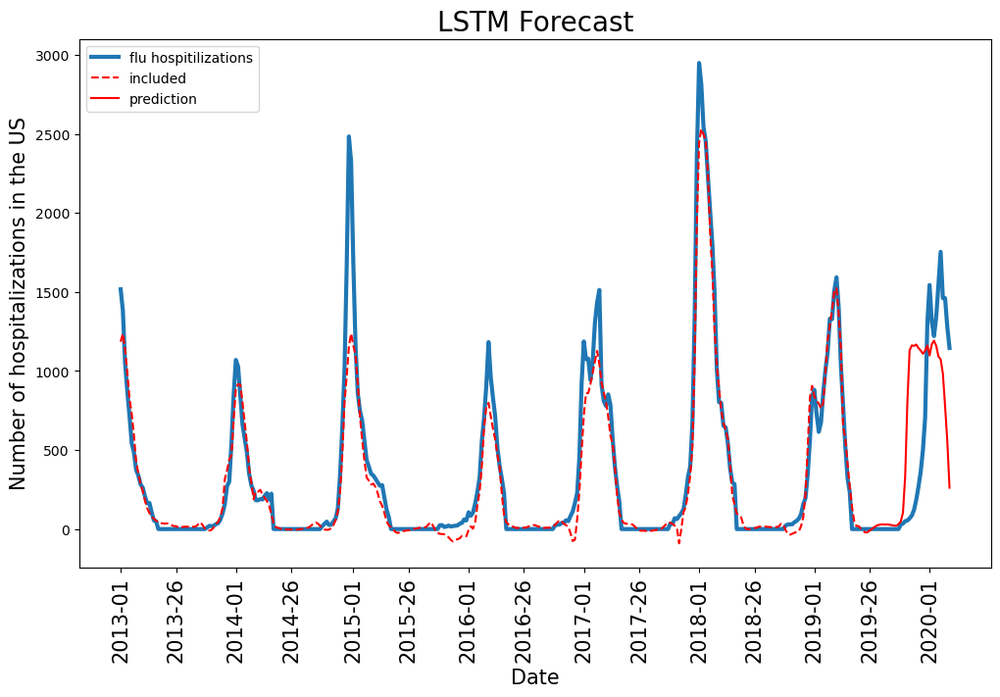

In [1622]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## GRU drop

In [53]:
class gru_drop(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(gru_drop, self).__init__()
        
        
        
        self.lstm = nn.GRU(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(seq_len*country_len,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1303]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru_drop.pth
epoch 0 0 0
Train loss: 16.004916020083982 Val loss: 2.2630833231851284 Time: 1.078525000018999
epoch 1 0 0
Train loss: 14.515010604684676 Val loss: 2.1956927931714745 Time: 1.4093567000236362
epoch 2 0 0
Train loss: 12.577459247955176 Val loss: 1.7912444366520504 Time: 2.4006672999821603
epoch 3 0 0
Train loss: 8.253334214656793 Val loss: 1.1069505658269918 Time: 1.9689779999898747
epoch 4 0 0
Train loss: 6.28530863276414 Val loss: 0.9365875393559691 Time: 2.092409799923189
epoch 5 0 0
Train loss: 5.7864794463378875 Val loss: 0.9136903985636309 Time: 1.9726541999261826
epoch 6 0 0
Train loss: 5.814861771125468 Val loss: 0.8037785051274113 Time: 1.9283055000705644
epoch 7 0 1
Train loss: 5.512009737098984 Val loss: 0.7329781375010498 Time: 1.8731334999902174
epoch 8 0 0
Train loss: 5.151086807337329 Val loss: 0.719051926425891 Time: 1.8557286000577733
epoch 9 0 0
Train loss: 4.9449021812787635 Val loss: 0.7295385589604848 T

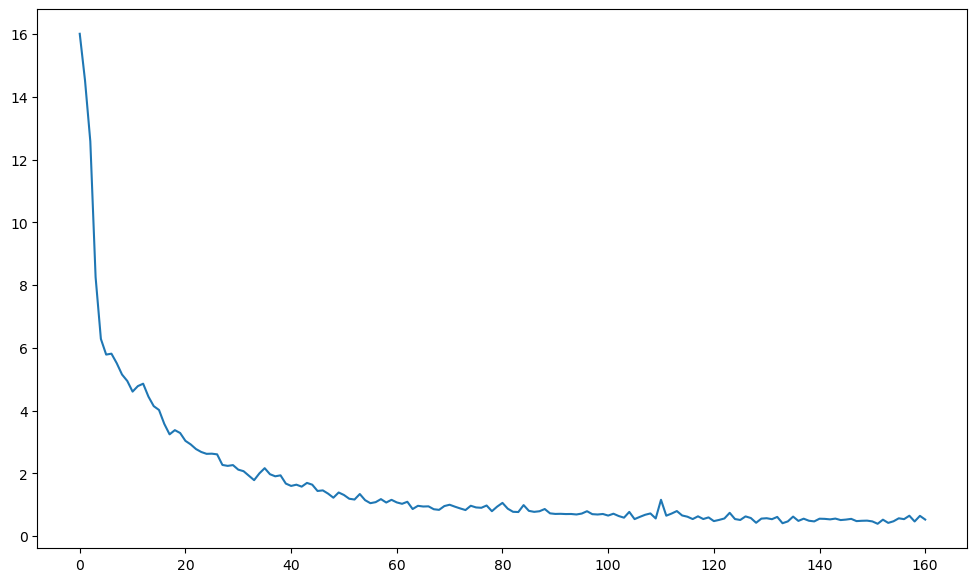

In [1304]:
plt.plot(loss_t)

Text(0, 0.5, 'Number of hospitalizations (FluSurv-Net)')

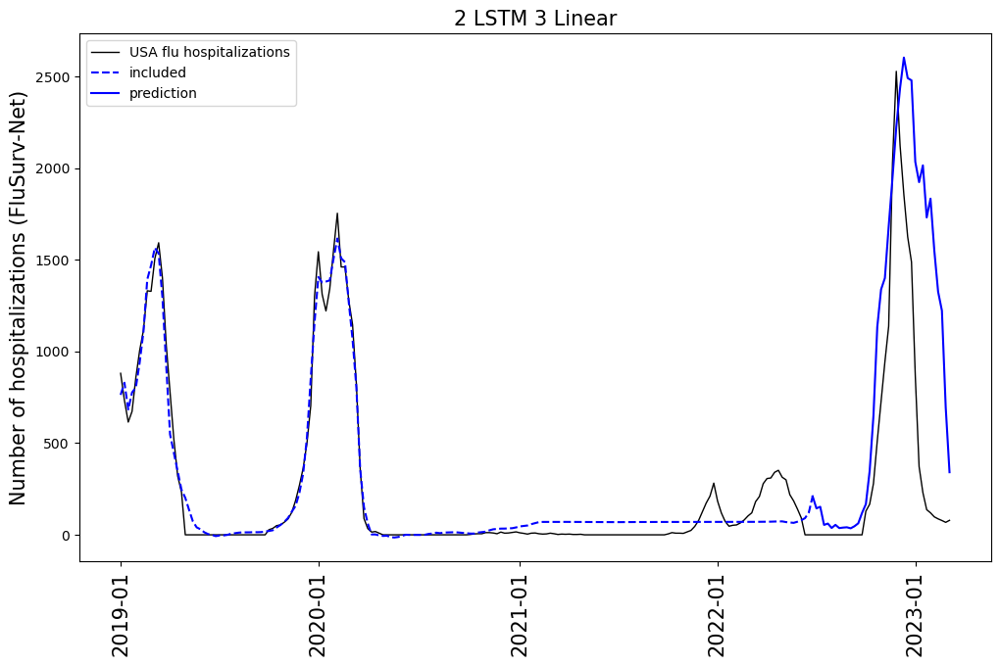

In [1738]:
model = gru_drop(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2019-01':'2023-10'],linewidth=1,label='USA flu hospitalizations',color='black')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2019-01':'2022-26'],linestyle="dashed",color='blue',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='blue',label='prediction')
plt.legend(loc='upper left')
x_ticks=['2019-01','2020-01','2021-01','2022-01','2023-01']

plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('2 LSTM 3 Linear',size =15)
plt.ylabel('Number of hospitalizations (FluSurv-Net)',size =15)

### 2019

In [1480]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru_drop_2019.pth
epoch 0 0 0
Train loss: 12.30472127613973 Val loss: 0.22839474752254318 Time: 0.67592169996351
epoch 1 0 0
Train loss: 11.640337135390382 Val loss: 0.2707759567510948 Time: 0.6600944000529125
epoch 2 1 0
Train loss: 11.240223795492057 Val loss: 0.3073548098182073 Time: 0.6079509999835864
epoch 3 2 0
Train loss: 11.523286946996578 Val loss: 0.2872189194240491 Time: 0.6091431999811903
epoch 4 0 1
Train loss: 10.915386406446032 Val loss: 0.2670289154339116 Time: 0.6093968000495806
epoch 5 0 0
Train loss: 10.024965285158373 Val loss: 0.23043309123022482 Time: 0.5983115999260917
epoch 6 0 0
Train loss: 7.71834452621674 Val loss: 0.23426877239717214 Time: 0.5834843000629917
epoch 7 1 0
Train loss: 6.2107336156709 Val loss: 0.33109977485446507 Time: 0.5996596000622958
epoch 8 2 0
Train loss: 5.683094920824686 Val loss: 0.396275405578308 Time: 0.6020451000658795
epoch 9 3 0
Train loss: 5.2716700000330246 Val loss: 0.4844331673

Text(0.5, 0, 'Date')

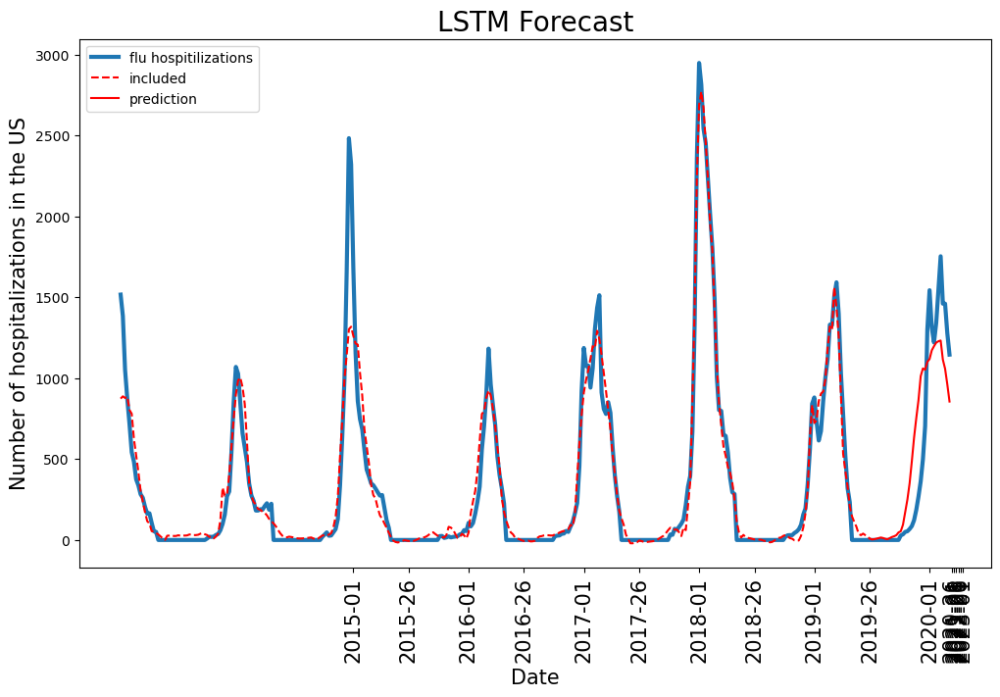

In [1481]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019 w usa

In [1627]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru_drop(26,9).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru_drop_2019_usa.pth
epoch 0 0 0
Train loss: 12.040891385705237 Val loss: 0.22517685059574433 Time: 0.6603798000141978
epoch 1 0 0
Train loss: 6.485429661082662 Val loss: 0.743718669982627 Time: 0.6278389999642968
epoch 2 1 0
Train loss: 6.2182911511043 Val loss: 0.062451183068333194 Time: 0.6415518999565393
epoch 3 0 0
Train loss: 5.061480469206446 Val loss: 0.6311286257841857 Time: 0.659965599887073
epoch 4 1 0
Train loss: 6.312170258626111 Val loss: 0.907384806941991 Time: 0.6666514000389725
epoch 5 2 1
Train loss: 5.102762030127963 Val loss: 0.4365629428066313 Time: 0.6776522998698056
epoch 6 0 2
Train loss: 3.8871618729564297 Val loss: 1.5406643139761043 Time: 0.6735318000428379
epoch 7 1 0
Train loss: 3.8699917708908504 Val loss: 0.8399092823039525 Time: 0.8445937999058515
epoch 8 0 0
Train loss: 3.9203581653327064 Val loss: 1.2157694149640292 Time: 0.8349911000113934
epoch 9 1 1
Train loss: 3.0581207521411384 Val loss: 0.6568389

Text(0.5, 0, 'Date')

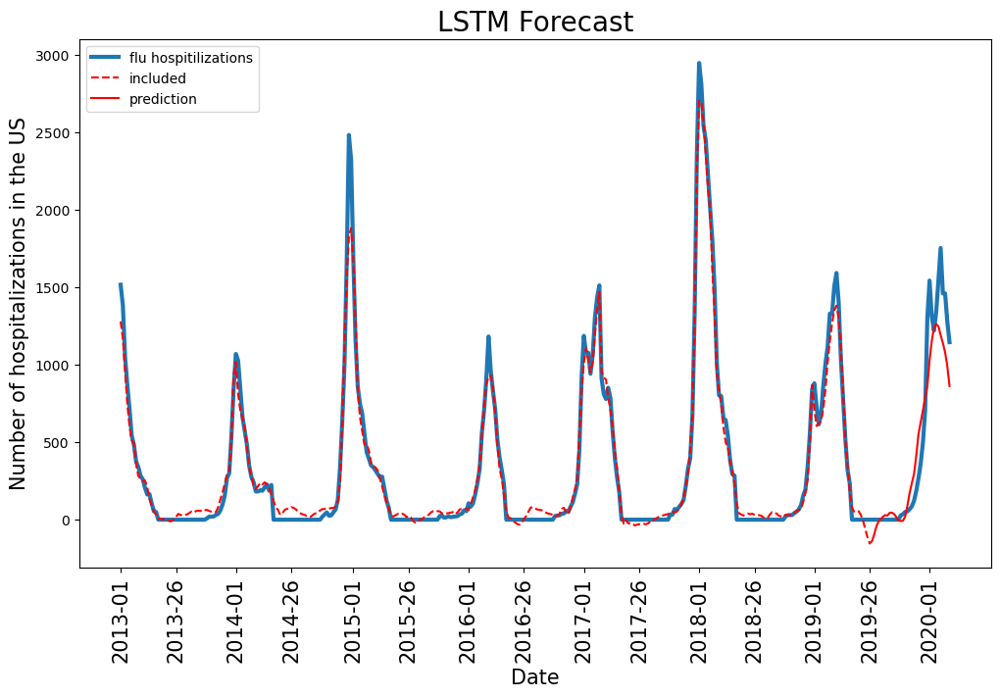

In [1628]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## LSTM drop

In [54]:
class lstm_drop(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(lstm_drop, self).__init__()
        
        self.lstm = nn.LSTM(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(seq_len*country_len,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )        
        
    def forward(self, x):
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1591]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_drop(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_drop.pth
epoch 0 0 0
Train loss: 15.837491336933383 Val loss: 1.123294652072218 Time: 1.0417035999707878
epoch 1 0 0
Train loss: 8.271350859749468 Val loss: 0.6925117940991186 Time: 1.3512095999903977
epoch 2 0 0
Train loss: 7.324006964918016 Val loss: 0.45452800777275115 Time: 0.8824382000602782
epoch 3 0 0
Train loss: 6.290487867975523 Val loss: 0.5198700437041772 Time: 0.8971759998239577
epoch 4 1 0
Train loss: 6.52326968911126 Val loss: 0.4012353832513327 Time: 0.9214963999111205
epoch 5 0 1
Train loss: 6.3462113028894365 Val loss: 0.6468694452732962 Time: 0.9211497001815587
epoch 6 1 2
Train loss: 6.088194085124751 Val loss: 0.4098679728285788 Time: 0.9174387999810278
epoch 7 0 0
Train loss: 4.88186805521223 Val loss: 0.43801579243154265 Time: 0.9327546998392791
epoch 8 1 0
Train loss: 5.501475039904319 Val loss: 0.26075047575267263 Time: 0.9548104999121279
epoch 9 0 1
Train loss: 4.860735699241609 Val loss: 0.1476728598929639

Text(0, 0.5, 'Number of hospitalizations (FluSurv-Net)')

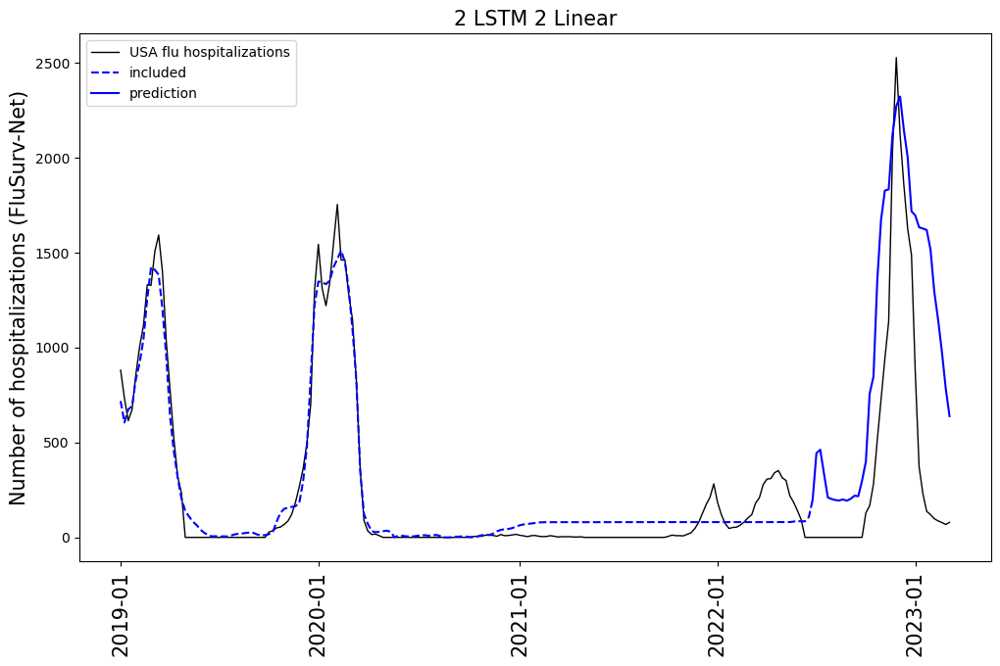

In [1735]:
model = lstm_drop(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2019-01':'2023-10'],linewidth=1,label='USA flu hospitalizations',color='black')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2019-01':'2022-26'],linestyle="dashed",color='blue',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='blue',label='prediction')
plt.legend(loc='upper left')
x_ticks=['2019-01','2020-01','2021-01','2022-01','2023-01']

plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('2 LSTM 2 Linear',size =15)
plt.ylabel('Number of hospitalizations (FluSurv-Net)',size =15)

### L1 Loss

In [1547]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_drop(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_l1loss.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.L1Loss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_drop_l1loss.pth
epoch 0 0 0
Train loss: 52.720754815032706 Val loss: 4.819423608481884 Time: 1.0158018998336047
epoch 1 0 0
Train loss: 48.08473049104214 Val loss: 4.790529064834118 Time: 1.0569424000568688
epoch 2 0 0
Train loss: 46.44327262112347 Val loss: 4.728207461535931 Time: 1.0849365000613034
epoch 3 0 0
Train loss: 42.74770466017071 Val loss: 4.3725940100848675 Time: 0.880707599921152
epoch 4 0 0
Train loss: 37.112329091411084 Val loss: 4.268055386841297 Time: 0.8646521000191569
epoch 5 0 0
Train loss: 35.53768518975994 Val loss: 4.029031675308943 Time: 0.9065334000624716
epoch 6 0 0
Train loss: 33.23574188771454 Val loss: 3.911574997007847 Time: 0.8857780999969691
epoch 7 0 0
Train loss: 31.56720171024017 Val loss: 3.680977798998356 Time: 0.9104993999935687
epoch 8 0 0
Train loss: 29.30484931623505 Val loss: 3.386815622448921 Time: 0.9822314998600632
epoch 9 0 0
Train loss: 28.148117345983337 Val loss: 3.375169273465872 T

Text(0.5, 0, 'Date')

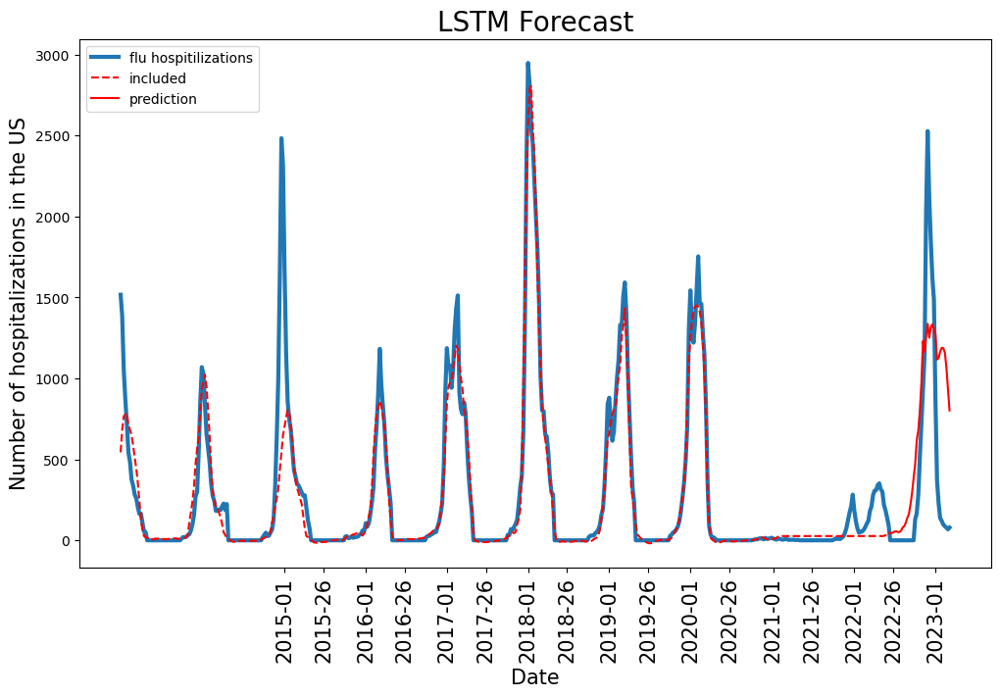

In [1548]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019

In [1473]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_drop_2019.pth
epoch 0 0 0
Train loss: 15.780853069372256 Val loss: 0.18155083183953025 Time: 0.7737454000161961
epoch 1 0 0
Train loss: 12.107174292530845 Val loss: 0.30844988982130417 Time: 0.7209588000550866
epoch 2 1 0
Train loss: 12.24978273670608 Val loss: 0.28376021568419674 Time: 0.6374291999964043
epoch 3 0 1
Train loss: 12.09608687887172 Val loss: 0.3017553385543579 Time: 0.6215672000544146
epoch 4 1 0
Train loss: 12.136051016498868 Val loss: 0.30191166570875794 Time: 0.6083315999712795
epoch 5 2 1
Train loss: 11.55880188258675 Val loss: 0.3332490464672446 Time: 0.6089159999974072
epoch 6 3 0
Train loss: 11.049235559412192 Val loss: 0.29615943937096745 Time: 0.6281498000025749
epoch 7 0 0
Train loss: 8.502000026249846 Val loss: 0.3296210332773626 Time: 0.5938114000018686
epoch 8 1 0
Train loss: 6.9655936685801265 Val loss: 0.6106927602323988 Time: 0.5807496999623254
epoch 9 2 0
Train loss: 5.8239507139526125 Val loss: 0.73

Text(0.5, 0, 'Date')

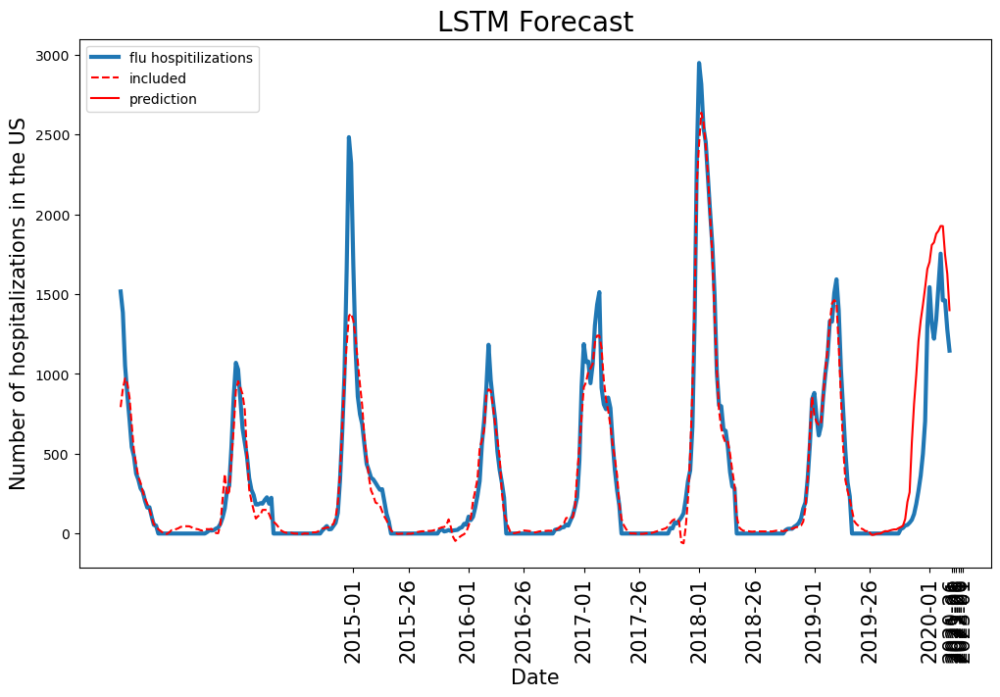

In [1474]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 22019 w usa

In [1629]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_drop(26,9).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_drop_2019_usa.pth
epoch 0 0 0
Train loss: 12.72791621381674 Val loss: 0.20248773894127226 Time: 0.899843699997291
epoch 1 0 0
Train loss: 11.634086159196954 Val loss: 0.25447776585497195 Time: 0.8320243998896331
epoch 2 1 0
Train loss: 11.502464198709212 Val loss: 0.2757268343311807 Time: 0.8762918000575155
epoch 3 2 0
Train loss: 11.634812446339595 Val loss: 0.2724060426708661 Time: 0.8779734000563622
epoch 4 0 1
Train loss: 11.461438758479176 Val loss: 0.2658010478662618 Time: 0.8510402000974864
epoch 5 0 0
Train loss: 10.985513533399875 Val loss: 0.21780777600361034 Time: 0.8804952001664788
epoch 6 0 0
Train loss: 9.65456282258117 Val loss: 0.17970495484769344 Time: 0.8436334000434726
epoch 7 0 0
Train loss: 7.492157312613276 Val loss: 0.17352007367173883 Time: 0.8675272997934371
epoch 8 0 0
Train loss: 6.267222442285629 Val loss: 0.24785109888762236 Time: 0.8738769001793116
epoch 9 1 0
Train loss: 6.135556786031206 Val loss: 0.

Text(0.5, 0, 'Date')

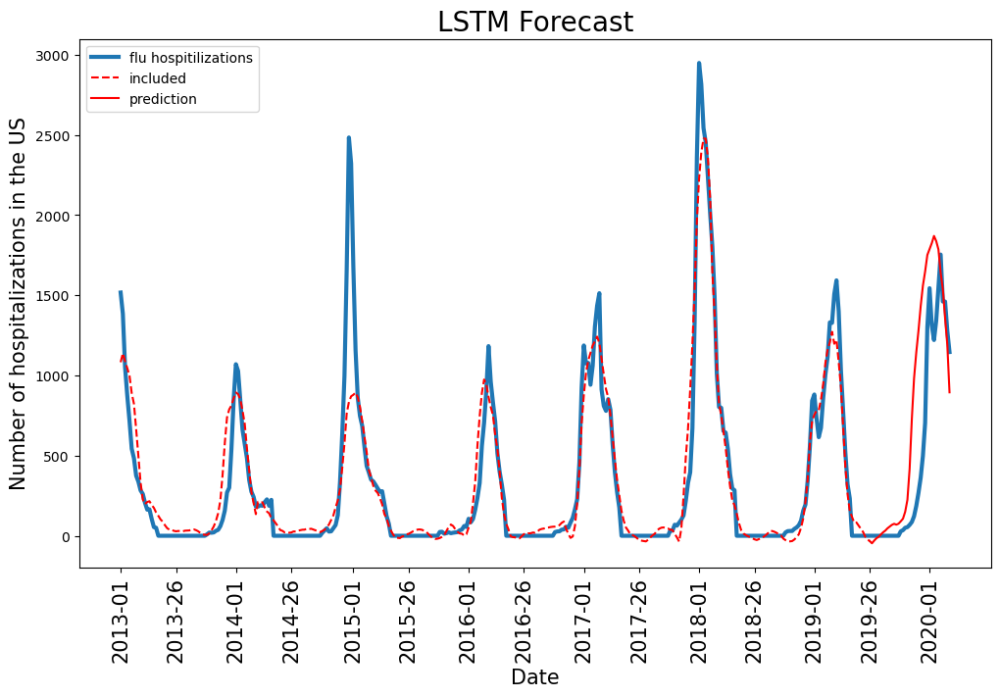

In [1630]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## LSTM 3 layer drop

In [55]:
class lstm_3lay_drop(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(lstm_3lay_drop, self).__init__()
        
        self.lstm = nn.LSTM(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(seq_len*country_len,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )        
        
    def forward(self, x):
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1363]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_3lay_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_3lay_drop.pth
epoch 0 0 0
Train loss: 14.286980177589648 Val loss: 2.137060955461493 Time: 1.2219123999821022
epoch 1 0 0
Train loss: 14.232019705056423 Val loss: 2.140559939580271 Time: 1.2552200000500306
epoch 2 1 0
Train loss: 14.251682670006716 Val loss: 2.1397219167592993 Time: 1.1823148999828845
epoch 3 0 1
Train loss: 14.214930622292096 Val loss: 2.145644561496738 Time: 1.204439099994488
epoch 4 1 0
Train loss: 14.215127620451312 Val loss: 2.1545658697432373 Time: 1.2483322999905795
epoch 5 2 1
Train loss: 14.172597959022369 Val loss: 2.1358777213335998 Time: 1.5099763999460265
epoch 6 0 0
Train loss: 14.242824809074236 Val loss: 2.1345204797689803 Time: 1.1761383999837562
epoch 7 0 1
Train loss: 14.222484604740032 Val loss: 2.135612825550197 Time: 1.2583503000205383
epoch 8 1 2
Train loss: 14.203544498626584 Val loss: 2.136596600739722 Time: 1.2269585999893025
epoch 9 2 3
Train loss: 14.098415685130476 Val loss: 2.207121316

Text(0.5, 0, 'Date')

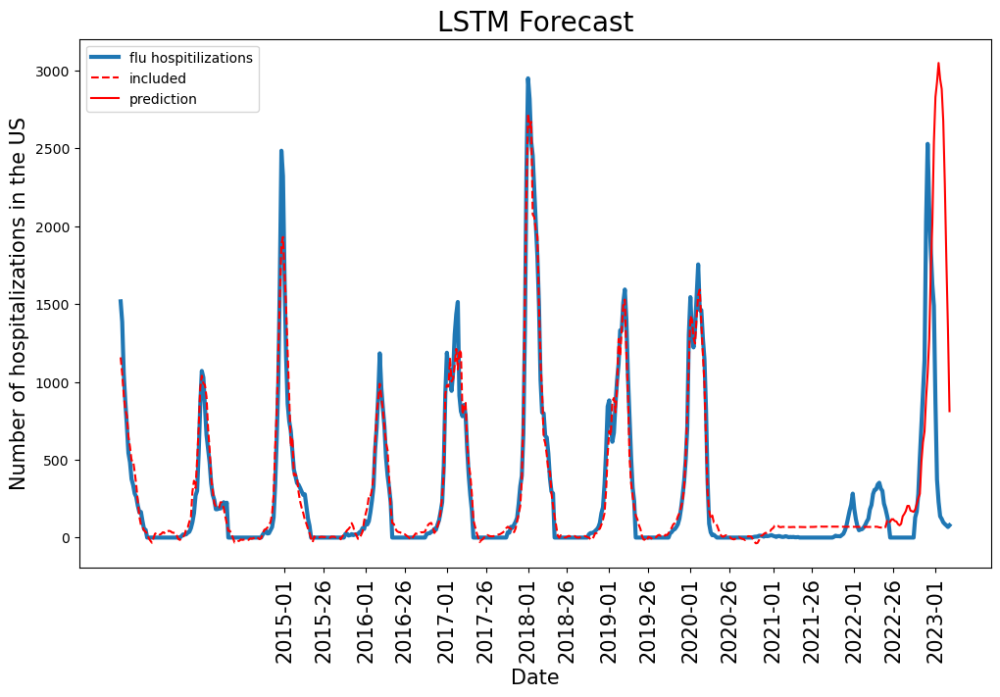

In [1364]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019

In [1475]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_3lay_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_3lay_drop_2019.pth
epoch 0 0 0
Train loss: 13.42293936912601 Val loss: 0.1786812484256899 Time: 0.9328579999273643
epoch 1 0 0
Train loss: 11.76301408272866 Val loss: 0.2557411052985117 Time: 0.7881834000581875
epoch 2 1 0
Train loss: 11.709871030424296 Val loss: 0.2697536519917776 Time: 0.7125001000240445
epoch 3 2 0
Train loss: 11.779719161735045 Val loss: 0.2800716698002361 Time: 0.7708801999688148
epoch 4 3 1
Train loss: 11.766815497011123 Val loss: 0.2681581329816254 Time: 0.7720760999945924
epoch 5 0 2
Train loss: 11.641198534667026 Val loss: 0.26787837208394194 Time: 0.7732947999611497
epoch 6 0 0
Train loss: 11.617207936662197 Val loss: 0.27120786285740905 Time: 0.8553996999980882
epoch 7 1 0
Train loss: 11.675532951436296 Val loss: 0.2688954699624446 Time: 1.1956739999586716
epoch 8 0 1
Train loss: 11.63659318660018 Val loss: 0.23679874457070582 Time: 1.7127086999826133
epoch 9 0 2
Train loss: 9.23233372832371 Val loss: 0.

Text(0.5, 0, 'Date')

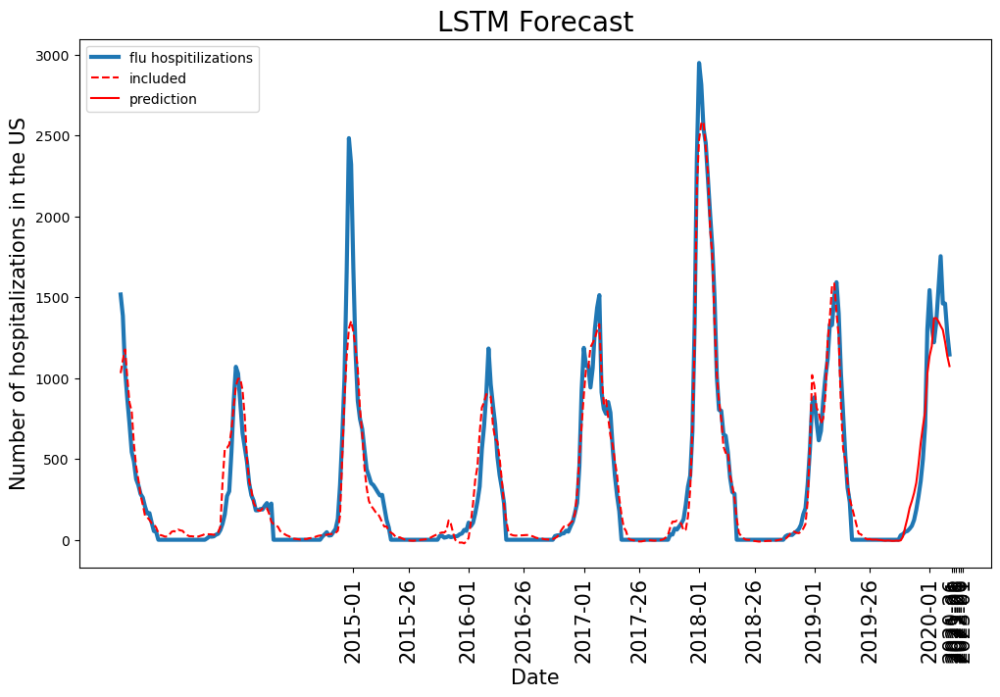

In [1476]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019 w usa

In [1633]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_3lay_drop(26,9).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_3lay_drop_2019_usa.pth
epoch 0 0 0
Train loss: 15.115306476071552 Val loss: 0.2087228902601055 Time: 0.9312301999889314
epoch 1 0 0
Train loss: 12.165986219252318 Val loss: 0.30598956894191076 Time: 0.8083321000449359
epoch 2 1 0
Train loss: 11.738927545229444 Val loss: 0.3403585840460437 Time: 0.7618746000807732
epoch 3 2 0
Train loss: 12.218336289587285 Val loss: 0.32523469307125197 Time: 0.7901951000094414
epoch 4 0 1
Train loss: 11.920625761289443 Val loss: 0.3295522501193773 Time: 0.7980714999139309
epoch 5 1 2
Train loss: 12.0576542985402 Val loss: 0.3131836890534032 Time: 0.7771733000408858
epoch 6 0 3
Train loss: 11.727029365770989 Val loss: 0.33276474522426724 Time: 0.7742102998308837
epoch 7 1 0
Train loss: 11.881191937795563 Val loss: 0.2993135915021412 Time: 0.7900392001029104
epoch 8 0 1
Train loss: 10.460228217120296 Val loss: 0.3133362662047148 Time: 0.7906098000239581
epoch 9 1 0
Train loss: 7.992065959475326 Val lo

Text(0.5, 0, 'Date')

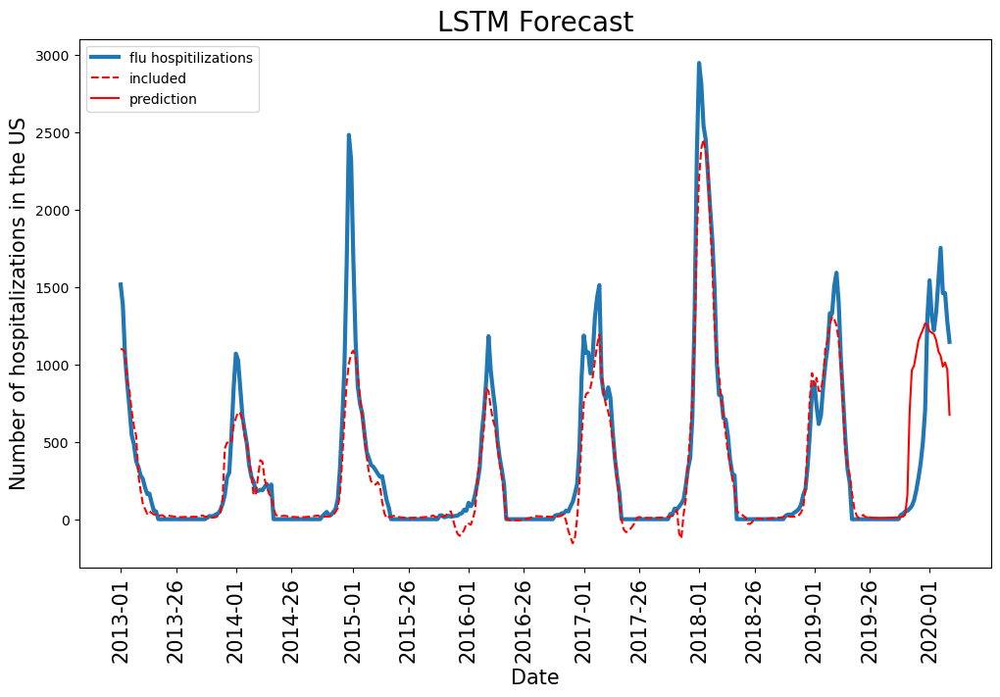

In [1634]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## LSTM Single drop

In [56]:
class lstm_single_drop(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(lstm_single_drop, self).__init__()
        
        self.lstm = nn.LSTM(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(156,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )        
        
    def forward(self, x):
        
        logits, _ = self.lstm(x.permute(0,2,1))
        
        
        logits = self.seq(logits)
        
        
        return logits

In [1368]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_single_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_single_drop.pth
epoch 0 0 0
Train loss: 13.626845790289853 Val loss: 2.0384798279992538 Time: 0.7498420999618247
epoch 1 0 0
Train loss: 11.715881022721138 Val loss: 1.853218739721342 Time: 0.6877983000595123
epoch 2 0 0
Train loss: 9.223272339502532 Val loss: 1.5226092738157604 Time: 0.657412700005807
epoch 3 0 0
Train loss: 7.4392881105872295 Val loss: 1.3138614294002764 Time: 0.619440000038594
epoch 4 0 0
Train loss: 6.603522390556044 Val loss: 1.1659184529416962 Time: 0.6347604000475258
epoch 5 0 0
Train loss: 5.988202428364746 Val loss: 1.0615182571636979 Time: 0.6530158999375999
epoch 6 0 0
Train loss: 5.4544133363326015 Val loss: 0.9649045160331298 Time: 0.669770700042136
epoch 7 0 0
Train loss: 5.010291455081131 Val loss: 0.887566396559123 Time: 0.6403671000152826
epoch 8 0 0
Train loss: 4.942208553705997 Val loss: 0.8280484443966998 Time: 0.6676704999990761
epoch 9 0 0
Train loss: 5.120859966609291 Val loss: 0.785871555191

Text(0.5, 0, 'Date')

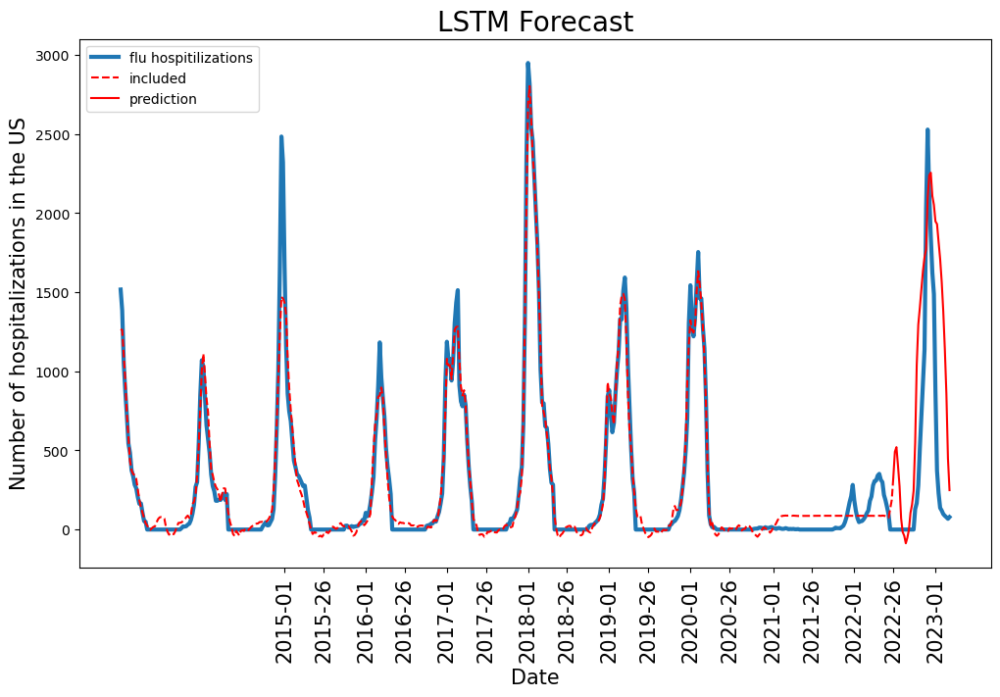

In [1369]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## GRU CNN stack drop

In [57]:
class gru_cnn_drop(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(gru_cnn_drop, self).__init__()
        
        
        self.convo = nn.Sequential(
           # nn.Flatten(start_dim =2, end_dim = -1),
            nn.ConstantPad1d(1,0),
            nn.Conv1d(seq_len,seq_len,kernel_size=3),
            nn.ReLU()
        )
        self.gru = nn.GRU(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(156,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )      
        
    def forward(self, x):

        
        
        logits, _ = self.gru(x.permute(0,2,1))
        logits = self.convo(logits.permute(0,2,1))
        #logits = self.enc(logits.permute(0,2,1))
        logits, _ = self.gru(logits.permute(0,2,1))
        
        logits = self.seq(logits)
        
        
        return logits

In [1376]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru_cnn_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru_cnn_drop.pth
epoch 0 0 0
Train loss: 19.54075131040036 Val loss: 2.2597534868718867 Time: 1.0724461000645533
epoch 1 0 0
Train loss: 14.35442739138253 Val loss: 2.096777760925761 Time: 1.2480631999205798
epoch 2 0 0
Train loss: 12.638193299121639 Val loss: 1.7409814094826288 Time: 0.9825563000049442
epoch 3 0 0
Train loss: 8.761195347126186 Val loss: 1.2006201018521097 Time: 0.973566300002858
epoch 4 0 0
Train loss: 6.99667708486136 Val loss: 1.1303791060927324 Time: 0.9606367000378668
epoch 5 0 0
Train loss: 6.363769699929114 Val loss: 1.1523013975820504 Time: 0.9395801000064239
epoch 6 1 0
Train loss: 6.288046440989165 Val loss: 1.1094069078244502 Time: 0.9539982000133023
epoch 7 0 0
Train loss: 6.797342694268217 Val loss: 1.0898055536672473 Time: 0.9367864999221638
epoch 8 0 1
Train loss: 6.099626895812848 Val loss: 1.096317132934928 Time: 0.9568319000536576
epoch 9 1 0
Train loss: 6.077870443010327 Val loss: 1.074490110971965 Ti

Text(0.5, 0, 'Date')

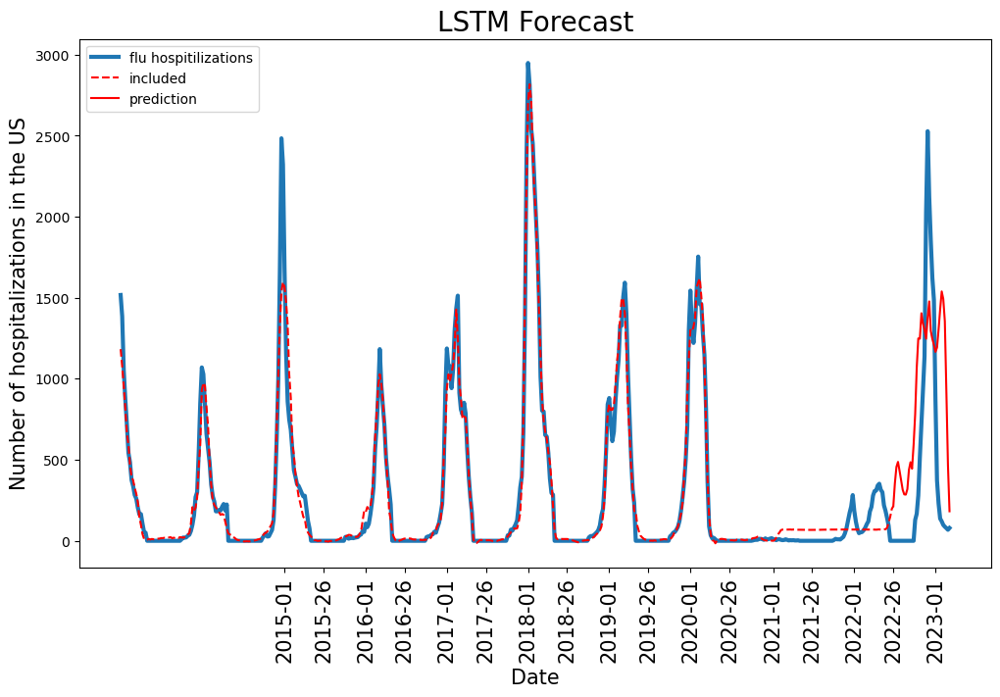

In [1377]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## LSTM CNN stack

In [58]:
class lstm_real_cnn_drop(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(lstm_real_cnn_drop, self).__init__()
        
        
        self.convo = nn.Sequential(
           # nn.Flatten(start_dim =2, end_dim = -1),
            nn.ConstantPad1d(1,0),
            nn.Conv1d(seq_len,seq_len,kernel_size=3),
            nn.ReLU()
        )
        self.lstm = nn.LSTM(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
           
            nn.Linear(156,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )      
        
    def forward(self, x):

        
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.convo(logits.permute(0,2,1))
        #logits = self.enc(logits.permute(0,2,1))
        logits, _ = self.lstm(logits.permute(0,2,1))
        
        logits = self.seq(logits)
        
        
        return logits

In [1380]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_real_cnn_drop(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_real_cnn_drop.pth
epoch 0 0 0
Train loss: 19.152815427236106 Val loss: 2.3301576151188783 Time: 1.0482829000102356
epoch 1 0 0
Train loss: 14.888420195727434 Val loss: 2.1722098881436978 Time: 1.2133907000534236
epoch 2 0 0
Train loss: 13.59560947270299 Val loss: 2.0030254245211836 Time: 1.1247618000488728
epoch 3 0 0
Train loss: 11.050740646704472 Val loss: 1.54279572784435 Time: 1.179772699950263
epoch 4 0 0
Train loss: 7.4088620223618005 Val loss: 1.3041773129662033 Time: 0.9708297000033781
epoch 5 0 0
Train loss: 6.755814331195477 Val loss: 1.3023459475953132 Time: 0.9465882000513375
epoch 6 0 0
Train loss: 6.650160035883307 Val loss: 1.288109127606731 Time: 0.9648841000162065
epoch 7 0 0
Train loss: 6.548867545201617 Val loss: 1.2476086715760175 Time: 0.9751635000575334
epoch 8 0 0
Train loss: 6.4766492973721785 Val loss: 1.2231100527278613 Time: 0.9799606000306085
epoch 9 0 0
Train loss: 7.129287925650526 Val loss: 1.20312753

Text(0.5, 0, 'Date')

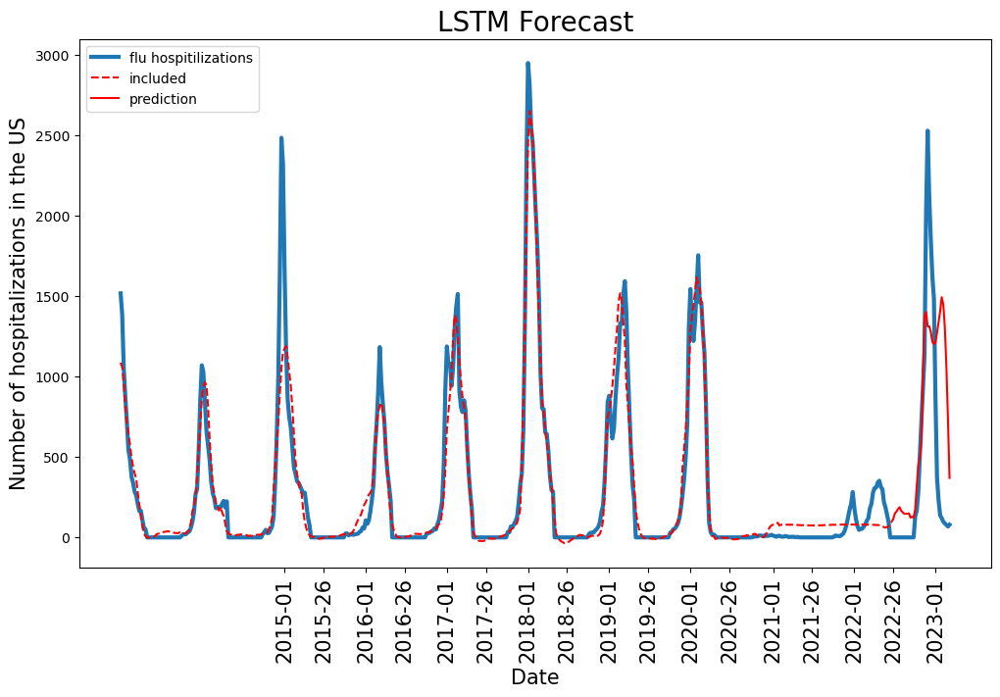

In [1381]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## LSTM

In [59]:
class lstm(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len):
        super(lstm, self).__init__()
        
        
        self.lstm = nn.LSTM(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
            nn.Dropout(0.01),
            nn.Linear(156,1)
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1444]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm.pth
epoch 0 0 0
Train loss: 19.50028508821666 Val loss: 2.4149836178903286 Time: 0.9450182999717072
epoch 1 0 0
Train loss: 14.622020095570079 Val loss: 2.2025312728073914 Time: 0.9806933000218123
epoch 2 0 0
Train loss: 14.2808727098693 Val loss: 2.1713117297331337 Time: 0.9781762999482453
epoch 3 0 0
Train loss: 14.045662205258138 Val loss: 2.1474479429307394 Time: 0.9703151000430807
epoch 4 0 0
Train loss: 12.851236965908583 Val loss: 1.937099497372401 Time: 0.9746941000921652
epoch 5 0 0
Train loss: 9.720250265465545 Val loss: 1.5130985800497 Time: 0.9783450999530032
epoch 6 0 0
Train loss: 7.398571004263569 Val loss: 1.3177203562227078 Time: 0.9779163999482989
epoch 7 0 0
Train loss: 6.706350215674046 Val loss: 1.224788781706593 Time: 0.9635381000116467
epoch 8 0 0
Train loss: 6.325276854324826 Val loss: 1.166787015805312 Time: 0.9620260999072343
epoch 9 0 0
Train loss: 6.073975973245652 Val loss: 1.1255761638908268 Time: 1.02

Text(0, 0.5, 'Number of hospitalizations (FluSurv-Net)')

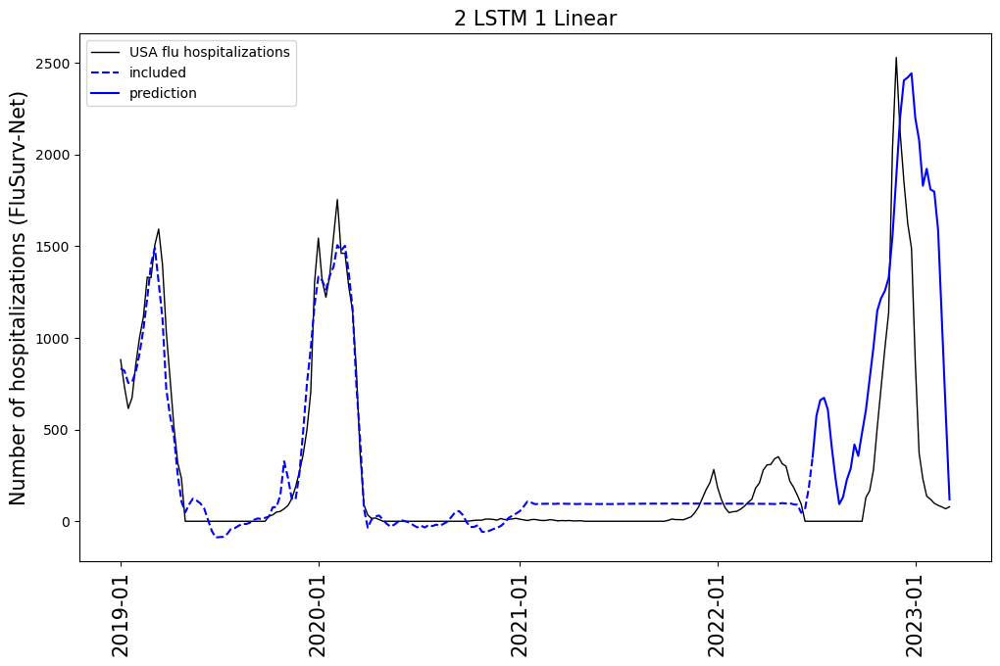

In [1734]:
model = lstm(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2019-01':'2023-10'],linewidth=1,label='USA flu hospitalizations',color='black')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2019-01':'2022-26'],linestyle="dashed",color='blue',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='blue',label='prediction')
plt.legend(loc='upper left')
x_ticks=['2019-01','2020-01','2021-01','2022-01','2023-01']

plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('2 LSTM 1 Linear',size =15)
plt.ylabel('Number of hospitalizations (FluSurv-Net)',size =15)

### 2019

In [1464]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm(26).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_2019.pth
epoch 0 0 0
Train loss: 17.528601671125443 Val loss: 0.08947776266904839 Time: 0.5481038000434637
epoch 1 0 0
Train loss: 11.852065990962842 Val loss: 0.2416488302851576 Time: 0.5538970999186859
epoch 2 1 0
Train loss: 11.28926624957262 Val loss: 0.29316815300262533 Time: 0.6155020000878721
epoch 3 2 0
Train loss: 10.859064095130407 Val loss: 0.28573840404715156 Time: 0.5752658999990672
epoch 4 0 0
Train loss: 9.88386664719684 Val loss: 0.27050742464052746 Time: 0.5575222000479698
epoch 5 0 0
Train loss: 8.027135254685845 Val loss: 0.3581181076588109 Time: 0.593059099977836
epoch 6 1 0
Train loss: 6.511615985752398 Val loss: 0.5709239358475315 Time: 0.5898096000310034
epoch 7 2 0
Train loss: 5.880311627252979 Val loss: 0.7392171765405378 Time: 0.5480224000057206
epoch 8 3 0
Train loss: 5.501151622746676 Val loss: 0.8685309483545893 Time: 0.5672191999619827
epoch 9 4 0
Train loss: 5.308175625239787 Val loss: 0.9678941839946

Text(0.5, 0, 'Date')

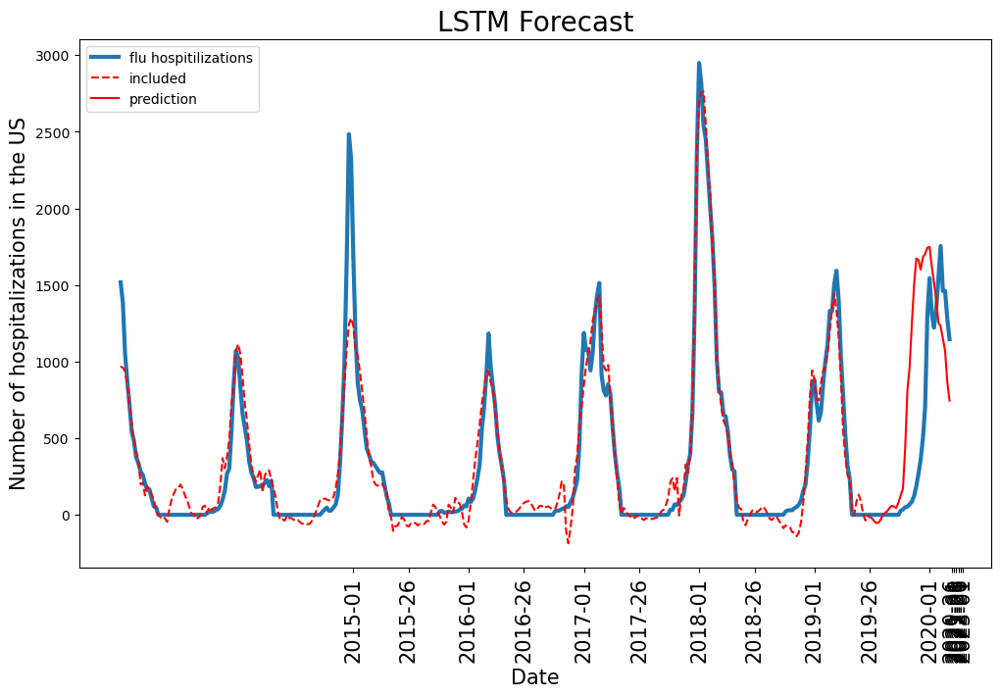

In [1465]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## LSTM 2lay

In [60]:
class lstm_2lay(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(lstm_2lay, self).__init__()
        
        
        self.lstm = nn.LSTM(seq_len,seq_len,num_layers = 2)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),
            nn.Dropout(0.01),
            nn.Linear(seq_len*country_len,1)
        )        
        
    def forward(self, x):

        #logits = self.convo(x).permute(0,2,1)
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1534]:
df_in = df_norm
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index).join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

(1227, 26, 6)
(1227,)


In [1537]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_2lay(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_2lay.pth
epoch 0 0 0
Train loss: 14.363968906728076 Val loss: 2.175392752600601 Time: 1.4209916000254452
epoch 1 0 0
Train loss: 14.283366206153033 Val loss: 2.160705892041733 Time: 1.249198299832642
epoch 2 0 0
Train loss: 14.249831816322029 Val loss: 2.155686545011122 Time: 1.264518199954182
epoch 3 0 0
Train loss: 14.251148144251019 Val loss: 2.1528461055422667 Time: 1.3351406999863684
epoch 4 0 1
Train loss: 14.23421470586996 Val loss: 2.1510528456274187 Time: 2.243442599894479
epoch 5 0 0
Train loss: 14.217455009290063 Val loss: 2.150119942074525 Time: 2.308285400038585
epoch 6 0 0
Train loss: 14.202693884095936 Val loss: 2.149231982890342 Time: 2.204181400127709
epoch 7 0 0
Train loss: 14.201995588064264 Val loss: 2.1480201610393124 Time: 2.0850311999674886
epoch 8 0 0
Train loss: 14.204759122291307 Val loss: 2.146798608962854 Time: 2.1887826998718083
epoch 9 0 1
Train loss: 14.197980051131971 Val loss: 2.1469622775439348 Tim

Text(0.5, 0, 'Date')

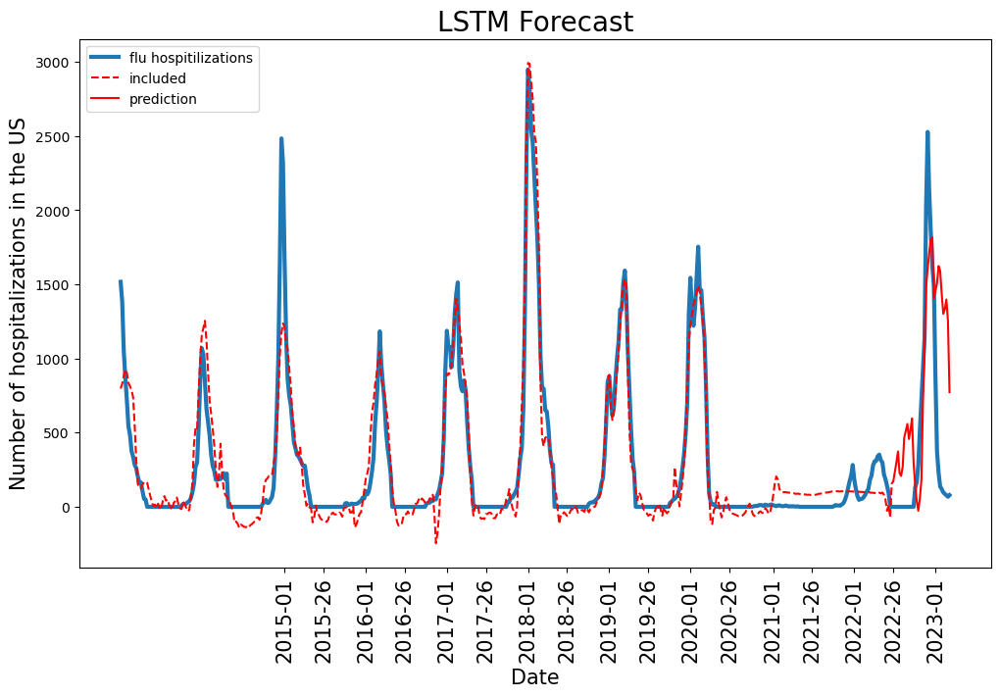

In [1538]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## LSTM diff stack

In [61]:
class lstm_drop_B(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(lstm_drop_B, self).__init__()
        
        self.lstm = nn.LSTM(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),

            nn.Linear(seq_len*country_len,seq_len*country_len),
            nn.Dropout(0.2),
            nn.ReLU(),
           
            nn.Linear(seq_len*country_len,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )        
        
    def forward(self, x):
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1550]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_drop_B(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_drop_B.pth
epoch 0 0 0
Train loss: 16.16770795326766 Val loss: 2.2759340583688754 Time: 1.457727399887517
epoch 1 0 0
Train loss: 14.881099277284605 Val loss: 2.2677526410261635 Time: 1.2500810001511127
epoch 2 0 0
Train loss: 14.517520890912731 Val loss: 2.344305501296276 Time: 1.2118739001452923
epoch 3 1 0
Train loss: 12.354157258441205 Val loss: 1.6847806248997585 Time: 1.1624668999575078
epoch 4 0 0
Train loss: 7.591584440547543 Val loss: 1.1979370938497595 Time: 1.2916391999460757
epoch 5 0 0
Train loss: 6.521783690073583 Val loss: 0.9977747265947983 Time: 1.475124099990353
epoch 6 0 0
Train loss: 5.917868960334553 Val loss: 1.0420926748411148 Time: 2.1017709001898766
epoch 7 1 0
Train loss: 5.659373770012451 Val loss: 1.02071712603356 Time: 1.1042590001598
epoch 8 0 0
Train loss: 5.459611532018045 Val loss: 1.130446491204566 Time: 1.2582574000116438
epoch 9 1 0
Train loss: 4.961983990073894 Val loss: 1.0681780289378366 Time:

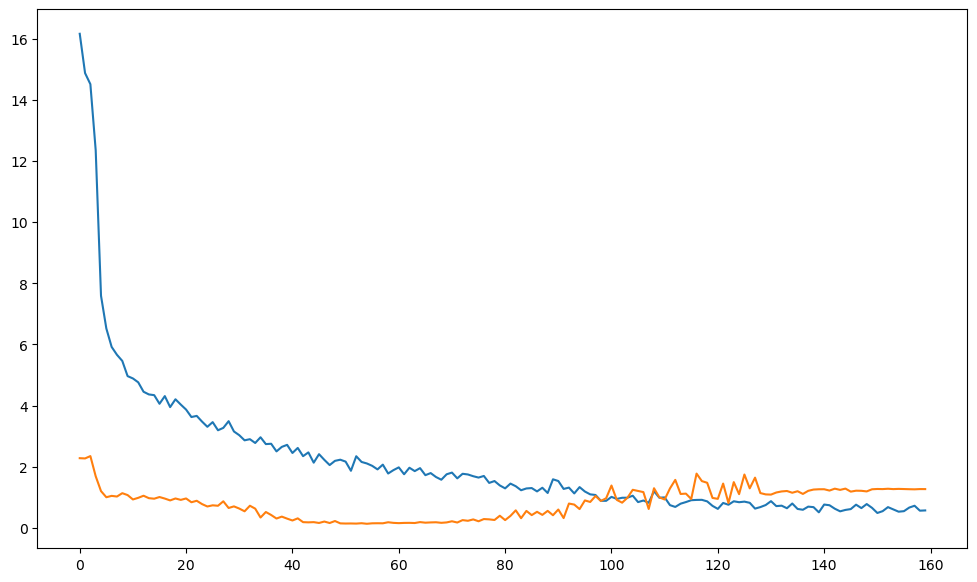

In [1552]:
plt.plot(loss_t)
plt.plot(loss_v)

Text(0, 0.5, 'Number of hospitalizations (FluSurv-Net)')

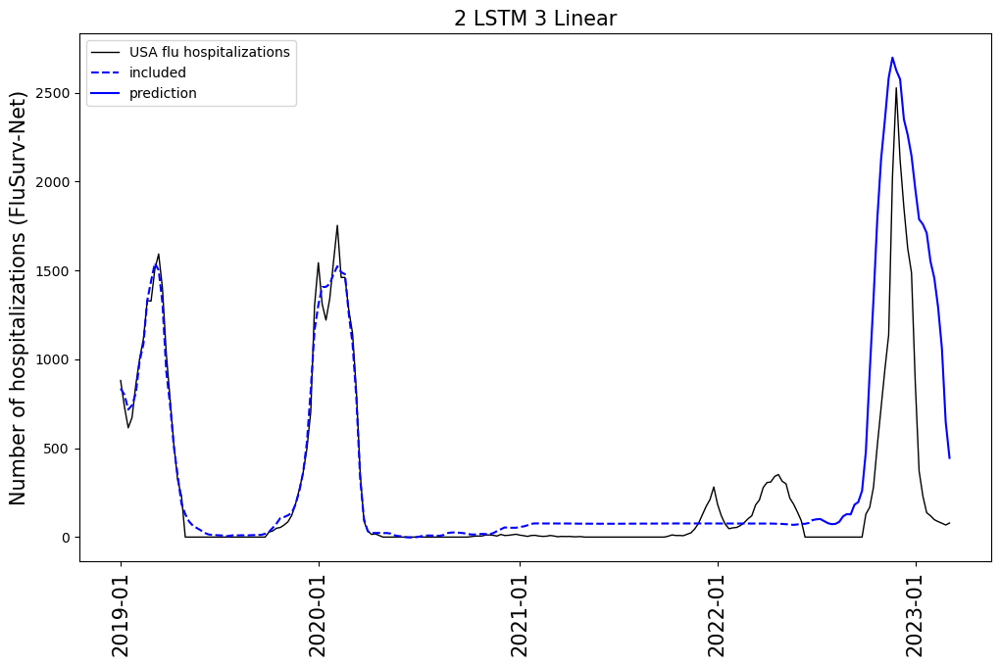

In [1729]:
model = lstm_drop_B(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2019-01':'2023-10'],linewidth=1,label='USA flu hospitalizations',color='black')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2019-01':'2022-26'],linestyle="dashed",color='blue',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='blue',label='prediction')
plt.legend(loc='upper left')
x_ticks=['2019-01','2020-01','2021-01','2022-01','2023-01']

plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('2 LSTM 3 Linear',size =15)
plt.ylabel('Number of hospitalizations (FluSurv-Net)',size =15)


### 2019

In [1559]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_drop_B(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_drop_B_2019.pth
epoch 0 0 0
Train loss: 12.293973752872574 Val loss: 0.2708483402384445 Time: 0.7800006999168545
epoch 1 0 0
Train loss: 11.71280751943641 Val loss: 0.30871417962379155 Time: 0.7292943000793457
epoch 2 1 0
Train loss: 11.733097239382573 Val loss: 0.3011465542701366 Time: 0.8740391000173986
epoch 3 0 1
Train loss: 11.71283771478307 Val loss: 0.2802353636116095 Time: 0.7676158999092877
epoch 4 0 2
Train loss: 10.976033036923786 Val loss: 0.213937992868523 Time: 0.8624038998968899
epoch 5 0 0
Train loss: 8.295904796987667 Val loss: 0.18135130692962775 Time: 0.922327300067991
epoch 6 0 0
Train loss: 6.428502603912548 Val loss: 0.31760844595260096 Time: 0.7432089999783784
epoch 7 1 0
Train loss: 5.156978321439419 Val loss: 0.37836940858051094 Time: 0.7469260999932885
epoch 8 2 0
Train loss: 4.8029602011185055 Val loss: 0.4114197293622759 Time: 0.7719755000434816
epoch 9 3 0
Train loss: 4.267553558029171 Val loss: 0.49456

Text(0.5, 0, 'Date')

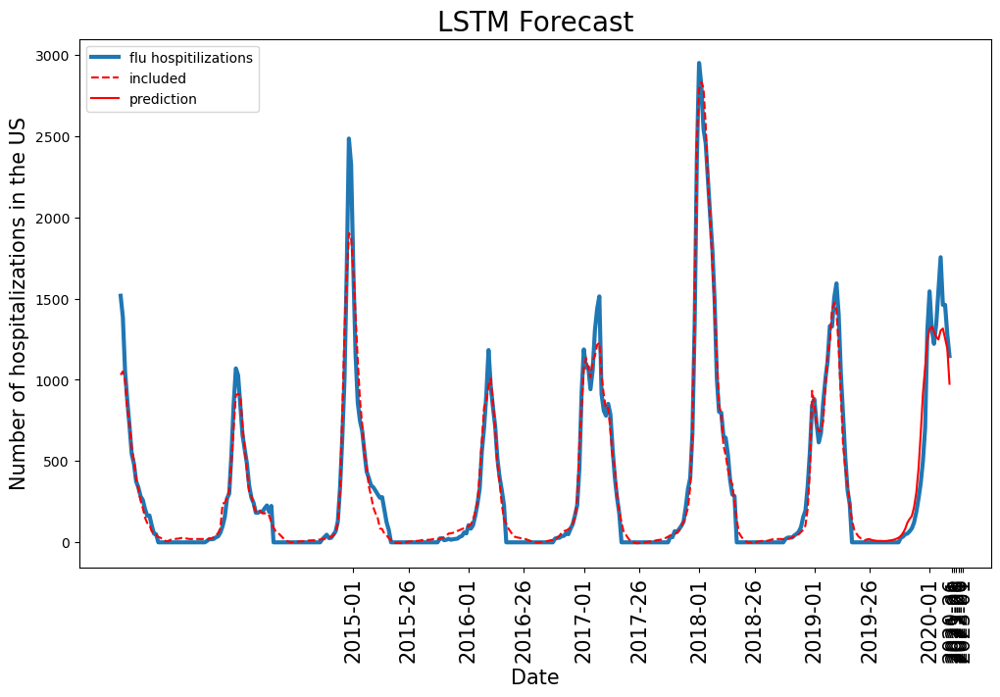

In [1560]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019 w usa

In [1635]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = lstm_drop_B(26,9).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\lstm_drop_B_2019_usa.pth
epoch 0 0 0
Train loss: 11.651116903958723 Val loss: 0.2722552620944043 Time: 0.8765360000543296
epoch 1 0 0
Train loss: 11.539052673680544 Val loss: 0.27177123735600617 Time: 0.8538930998183787
epoch 2 0 0
Train loss: 11.45380028765625 Val loss: 0.27632780733620166 Time: 0.8379248999990523
epoch 3 1 0
Train loss: 11.517716271319841 Val loss: 0.26793186529539526 Time: 0.8205267998855561
epoch 4 0 1
Train loss: 11.467203925662034 Val loss: 0.2733929384885414 Time: 0.8513122999574989
epoch 5 1 2
Train loss: 11.47006077248318 Val loss: 0.27252588696683233 Time: 0.8426287998445332
epoch 6 0 3
Train loss: 11.259273154759512 Val loss: 0.24946323096628475 Time: 0.8221047997940332
epoch 7 0 0
Train loss: 9.736206370260334 Val loss: 0.11794752814967069 Time: 0.807726499857381
epoch 8 0 0
Train loss: 7.034552896384756 Val loss: 0.26977285522031025 Time: 0.8218576000072062
epoch 9 1 0
Train loss: 6.308194851728366 Val loss

Text(0.5, 0, 'Date')

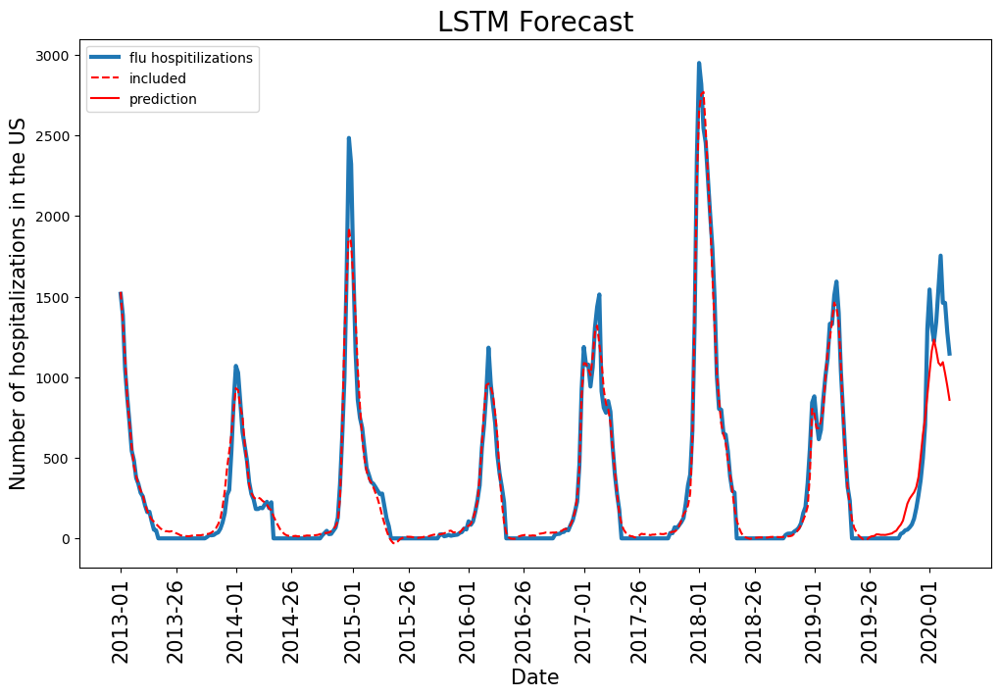

In [1636]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## RNN diff stack

In [62]:
class rnn_drop_B(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(rnn_drop_B, self).__init__()
        
        self.lstm = nn.RNN(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),

            nn.Linear(seq_len*country_len,seq_len*country_len),
            nn.Dropout(0.2),
            nn.ReLU(),
           
            nn.Linear(seq_len*country_len,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )        
        
    def forward(self, x):
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1554]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn_drop_B(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn_drop_B.pth
epoch 0 0 0
Train loss: 14.547079439830583 Val loss: 2.2753841355443 Time: 1.1738331001251936
epoch 1 0 0
Train loss: 13.626665345412576 Val loss: 2.240542336459839 Time: 1.0702327999752015
epoch 2 0 0
Train loss: 10.192182049426842 Val loss: 1.3413920560851693 Time: 0.9489650998730212
epoch 3 0 0
Train loss: 6.956240770113154 Val loss: 1.0857168862130493 Time: 0.963306900113821
epoch 4 0 0
Train loss: 5.87916808951778 Val loss: 1.0666233155898226 Time: 0.9840737998019904
epoch 5 0 0
Train loss: 5.390871325803378 Val loss: 1.0158377912957803 Time: 0.9811332998797297
epoch 6 0 0
Train loss: 5.116711094636681 Val loss: 1.1761879969835718 Time: 0.9655186999589205
epoch 7 1 0
Train loss: 4.932106830394504 Val loss: 1.0340282027109424 Time: 1.0010317999403924
epoch 8 0 0
Train loss: 4.548803958432565 Val loss: 1.1503010541464391 Time: 0.9961502999067307
epoch 9 1 0
Train loss: 4.177765363360805 Val loss: 1.0874184673756417 Tim

Text(0.5, 0, 'Date')

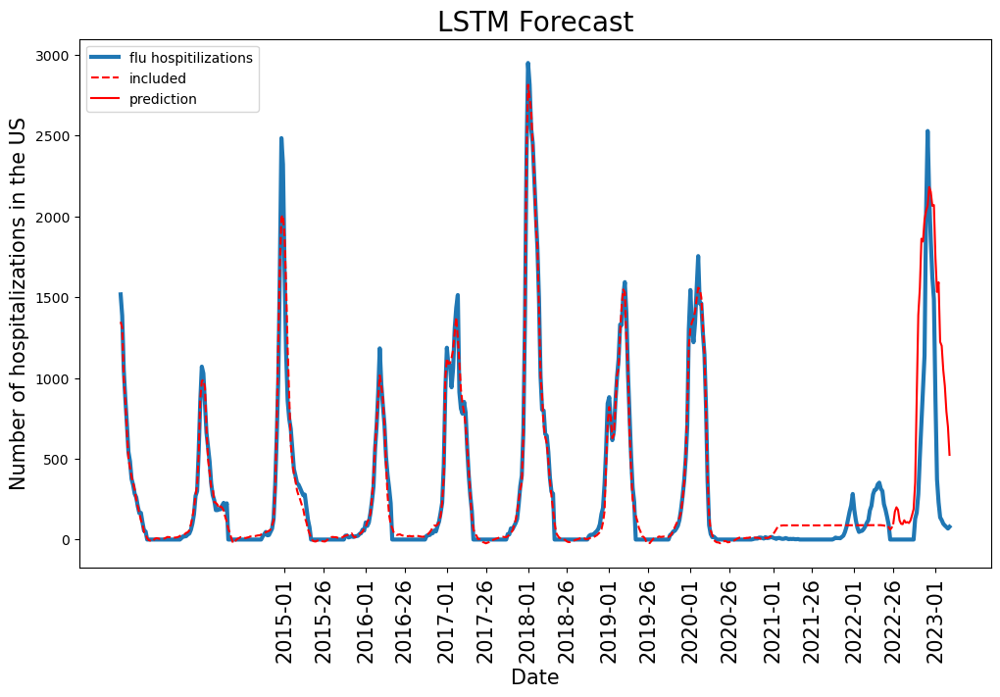

In [1555]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2023-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2022-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019

In [1565]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn_drop_B(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn_drop_B_2019.pth
epoch 0 0 0
Train loss: 11.784587826522 Val loss: 0.2773314730251002 Time: 0.658373000100255
epoch 1 0 0
Train loss: 11.410865753384783 Val loss: 0.23637990941642784 Time: 0.8765940999146551
epoch 2 0 0
Train loss: 9.208798969753985 Val loss: 0.09496586490736547 Time: 0.6271540999878198
epoch 3 0 0
Train loss: 6.838410223879119 Val loss: 0.2214842331353387 Time: 0.6395165999419987
epoch 4 1 0
Train loss: 5.970224982391855 Val loss: 0.25456905375898486 Time: 0.6379841000307351
epoch 5 2 0
Train loss: 5.208987722720423 Val loss: 0.29853199697117816 Time: 0.6928037998732179
epoch 6 3 0
Train loss: 5.102972257866313 Val loss: 0.3462140289257606 Time: 0.7066810000687838
epoch 7 4 0
Train loss: 4.625840940186709 Val loss: 0.3681554549357635 Time: 0.6555905998684466
epoch 8 5 0
Train loss: 4.579864320038324 Val loss: 0.39432394636060053 Time: 0.655080399941653
epoch 9 6 0
Train loss: 4.2701360840684615 Val loss: 0.488592455

Text(0.5, 0, 'Date')

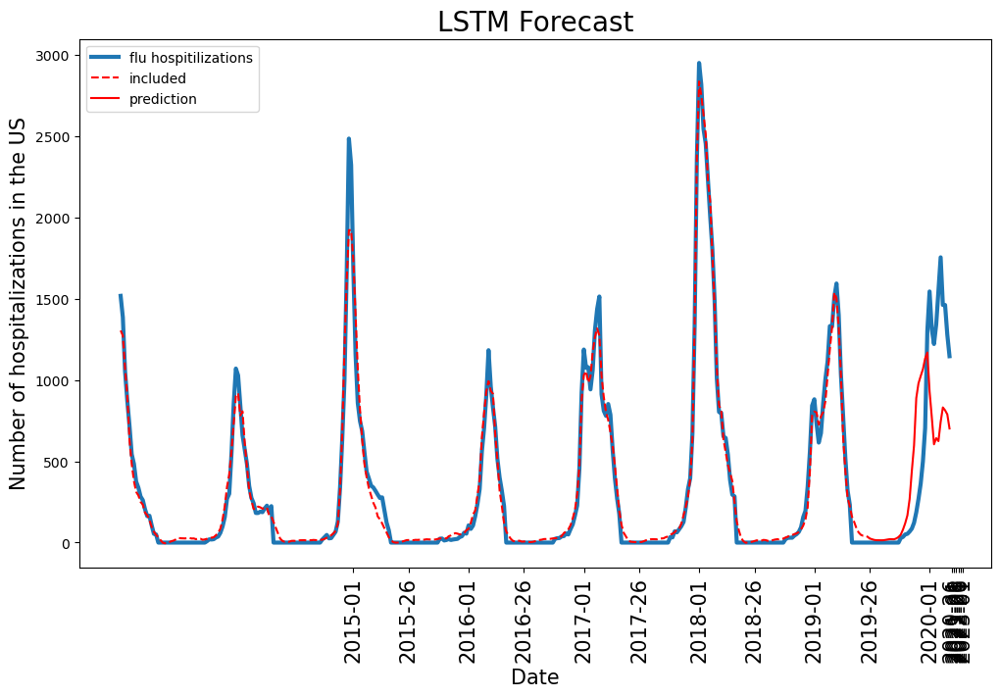

In [1566]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019 w usa

In [1637]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = rnn_drop_B(26,9).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\rnn_drop_B_2019_usa.pth
epoch 0 0 0
Train loss: 14.071254823003343 Val loss: 0.370015856315149 Time: 0.7590169999748468
epoch 1 0 0
Train loss: 11.664831764300198 Val loss: 0.33975725431810133 Time: 0.7410086002200842
epoch 2 0 0
Train loss: 9.279093453029681 Val loss: 0.2192645044560777 Time: 0.7105634000618011
epoch 3 0 0
Train loss: 6.897976731826498 Val loss: 0.2986561876605265 Time: 0.7040782999247313
epoch 4 1 0
Train loss: 6.291315695711832 Val loss: 0.5108692498470191 Time: 0.6986005001235753
epoch 5 2 0
Train loss: 5.567097257266724 Val loss: 0.7482333199973255 Time: 0.7222077001351863
epoch 6 3 0
Train loss: 5.032247118103641 Val loss: 1.0486477371368892 Time: 0.7863952999468893
epoch 7 4 0
Train loss: 4.502693944879746 Val loss: 1.0640461915245396 Time: 0.7471140001434833
epoch 8 5 0
Train loss: 4.432691156367652 Val loss: 1.7936321161084265 Time: 0.7497209999710321
epoch 9 6 0
Train loss: 3.6771086649190456 Val loss: 2.08865

Text(0.5, 0, 'Date')

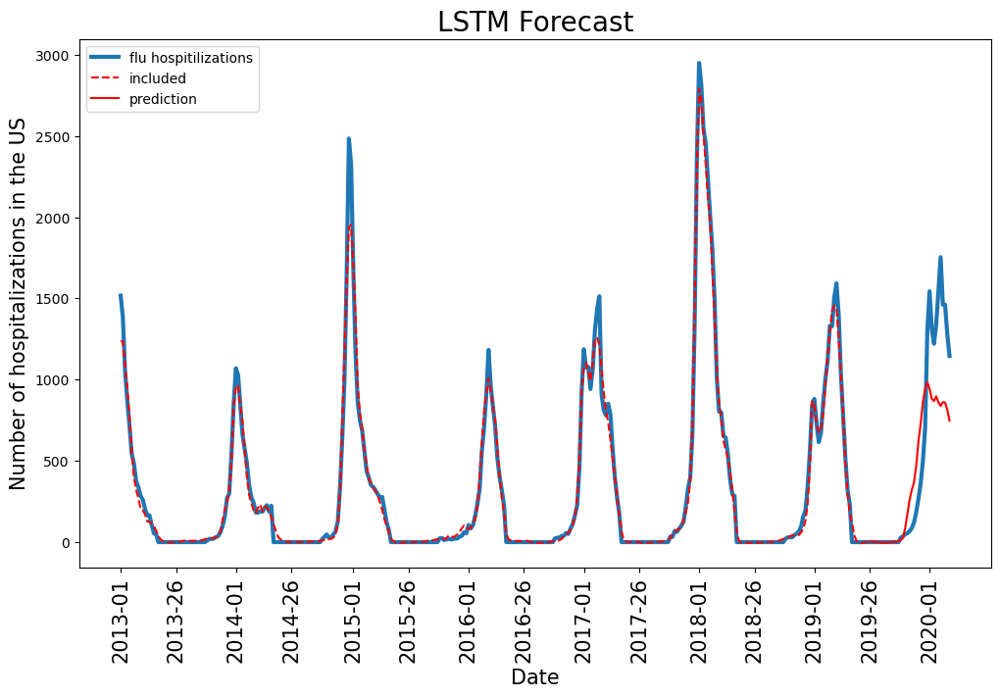

In [1638]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

## GRU diff stack

In [63]:
class gru_drop_B(nn.Module):
    
    # input shape [time,everything,seq]
    
    def __init__(self,seq_len,country_len):
        super(gru_drop_B, self).__init__()
        
        self.lstm = nn.GRU(seq_len,seq_len,num_layers = 1)

        self.enc = nn.Sequential(
        nn.ReLU(),
        nn.Linear(seq_len,seq_len)

       )

        self.seq = nn.Sequential( 
            nn.Flatten(),
            nn.ReLU(),

            nn.Linear(seq_len*country_len,seq_len*country_len),
            nn.Dropout(0.2),
            nn.ReLU(),
           
            nn.Linear(seq_len*country_len,50),
            nn.Dropout(0.2),
            nn.ReLU(),
            nn.Linear(50,1)
        )        
        
    def forward(self, x):
        
        logits, _ = self.lstm(x.permute(0,2,1))
        logits = self.enc(logits)
        logits, _ = self.lstm(logits)
        
        logits = self.seq(logits)
        
        
        return logits

In [1557]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru_drop_B(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2022-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru_drop_B.pth
epoch 0 0 0
Train loss: 15.139793556005301 Val loss: 2.2292365625180537 Time: 1.2627576000522822
epoch 1 0 0
Train loss: 14.366628299220224 Val loss: 2.196917652647244 Time: 1.3148918999359012
epoch 2 0 0
Train loss: 13.465650166248906 Val loss: 2.090105202878476 Time: 1.2406041000504047
epoch 3 0 0
Train loss: 9.213832603364565 Val loss: 1.2065305564319715 Time: 1.3082772998604923
epoch 4 0 0
Train loss: 6.5317313727233834 Val loss: 0.9876896464265883 Time: 1.1612430999521166
epoch 5 0 0
Train loss: 5.819642660830219 Val loss: 0.930407643027138 Time: 1.0911286999471486
epoch 6 0 0
Train loss: 5.564099631982013 Val loss: 0.9711096571845701 Time: 1.3315384001471102
epoch 7 1 0
Train loss: 5.873561608274159 Val loss: 1.000122079407447 Time: 1.2503585000522435
epoch 8 2 1
Train loss: 5.2160705409315575 Val loss: 0.9682824501942378 Time: 1.284913299838081
epoch 9 0 0
Train loss: 4.9404044918766 Val loss: 0.9548002224692027 Ti

Text(0, 0.5, 'Number of hospitalizations (FluSurv-Net)')

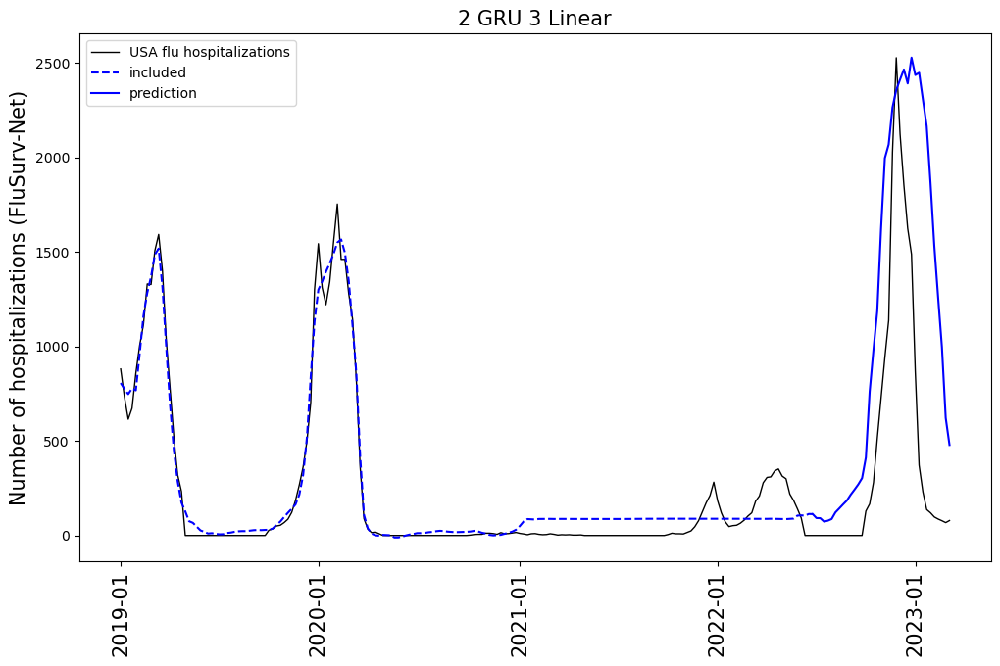

In [1730]:
model = gru_drop_B(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2019-01':'2023-10'],linewidth=1,label='USA flu hospitalizations',color='black')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2019-01':'2022-26'],linestyle="dashed",color='blue',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='blue',label='prediction')
plt.legend(loc='upper left')
x_ticks=['2019-01','2020-01','2021-01','2022-01','2023-01']

plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('2 GRU 3 Linear',size =15)
plt.ylabel('Number of hospitalizations (FluSurv-Net)',size =15)

### 2019

In [1563]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru_drop_B(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-4
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru_drop_B_2019.pth
epoch 0 0 0
Train loss: 12.111394558414304 Val loss: 0.2434174078371143 Time: 0.7713679999578744
epoch 1 0 0
Train loss: 11.598870298010517 Val loss: 0.2701049441784562 Time: 0.8129225999582559
epoch 2 1 0
Train loss: 11.592809397934317 Val loss: 0.2725258139307698 Time: 0.7337451002094895
epoch 3 2 0
Train loss: 11.490140310800342 Val loss: 0.2584621466965018 Time: 0.7692261999472976
epoch 4 0 0
Train loss: 11.121182171687288 Val loss: 0.23428753082407638 Time: 0.8082242000382394
epoch 5 0 0
Train loss: 9.168849422585339 Val loss: 0.16093666997403488 Time: 0.7662410999182612
epoch 6 0 0
Train loss: 6.520023469284958 Val loss: 0.4050934146970917 Time: 0.7638783000875264
epoch 7 1 0
Train loss: 5.190465948487088 Val loss: 0.5502591570370896 Time: 0.7886427000630647
epoch 8 2 0
Train loss: 5.1395150918779535 Val loss: 0.7118350132471254 Time: 0.7798631000332534
epoch 9 3 0
Train loss: 4.193460624115318 Val loss: 0.8843

Text(0.5, 0, 'Date')

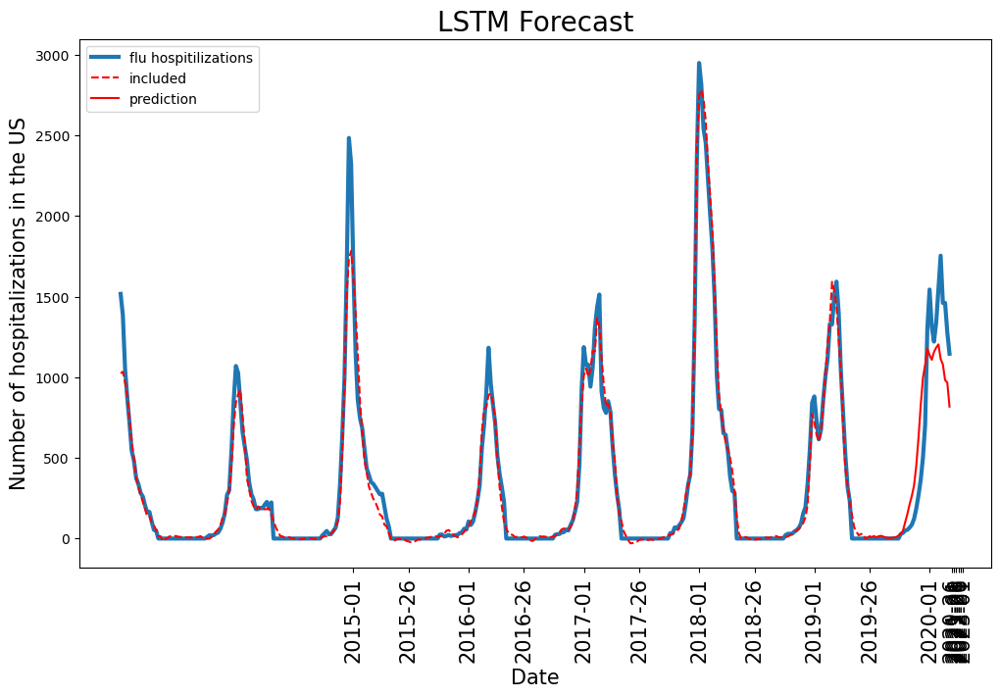

In [1564]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

### 2019 w usa

In [1641]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = gru_drop_B(26,9).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019_usa.pth'
print(PATH)
#model.load_state_dict(torch.load(PATH))

loss_fn = nn.MSELoss()
batched_sequence = data_in
learn_rate = 1e-3
num_epochs = 250
kill = num_epochs
batch_size_ = 1
t_beg = index.index('2013-01')
t_end = index.index('2019-26')
noise = False
forecast = 26

torch.manual_seed(5)

loss_t,loss_v = train_model(PATH,model,device,loss_fn,batched_sequence,learn_rate,num_epochs,kill,batch_size_,t_beg,t_end,noise,forecast)

C:\Users\christopher.johnson\Documents\GitHub\flu\gru_drop_B_2019_usa.pth
epoch 0 0 0
Train loss: 13.81041891625133 Val loss: 0.40819925570394844 Time: 1.156371399993077
epoch 1 0 0
Train loss: 7.443347573194156 Val loss: 2.4346568517036644 Time: 1.1644025000277907
epoch 2 1 0
Train loss: 6.200618354385433 Val loss: 0.11374854772202525 Time: 1.127109199995175
epoch 3 0 0
Train loss: 5.3889661921096845 Val loss: 0.15774487825193972 Time: 1.140812600031495
epoch 4 1 0
Train loss: 5.255040533496482 Val loss: 0.2553329679649323 Time: 1.0150335999205709
epoch 5 2 0
Train loss: 6.244028928362347 Val loss: 0.3472726600593887 Time: 1.2658400000073016
epoch 6 3 1
Train loss: 5.6415704075260695 Val loss: 1.2551740597041885 Time: 1.1743491000961512
epoch 7 4 2
Train loss: 4.092449815772538 Val loss: 0.8843190888146637 Time: 1.2697173999622464
epoch 8 0 0
Train loss: 3.734857916381106 Val loss: 0.37722191360080615 Time: 1.1907605999149382
epoch 9 0 0
Train loss: 3.111570685485077 Val loss: 0.42023

Text(0.5, 0, 'Date')

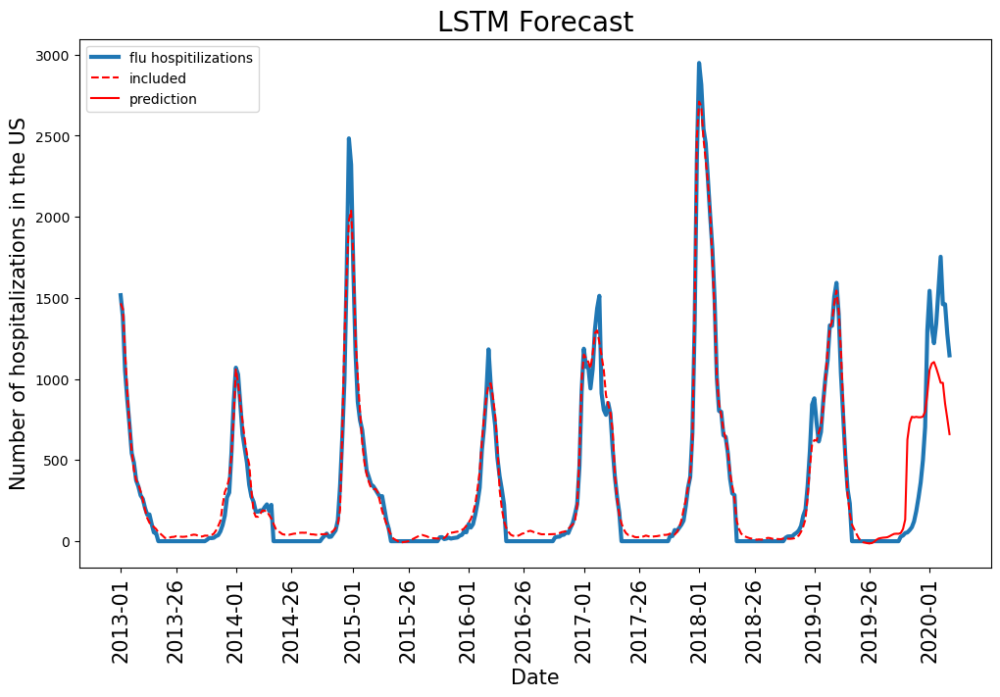

In [1642]:
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2013-01':'2019-26'],linestyle="dashed",color='red',label='included')
plt.plot(max_*plot_df["pred"].loc['2019-26':'2020-10'],color='red',label='prediction')
plt.legend(loc='upper left')
plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('LSTM Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US',size =15)
plt.xlabel('Date',size=15)

# Summary

In [3]:
batched_sequence

NameError: name 'batched_sequence' is not defined

Text(0, 0.5, 'Number of hospitalizations (FluSurv-Net)')

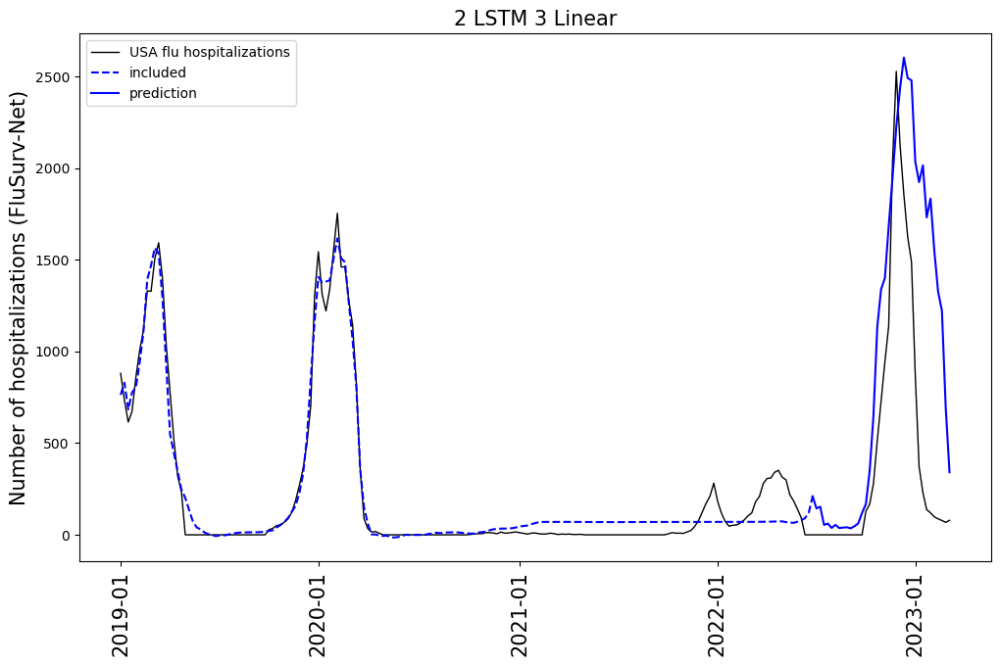

In [114]:
model = gru_drop(26,6).to(device)
PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
MODEL_PATH = PATH[:-4]+"_train.pth"
pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

plot_df = usa_infall_norm.copy()
plot_df["pred"] = pred

plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2019-01':'2023-10'],linewidth=1,label='USA flu hospitalizations',color='black')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df["pred"].loc['2019-01':'2022-26'],linestyle="dashed",color='blue',label='included')
plt.plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='blue',label='prediction')
plt.legend(loc='upper left')
x_ticks=['2019-01','2020-01','2021-01','2022-01','2023-01']

plt.xticks(ticks = x_ticks,rotation=90,size=15)
plt.title('2 LSTM 3 Linear',size =15)
plt.ylabel('Number of hospitalizations (FluSurv-Net)',size =15)

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batched_sequence = data_in
max_ = usa_infall.max()


NameError: name 'data_in' is not defined

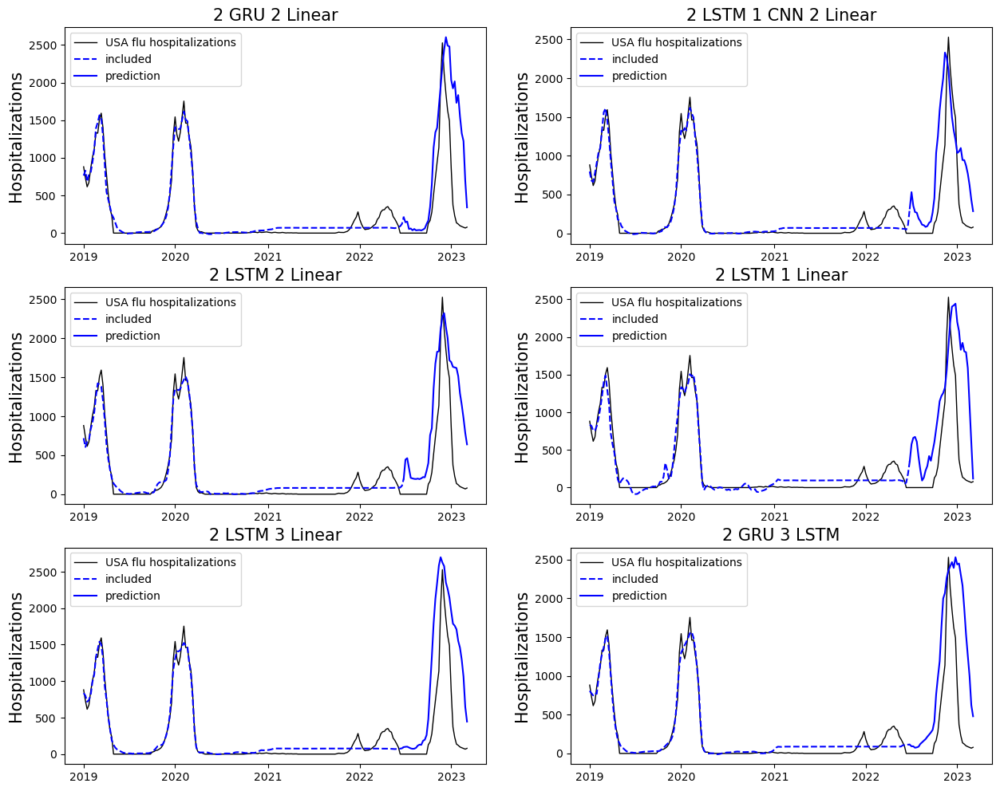

In [115]:
fig, ax = plt.subplots(3,2,figsize=(15,12))
model_list = [gru_drop(26,6),lstm_cnn_drop(26,6), lstm_drop(26,6),lstm(26),lstm_drop_B(26,6),gru_drop_B(26,6)]
model_names = ['2 GRU 2 Linear','2 LSTM 1 CNN 2 Linear','2 LSTM 2 Linear','2 LSTM 1 Linear','2 LSTM 3 Linear','2 GRU 3 LSTM']
c=0
for i in range(len(model_list)):
    y = i%2
    
    if i%2 ==0 and i!=0:
        c+=1
    x = c

    model = model_list[i].to(device)
    PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'.pth'
    MODEL_PATH = PATH[:-4]+"_train.pth"
    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

    plot_df = usa_infall_norm.copy()
    plot_df["pred"] = pred

    #ax[x,y].rcParams['figure.figsize'] = (12, 7)

    ax[x,y].plot(max_*plot_df["INF_ALL"].loc['2019-01':'2023-10'],linewidth=1,label='USA flu hospitalizations',color='black')
    #plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
    ax[x,y].plot(max_*plot_df["pred"].loc['2019-01':'2022-26'],linestyle="dashed",color='blue',label='included')
    ax[x,y].plot(max_*plot_df["pred"].loc['2022-26':'2023-10'],color='blue',label='prediction')
    ax[x,y].legend(loc='upper left',fontsize =10)
    x_ticks=['2019-01','2020-01','2021-01','2022-01','2023-01']
    x_labels=['2019','2020','2021','2022','2023']

    ax[x,y].set_xticks(ticks = x_ticks,rotation=90,size=15)
    ax[x,y].set_xticklabels(x_labels)
    ax[x,y].set_title(model_names[i],size =15)
    ax[x,y].set_ylabel('Hospitalizations',size =15)

In [1700]:

df_in = df_norm

tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index).join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

batched_sequence = data_in

(1227, 26, 6)
(1227,)


In [1701]:
model_list = [rnn(26,6),gru(26,6), gru_drop(26,6), gru_3lay_drop(26,6), lstm_drop(26,6),  lstm_3lay_drop(26,6), lstm_cnn_drop(26,6),lstm_drop_B(26,6),rnn_drop_B(26,6),gru_drop_B(26,6)]


rnn


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


gru


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


gru_drop


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


gru_3lay_drop


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


lstm_drop


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


lstm_3lay_drop


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


lstm_cnn_drop


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


lstm_drop_B


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


rnn_drop_B


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


gru_drop_B


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


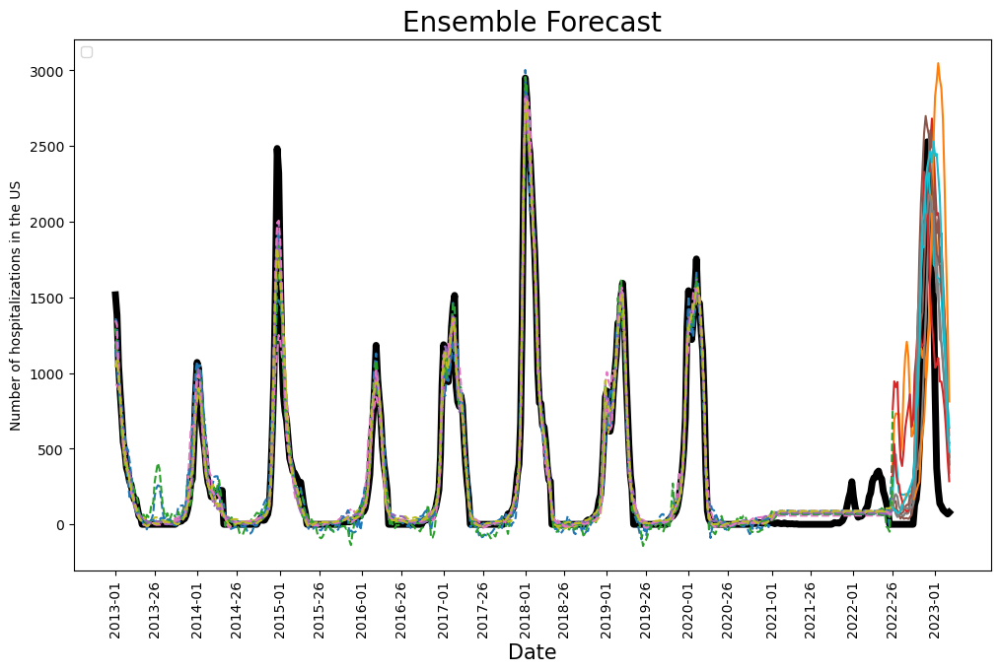

In [1702]:
plot_df = usa_infall_norm.copy()
plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2023-10'],linewidth=5,color='black')
for model in model_list:
    model = model.to(device)
    print(model.__class__.__name__)

    MODEL_PATH = PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_train.pth'
    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

    
    plot_df[model.__class__.__name__] = pred

    plt.rcParams['figure.figsize'] = (12, 7)

    
    #plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
    plt.plot(max_*plot_df[model.__class__.__name__].loc['2013-01':'2022-26'],linestyle="dashed")#,label=model.__class__.__name__+'(included)')
    plt.plot(max_*plot_df[model.__class__.__name__].loc['2022-26':'2023-10'])#label=model.__class__.__name__+'(prediction)',linewidth=1)
    plt.legend(loc='upper left')
    x_ticks=['2013-01','2013-26','2014-01','2014-26','2015-01','2015-26','2016-01','2016-26','2017-01','2017-26','2018-01','2018-26','2019-01','2019-26','2020-01','2020-26','2021-01','2021-26','2022-01','2022-26','2023-01']



    plt.xticks(ticks = x_ticks,rotation=90)
    plt.title('Ensemble Forecast',size =20)
    plt.ylabel('Number of hospitalizations in the US')
    plt.xlabel('Date',size=15)
    

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

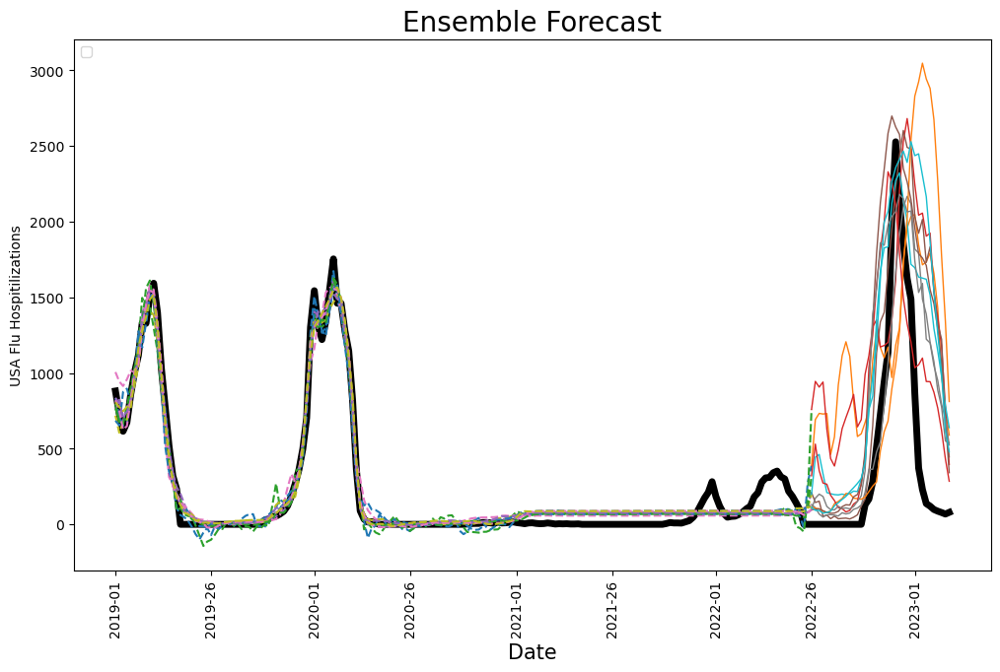

In [1703]:
plot_df = usa_infall_norm.copy()
plt.plot(max_*plot_df["INF_ALL"].loc['2019-01':'2023-10'],linewidth=5,color='black')

for model in model_list:
    model = model.to(device)

    MODEL_PATH = PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_train.pth'
    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

    
    plot_df[model.__class__.__name__] = pred

    plt.rcParams['figure.figsize'] = (20, 15)

    #plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
    plt.plot(max_*plot_df[model.__class__.__name__].loc['2019-01':'2022-26'],linestyle="dashed")
    plt.plot(max_*plot_df[model.__class__.__name__].loc['2022-26':'2023-10'],linewidth=1)
    plt.legend(loc='upper left')
    x_ticks=['2019-01','2019-26','2020-01','2020-26','2021-01','2021-26','2022-01','2022-26','2023-01']

    plt.xticks(ticks = x_ticks,rotation=90)
    plt.title('Ensemble Forecast',size =20)
    plt.ylabel('USA Flu Hospitilizations')
    plt.xlabel('Date',size=15)

In [1704]:
model_cols = plot_df.columns[2:]

plot_df['avg'] = plot_df[model_cols].T.mean().T
plot_df['std'] = plot_df[model_cols].T.std().T

(array([-500.,    0.,  500., 1000., 1500., 2000., 2500., 3000., 3500.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

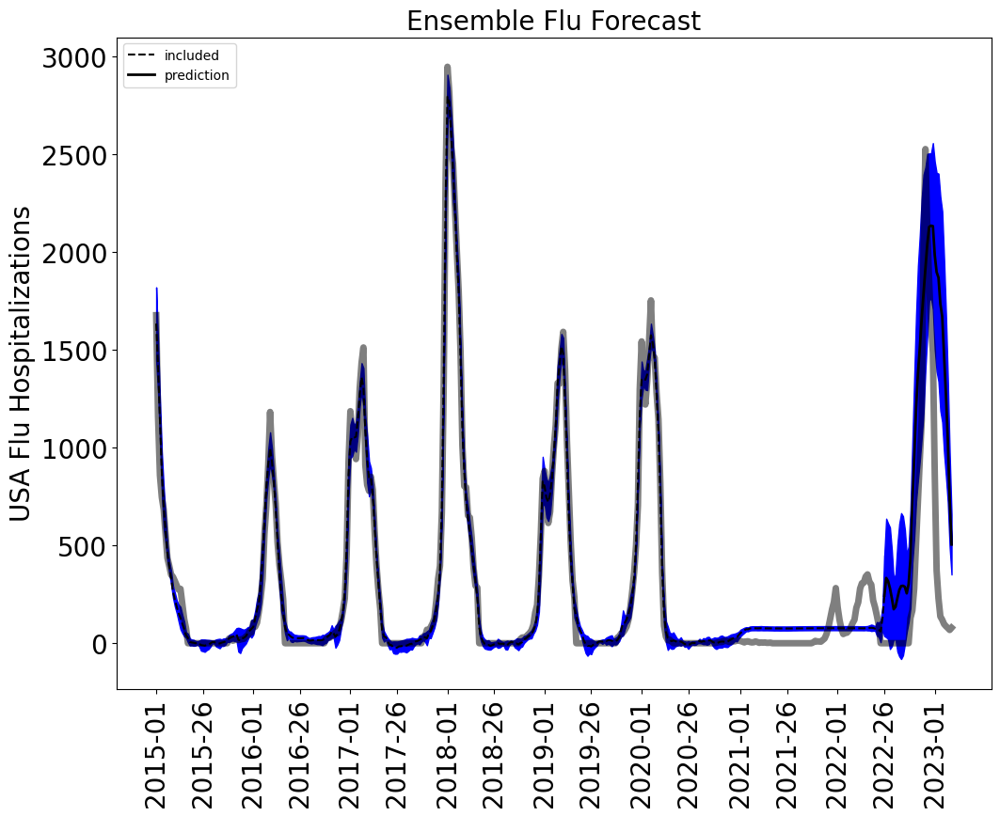

In [1720]:
plt.rcParams['figure.figsize'] = (12, 9)

plt.plot(max_*plot_df["INF_ALL"].loc['2015-01':'2023-10'],linewidth=5,color='black',alpha=0.5)
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df['avg'].loc['2015-01':'2022-26'],linestyle="dashed",label='included',color='black')

plt.fill_between(list(plot_df['avg'].loc['2015-01':'2022-26'].index),max_*(plot_df['avg']-plot_df['std']).loc['2015-01':'2022-26'],max_*(plot_df['avg']).loc['2015-01':'2022-26'],color='blue')
plt.fill_between(list(plot_df['avg'].loc['2015-01':'2022-26'].index),max_*(plot_df['avg']+plot_df['std']).loc['2015-01':'2022-26'],max_*(plot_df['avg']).loc['2015-01':'2022-26'],color='blue')


plt.plot(max_*plot_df['avg'].loc['2022-26':'2023-10'],label='prediction',linewidth=2,color='black')
#plt.plot(max_*(plot_df['avg']+plot_df['std']).loc['2022-26':'2023-10'],linewidth=1)
#plt.plot(max_*(plot_df['avg']-plot_df['std']).loc['2022-26':'2023-10'],linewidth=1)
plt.fill_between(list(plot_df['avg'].loc['2022-26':'2023-10'].index),max_*(plot_df['avg']-plot_df['std']).loc['2022-26':'2023-10'],max_*(plot_df['avg']).loc['2022-26':'2023-10'],color='blue')
plt.fill_between(list(plot_df['avg'].loc['2022-26':'2023-10'].index),max_*(plot_df['avg']+plot_df['std']).loc['2022-26':'2023-10'],max_*(plot_df['avg']).loc['2022-26':'2023-10'],color='blue')
plt.legend(loc='upper left')

x_ticks=['2015-01','2015-26','2016-01','2016-26','2017-01','2017-26','2018-01','2018-26','2019-01','2019-26','2020-01','2020-26','2021-01','2021-26','2022-01','2022-26','2023-01']



plt.xticks(ticks = x_ticks,rotation=90,size = 20)
plt.title('Ensemble Flu Forecast',size =20)
plt.ylabel('USA Flu Hospitalizations',size = 20)
plt.yticks(size = 20)

(array([-500.,    0.,  500., 1000., 1500., 2000., 2500., 3000., 3500.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

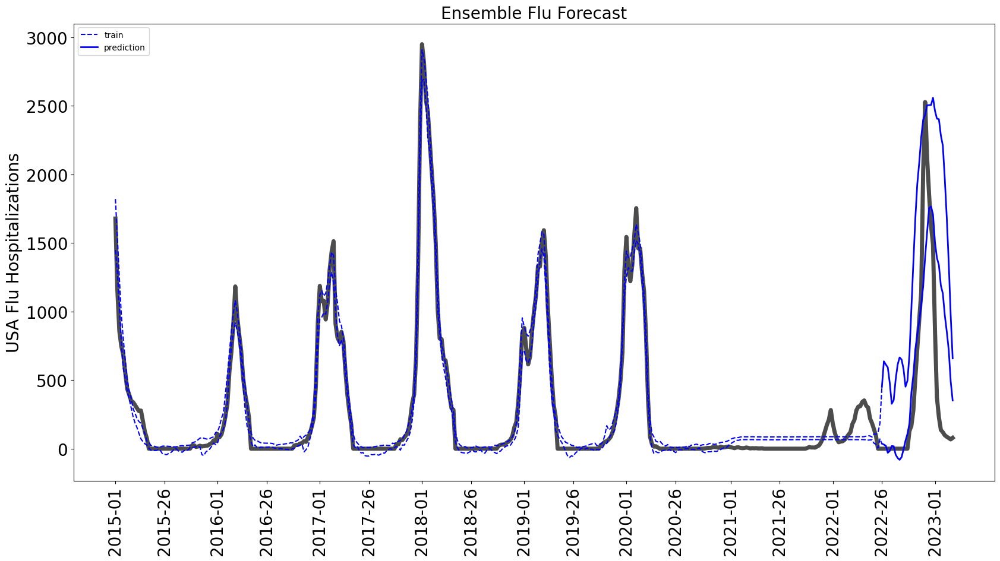

In [1716]:
plt.rcParams['figure.figsize'] = (20, 10)

plt.plot(max_*plot_df["INF_ALL"].loc['2015-01':'2023-10'],linewidth=5,color='black',alpha=0.7)
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*(plot_df['avg']-plot_df['std']).loc['2015-01':'2022-26'],linestyle="dashed",label='train',color='blue')
plt.plot(max_*(plot_df['avg']+plot_df['std']).loc['2015-01':'2022-26'],linestyle="dashed",color='blue')




plt.plot(max_*(plot_df['avg']-plot_df['std']).loc['2022-26':'2023-10'],label='prediction',linewidth=2,color='blue')
plt.plot(max_*(plot_df['avg']+plot_df['std']).loc['2022-26':'2023-10'],linewidth=2,color='blue')
#plt.plot(max_*(plot_df['avg']+plot_df['std']).loc['2022-26':'2023-10'],linewidth=1)
#plt.plot(max_*(plot_df['avg']-plot_df['std']).loc['2022-26':'2023-10'],linewidth=1)
plt.legend(loc='upper left')

x_ticks=['2015-01','2015-26','2016-01','2016-26','2017-01','2017-26','2018-01','2018-26','2019-01','2019-26','2020-01','2020-26','2021-01','2021-26','2022-01','2022-26','2023-01']



plt.xticks(ticks = x_ticks,rotation=90,size = 20)
plt.title('Ensemble Flu Forecast',size =20)
plt.ylabel('USA Flu Hospitalizations',size = 20)
plt.yticks(size = 20)
#plt.xlabel('Date',size=15)

Text(0.5, 0, 'Date')

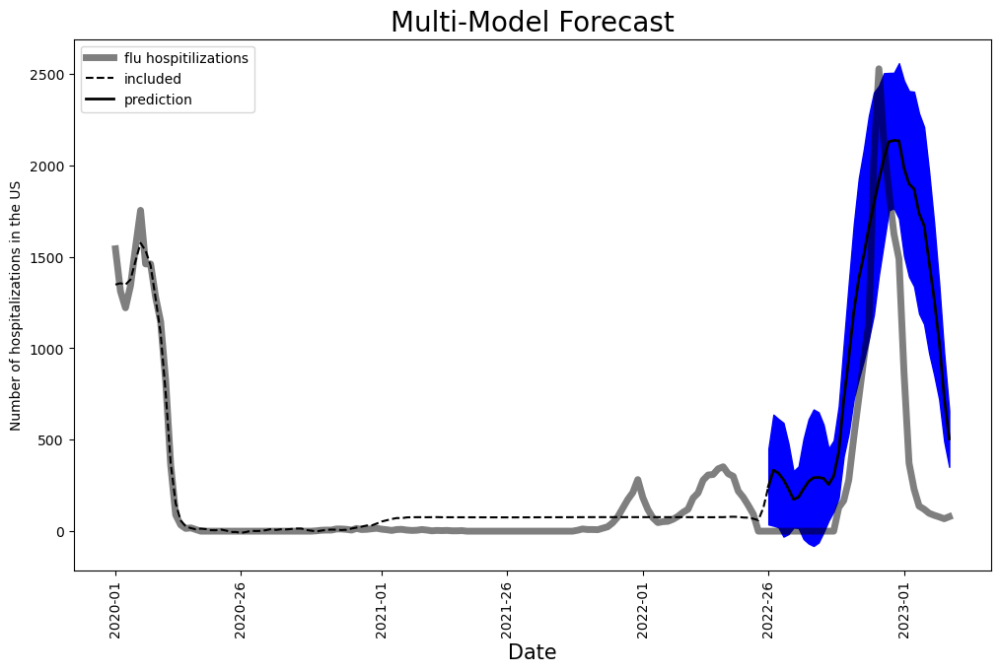

In [1682]:
plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2020-01':'2023-10'],linewidth=5,label='flu hospitilizations',alpha=0.5,color='black')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df['avg'].loc['2020-01':'2022-26'],linestyle="dashed",label='included',color='black')
plt.plot(max_*plot_df['avg'].loc['2022-26':'2023-10'],label='prediction',linewidth=2,color='black')
#plt.plot(max_*(plot_df['avg']+plot_df['std']).loc['2022-26':'2023-10'],linewidth=1)
#plt.plot(max_*(plot_df['avg']-plot_df['std']).loc['2022-26':'2023-10'],linewidth=1)
plt.fill_between(list(plot_df['avg'].loc['2022-26':'2023-10'].index),max_*(plot_df['avg']-plot_df['std']).loc['2022-26':'2023-10'],max_*(plot_df['avg']).loc['2022-26':'2023-10'],color='blue')
plt.fill_between(list(plot_df['avg'].loc['2022-26':'2023-10'].index),max_*(plot_df['avg']+plot_df['std']).loc['2022-26':'2023-10'],max_*(plot_df['avg']).loc['2022-26':'2023-10'],color='blue')
plt.legend(loc='upper left')

x_ticks=['2020-01','2020-26','2021-01','2021-26','2022-01','2022-26','2023-01']



plt.xticks(ticks = x_ticks,rotation=90)
plt.title('Multi-Model Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US')
plt.xlabel('Date',size=15)

In [1690]:
model_list = [rnn(26,9),gru(26,9), gru_drop(26,9), gru_3lay_drop(26,9), lstm_drop(26,9),  lstm_3lay_drop(26,9), lstm_cnn_drop(26,9),lstm_drop_B(26,9),rnn_drop_B(26,9),gru_drop_B(26,9)]


In [1686]:
tmp = pd.DataFrame(data=usa_infall_norm['INF_ALL'].values, columns =['all'],index=usa_infall_norm.index)
tmp['1_year'] = tmp['all'].shift(52-20)
tmp['2_year'] = tmp['all'].shift(2*52-20)
tmp['3_year'] = tmp['all'].shift(3*52-20)
tmp = tmp.join(df_in,on=usa_infall_norm.index)
tmp = tmp.fillna(0.0)

data_in = Dataset_(tmp["all"],tmp,26,26+20)

batched_sequence = data_in

(1227, 26, 9)
(1227,)


In [1691]:
plot_df = usa_infall_norm.copy()
for model in model_list:
    model = model.to(device)
    print(model.__class__.__name__)

    MODEL_PATH = PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019_train.pth'
    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

    
    plot_df[model.__class__.__name__] = pred

    plt.rcParams['figure.figsize'] = (12, 7)

    plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations',alpha=0.1)
    #plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
    plt.plot(max_*plot_df[model.__class__.__name__].loc['2013-01':'2019-26'],linestyle="dashed")#label=model.__class__.__name__+'(included)')
    plt.plot(max_*plot_df[model.__class__.__name__].loc['2019-26':'2020-10'],linewidth=1)
    plt.legend(loc='upper left')

    x_ticks=['2013-01','2013-26','2014-01','2014-26','2015-01','2015-26','2016-01','2016-26','2017-01','2017-26','2018-01','2018-26','2019-01','2019-26','2020-01']


    plt.xticks(ticks = x_ticks,rotation=90)
    plt.title('Multi-Model Forecast',size =20)
    plt.ylabel('Number of hospitalizations in the US')
    plt.xlabel('Date',size=15)

rnn


RuntimeError: Error(s) in loading state_dict for rnn:
	size mismatch for seq.3.weight: copying a param with shape torch.Size([1, 156]) from checkpoint, the shape in current model is torch.Size([1, 234]).

In [1605]:
model_cols = plot_df.columns[2:]

plot_df['avg'] = plot_df[model_cols].T.mean().T
plot_df['std'] = plot_df[model_cols].T.std().T

Text(0.5, 0, 'Date')

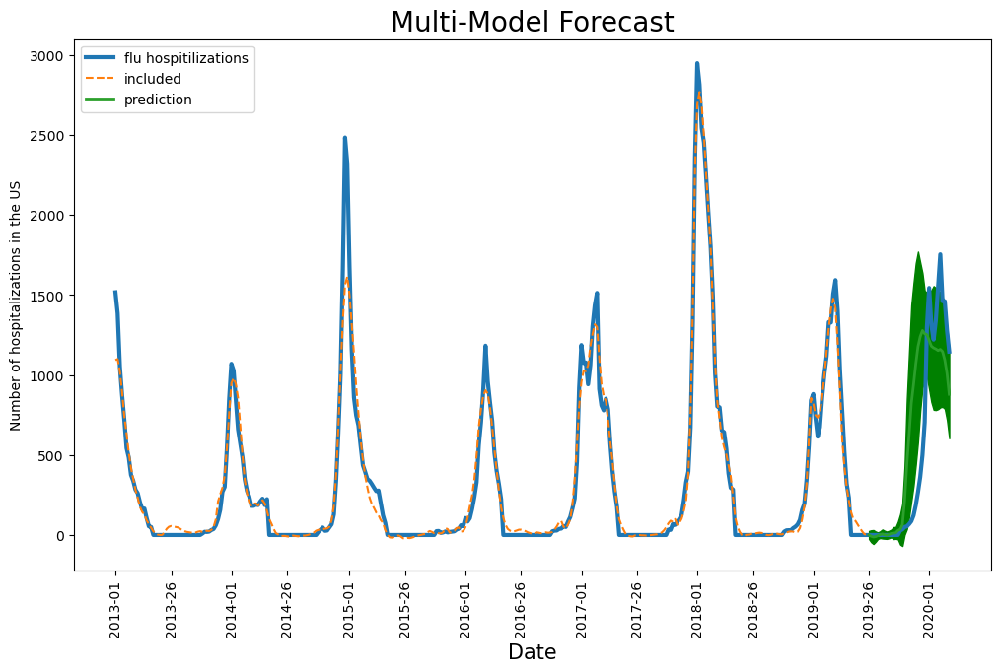

In [1608]:
plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations',alpha=1)
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df['avg'].loc['2013-01':'2019-26'],linestyle="dashed",label='included')
plt.plot(max_*plot_df['avg'].loc['2019-26':'2020-10'],label='prediction',linewidth=2)
#plt.plot(max_*(plot_df['avg']+plot_df['std']).loc['2022-26''2023-10'],linewidth=1)
#plt.plot(max_*(plot_df['avg']-plot_df['std']).loc['2022-26':'2023-10'],linewidth=1)
plt.fill_between(list(plot_df['avg'].loc['2019-26':'2020-10'].index),max_*(plot_df['avg']-plot_df['std']).loc['2019-26':'2020-10'],max_*(plot_df['avg']).loc['2019-26':'2020-10'],color='green')
plt.fill_between(list(plot_df['avg'].loc['2019-26':'2020-10'].index),max_*(plot_df['avg']+plot_df['std']).loc['2019-26':'2020-10'],max_*(plot_df['avg']).loc['2019-26':'2020-10'],color='green')
plt.legend(loc='upper left')

x_ticks=['2013-01','2013-26','2014-01','2014-26','2015-01','2015-26','2016-01','2016-26','2017-01','2017-26','2018-01','2018-26','2019-01','2019-26','2020-01']


plt.xticks(ticks = x_ticks,rotation=90)
plt.title('Multi-Model Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US')
plt.xlabel('Date',size=15)

In [1651]:
model_list = [rnn(26,9),gru(26,9), gru_drop(26,9), gru_3lay_drop(26,9), lstm_drop(26,9),  lstm_3lay_drop(26,9), lstm_cnn_drop(26,9),lstm_drop_B(26,9),rnn_drop_B(26,9),gru_drop_B(26,9)]
#model_list = [rnn_drop(26,6),rnn(26,6),lstm(26),gru(26,6), gru_drop(26), gru_3lay_drop(26), lstm_drop(26,6),  lstm_3lay_drop(26), lstm_cnn_drop(26,6),lstm_drop_B(26,6),rnn_drop_B(26,6),gru_drop_B(26,6)]

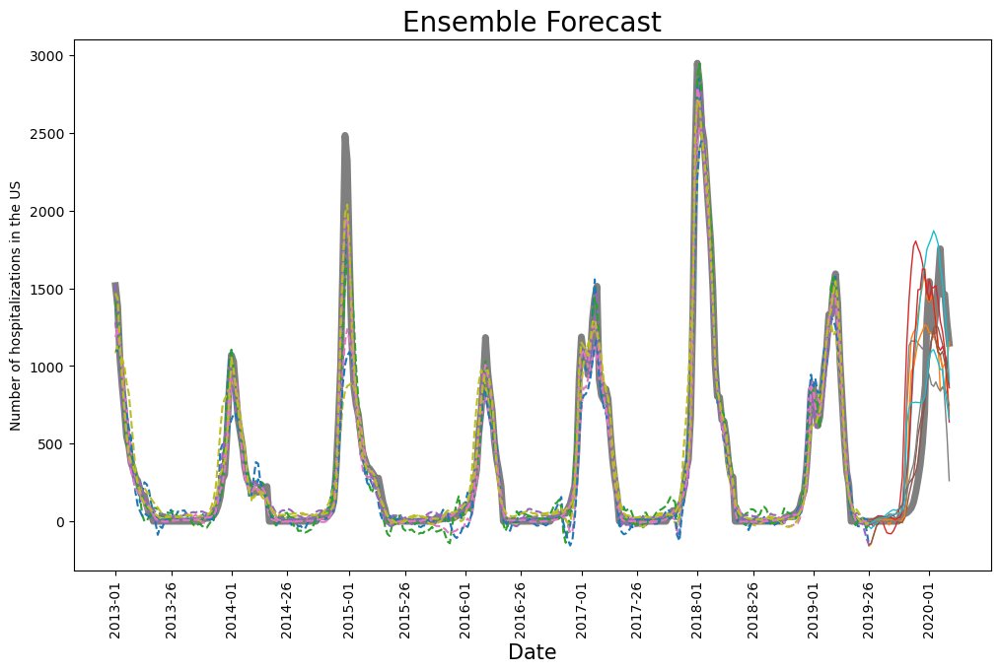

In [1694]:
plot_df = usa_infall_norm.copy()
plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=5,alpha=0.5,color='black')
for model in model_list:
    model = model.to(device)

    MODEL_PATH = PATH = 'C:\\Users\\christopher.johnson\\Documents\\GitHub\\flu\\'+model.__class__.__name__+'_2019_usa_train.pth'
    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)

    
    plot_df[model.__class__.__name__] = pred

    plt.rcParams['figure.figsize'] = (12, 7)

    
    #plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
    plt.plot(max_*plot_df[model.__class__.__name__].loc['2013-01':'2019-26'],linestyle="dashed",label=model.__class__.__name__+'(included)')
    plt.plot(max_*plot_df[model.__class__.__name__].loc['2019-26':'2020-10'],label=model.__class__.__name__+'(prediction)',linewidth=1)
    #plt.legend(loc='upper left')

    x_ticks=['2013-01','2013-26','2014-01','2014-26','2015-01','2015-26','2016-01','2016-26','2017-01','2017-26','2018-01','2018-26','2019-01','2019-26','2020-01']


    plt.xticks(ticks = x_ticks,rotation=90)
    plt.title('Ensemble Forecast',size =20)
    plt.ylabel('Number of hospitalizations in the US')
    plt.xlabel('Date',size=15)

In [1696]:
model_cols = plot_df.columns[2:]

plot_df['avg'] = plot_df[model_cols].T.mean().T
plot_df['std'] = plot_df[model_cols].T.std().T

Text(0.5, 0, 'Date')

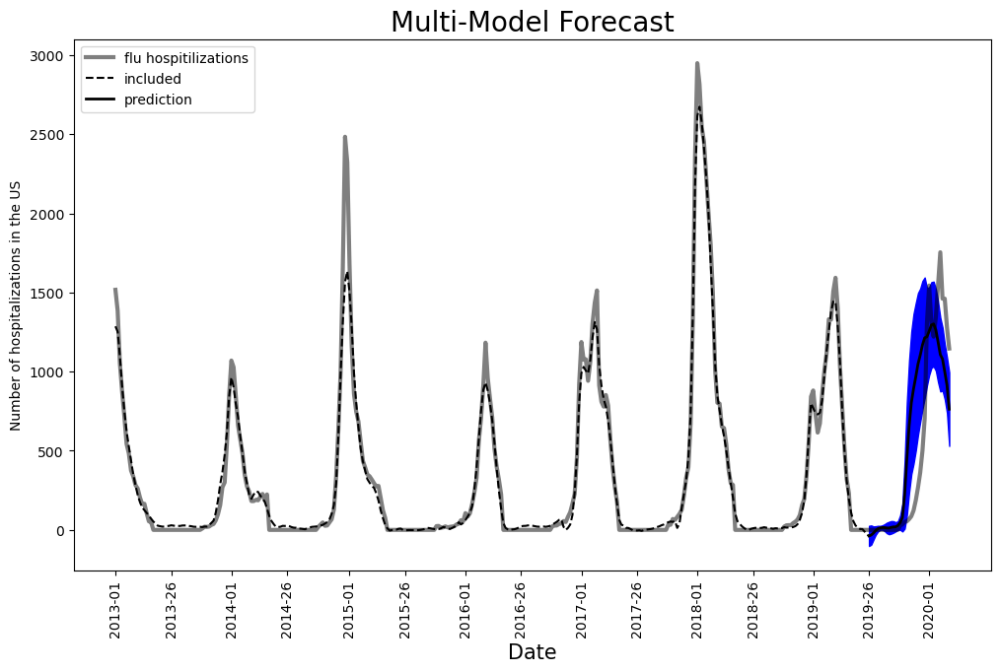

In [1697]:
plt.rcParams['figure.figsize'] = (12, 7)

plt.plot(max_*plot_df["INF_ALL"].loc['2013-01':'2020-10'],linewidth=3,label='flu hospitilizations',alpha=0.5,color='black')
#plt.plot(plot_df["AUS_flu"].loc['2015-01':'2023-10'])
plt.plot(max_*plot_df['avg'].loc['2013-01':'2019-26'],linestyle="dashed",label='included',color='black')
plt.plot(max_*plot_df['avg'].loc['2019-26':'2020-10'],label='prediction',linewidth=2,color='black')
#plt.plot(max_*(plot_df['avg']+plot_df['std']).loc['2022-26''2023-10'],linewidth=1)
#plt.plot(max_*(plot_df['avg']-plot_df['std']).loc['2022-26':'2023-10'],linewidth=1)
plt.fill_between(list(plot_df['avg'].loc['2019-26':'2020-10'].index),max_*(plot_df['avg']-plot_df['std']).loc['2019-26':'2020-10'],max_*(plot_df['avg']).loc['2019-26':'2020-10'],color='blue')
plt.fill_between(list(plot_df['avg'].loc['2019-26':'2020-10'].index),max_*(plot_df['avg']+plot_df['std']).loc['2019-26':'2020-10'],max_*(plot_df['avg']).loc['2019-26':'2020-10'],color='blue')
plt.legend(loc='upper left')

x_ticks=['2013-01','2013-26','2014-01','2014-26','2015-01','2015-26','2016-01','2016-26','2017-01','2017-26','2018-01','2018-26','2019-01','2019-26','2020-01']


plt.xticks(ticks = x_ticks,rotation=90)
plt.title('Multi-Model Forecast',size =20)
plt.ylabel('Number of hospitalizations in the US')
plt.xlabel('Date',size=15)

# Write to csv

In [127]:
model_list = [gru_drop(26,6),lstm_cnn_drop(26,6), lstm_drop(26,6),lstm(26),lstm_drop_B(26,6),gru_drop_B(26,6)]
model_names = ['two_GRU_two_Linear','two_LSTM_one_CNN_two_Linear','two_LSTM_two_Linear','two_LSTM_one_Linear','two_LSTM_three_Linear','two_GRU_three_LSTM','USA']
c=0
predictions = []
for i in range(len(model_list)):

    model = model_list[i].to(device)
    PATH = 'Q:\\00- PROJECTS\\Flu Forecasts\\flu\\flu\\models\\'+model.__class__.__name__+'.pth'
    MODEL_PATH = PATH[:-4]+"_train.pth"
    pred = create_prediction(MODEL_PATH,model,device,batched_sequence,0,0,True)
    predictions.append(pred)

predictions.append(usa_infall_norm.to_numpy())

In [128]:
predictions = np.array(predictions)[:,:,0]
pred_df = pd.DataFrame(data=predictions.T, columns = model_names,index = usa_infall_norm.index)

In [129]:
pred_df.to_csv('models_flu.csv')

In [131]:
pred_df.to_excel('models_flu.xlsx')